In [ ]:
import numpy as np
import pywt
import matplotlib.pyplot as plt
import math

# statistical tools for time series: 
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller

#ML tools
from keras.models import Sequential
from keras.layers import Dense, LSTM, SimpleRNN
#from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from keras.callbacks import EarlyStopping

#Use to import pandas
import pandas as pd
#Use to import the file into google Colab drive
from google.colab import files 
#Use to import io, which opens the file from the Colab drive
import io

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
uploaded = files.upload()

Saving SPI_trial.xlsx to SPI_trial.xlsx


In [ ]:
# Now use the below code to read the excel in pandas' dataframe
df= (pd.read_excel(io=uploaded['SPI_trial.xlsx'],sheet_name='Sheet2'))
signal = df["value"]

In [ ]:
cutpoint1 = int(len(signal)*0.8)
cutpoint2 = int(len(signal)*0.9)
train = signal[:(cutpoint1),].values
valid= signal[:cutpoint2,].values
test = signal.values

In [ ]:
windowSize = 20
timeLead = 1

In [ ]:
# Try with the normal decomposition method, without window size. 
def to_sequences(train,timeLead = 1,windowSize =1, seq_size=1):
   x = []
   y = []

   for i in range(len(train)-windowSize- timeLead +1):
       #print(i)
       input = train[:(i+windowSize),]

       #inputPad = np.pad(input,(padLen_in,0), mode = 'reflect')
       (cA2_in,cD2_in, cD1_in) = pywt.wavedec(input, 'db2', level = 2)

   

       #se1_in = pywt.iswt([(cA2_in, np.zeros((len(cD2_in),))),(np.zeros((len(cA1_in),)),np.zeros((len(cD1_in),)))], 'db2')
       #se2_in = pywt.iswt([(np.zeros((len(cA2_in),)), cD2_in),(np.zeros((len(cA1_in),)),np.zeros((len(cD1_in),)))], 'db2')
       #se3_in = pywt.iswt([(np.zeros((len(cA2_in),)), (np.zeros((len(cD2_in),)))),(cA1_in, cD1_in)], 'db2')
       #window1 = se1_in[-seq_size:,]
       #window2 = se2_in[-seq_size:,]
       #window3 = se3_in[-seq_size:,]

       #window1 = cA1_in[-seq_size:,]
       #window2 = cD1_in[-seq_size:,]
       window1 = cA2_in[-seq_size:,]
       window2 = cD2_in[-seq_size:,]
       window3 = cD1_in[-seq_size:,]



       window = np.array([window1,window2,window3]).reshape(seq_size*3)    
    
       #window = np.array([window1,window2]).reshape(seq_size*2) # for level 1 

       x.append(window)
       y.append(train[i + windowSize + timeLead - 1, ])
        
   return np.array(x),np.array(y)

# WaveletNN

In [ ]:
seq_size = 2
nodeNum = 19

In [ ]:
xTr, yTr = to_sequences(train, timeLead, windowSize, seq_size)
xVal_retr, yVal_retr= to_sequences(valid, timeLead, windowSize, seq_size)
xTest_retr, yTest_retr = to_sequences(test, timeLead, windowSize, seq_size)
xVal = xVal_retr[-(cutpoint2-cutpoint1):,]
yVal = yVal_retr[-(cutpoint2-cutpoint1):,]
xTest = xTest_retr[-(len(signal)-cutpoint2):,]
yTest = yTest_retr[-(len(signal)-cutpoint2):,]

In [ ]:
# how to check epoch peroformance and overfitting:
#https://machinelearningmastery.com/how-to-stop-training-deep-neural-networks-at-the-right-time-using-early-stopping/
# define model
model = Sequential()
model.add(Dense(nodeNum, input_dim=seq_size*3, activation='relu'))  # notice to chane the input_dim with different levels of wavelet decomposition
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam', metrics = ['mae'])
#model.compile(loss='mean_squared_error', optimizer='adam')

print(model.summary()) 
#model.fit(trainX, trainY, epochs=200, batch_size=2, verbose=2)
# patient early stopping
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience = 10)
history = model.fit(xTr, yTr, verbose=0, epochs=200, validation_data=(xVal,yVal),callbacks = [es])

Model: "sequential_480"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_960 (Dense)           (None, 20)                200       
                                                                 
 dense_961 (Dense)           (None, 1)                 21        
                                                                 
Total params: 221
Trainable params: 221
Non-trainable params: 0
_________________________________________________________________
None
Epoch 52: early stopping


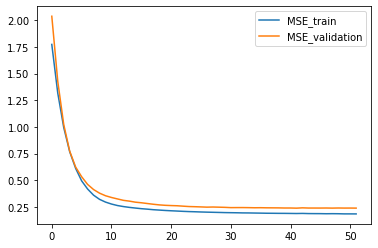

In [ ]:
# plot training history (check the performance of the number of epochs)
plt.plot(history.history['loss'], label='MSE_train')
plt.plot(history.history['val_loss'], label='MSE_validation')
plt.legend()
plt.show()

In [ ]:
model.evaluate(xVal, yVal, verbose=0)

[0.2377094179391861, 0.373751699924469]

In [ ]:
validPredict = model.predict(xVal)
validScore = math.sqrt(mean_squared_error(yVal, validPredict[:,0]))
print('Train Score: %.2f RMSE' % (validScore))

Train Score: 0.49 RMSE


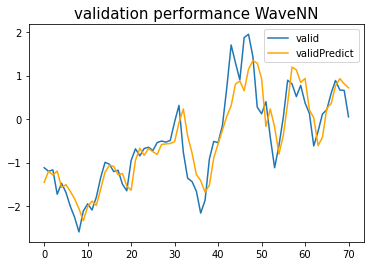

In [ ]:
#plot result 
plt.title('validation performance WaveNN', size=15)
plt.plot(yVal, label='valid')
plt.plot(validPredict, label='validPredict', color='orange')
plt.legend();

performance in the test set

In [ ]:
# how to check epoch peroformance and overfitting:
#https://machinelearningmastery.com/how-to-stop-training-deep-neural-networks-at-the-right-time-using-early-stopping/
# define model
model = Sequential()
model.add(Dense(nodeNum, input_dim=seq_size*3, activation='relu'))  # notice change the input_dim when changing the level of wavelet decomposition 
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam', metrics = ['mae'])
#model.compile(loss='mean_squared_error', optimizer='adam')

print(model.summary()) 
#model.fit(trainX, trainY, epochs=200, batch_size=2, verbose=2)
# patient early stopping
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience = 20)
history = model.fit(xVal_retr, yVal_retr, verbose=0, epochs=200, validation_data=(xTest,yTest),callbacks = [es])

Model: "sequential_520"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1040 (Dense)          (None, 19)                133       
                                                                 
 dense_1041 (Dense)          (None, 1)                 20        
                                                                 
Total params: 153
Trainable params: 153
Non-trainable params: 0
_________________________________________________________________
None
Epoch 106: early stopping


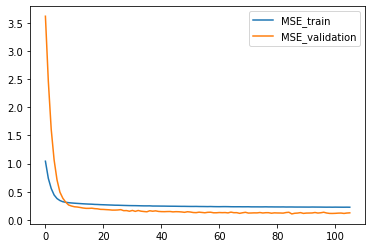

In [ ]:
# plot training history (check the performance of the number of epochs)
plt.plot(history.history['loss'], label='MSE_train')
plt.plot(history.history['val_loss'], label='MSE_validation')
plt.legend()
plt.show()

In [ ]:
model.evaluate(xTest, yTest, verbose=0)

[0.12625472247600555, 0.2856884002685547]

In [ ]:
testPredict = model.predict(xTest)
testScore = math.sqrt(mean_squared_error(yTest, testPredict[:,0]))
print('Train Score: %.2f RMSE' % (testScore))

Train Score: 0.36 RMSE


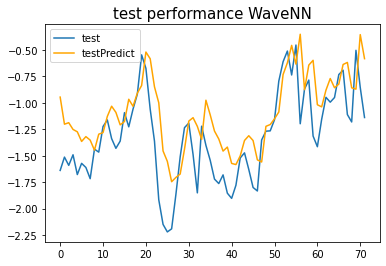

In [ ]:
  #plot result test set
plt.title('test performance WaveNN', size=15)
plt.plot(yTest, label='test')
plt.plot(testPredict, label='testPredict', color='orange')
plt.legend();

# Find WaveletNN structure

In [ ]:
nodeList = np.arange(4, 21, 1) 
#seqList = np.array([3,4,5])
#nodeList = np.arange(18, 20, 1) 
seqList = [2,3,4]

In [ ]:
def WaveletNNmodel (signal, seq_size,windowSize,nodeNum, timeLead,epochNum):
  # data division
  cutpoint1 = int(len(signal)*0.8)
  cutpoint2 = int(len(signal)*0.9)
  train = signal[:(cutpoint1)].values
  valid= signal[:cutpoint2].values
  test = signal.values
  
  # Create input and target format: 
  xTr, yTr = to_sequences(train, timeLead, windowSize, seq_size)
  xVal_retr, yVal_retr= to_sequences(valid, timeLead, windowSize, seq_size)
  xTest_retr, yTest_retr = to_sequences(test, timeLead, windowSize, seq_size)
  xVal = xVal_retr[-(cutpoint2-cutpoint1):,]
  yVal = yVal_retr[-(cutpoint2-cutpoint1):,]
  xTest = xTest_retr[-(len(signal)-cutpoint2):,]
  yTest = yTest_retr[-(len(signal)-cutpoint2):,]
  
  # define model
  model = Sequential()
  model.add(Dense(nodeNum, input_dim=seq_size*3, activation='relu'))   # notice to chane the input_dim with different levels of wavelet decomposition
  model.add(Dense(1))
  model.compile(loss='mean_squared_error', optimizer='adam', metrics = ['mae'])
  #print(model.summary()) 
  # patient early stopping
  es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience = 15)
  #history = model.fit(xVal_retr, yVal_retr, verbose=0, epochs=nodeNum, validation_data=(xTest,yTest),callbacks = [es])
  history = model.fit(xTr, yTr, verbose=0, epochs=200, validation_data=(xVal,yVal),callbacks = [es])
  # evaluate the model
  mseTr, maeTr = model.evaluate(xTr, yTr, verbose=0)
  mseVal, maeVal = model.evaluate(xVal,yVal,verbose=0)

  return mseTr, maeTr, mseVal, maeVal, history

0
the time lag for prediction is: 2.0 
the number of nodes in the hidden layer is: 4.0 
Epoch 39: early stopping
mseval 0.86


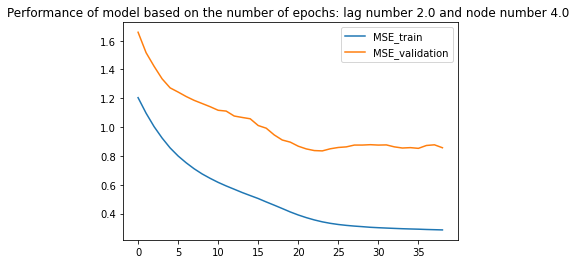

the number of nodes in the hidden layer is: 5.0 
Epoch 85: early stopping
mseval 0.45


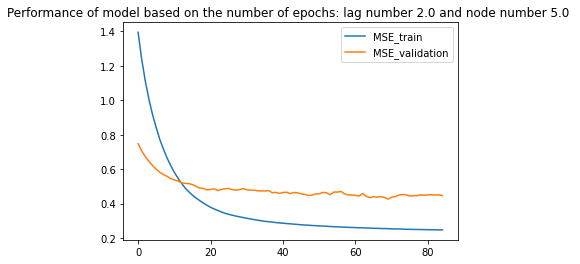

the number of nodes in the hidden layer is: 6.0 
Epoch 189: early stopping
mseval 0.52


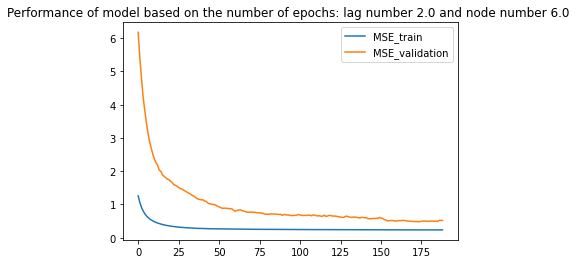

the number of nodes in the hidden layer is: 7.0 
Epoch 21: early stopping
mseval 0.52


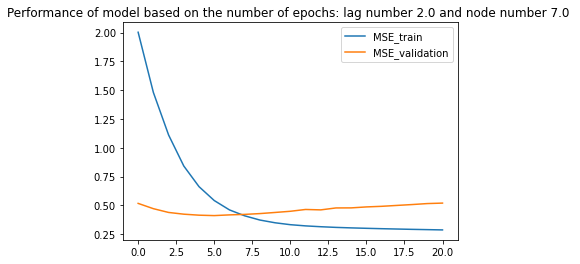

the number of nodes in the hidden layer is: 8.0 
mseval 0.54


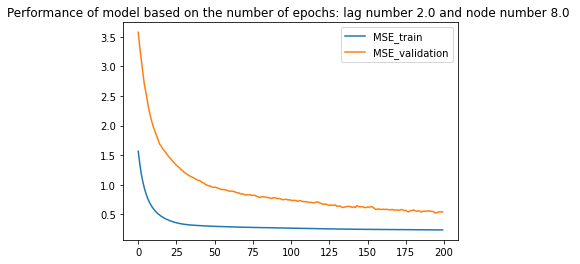

the number of nodes in the hidden layer is: 9.0 
Epoch 132: early stopping
mseval 0.60


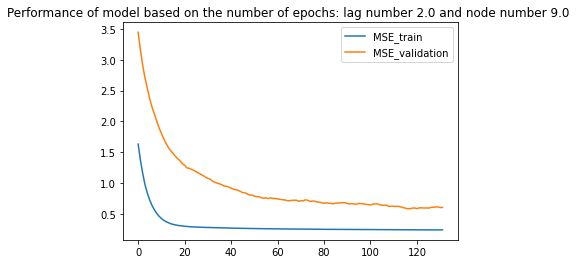

the number of nodes in the hidden layer is: 10.0 
Epoch 101: early stopping
mseval 0.50


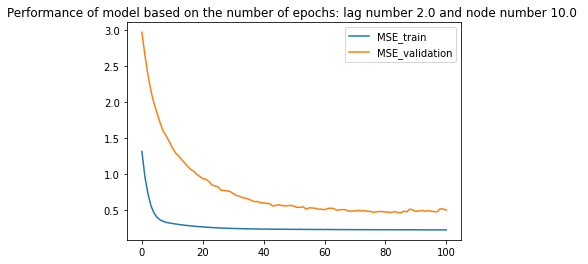

the number of nodes in the hidden layer is: 11.0 
Epoch 31: early stopping
mseval 0.48


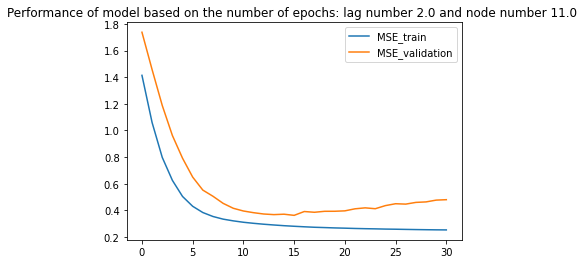

the number of nodes in the hidden layer is: 12.0 
Epoch 16: early stopping
mseval 0.43


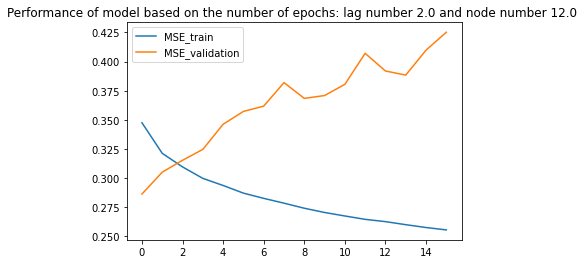

the number of nodes in the hidden layer is: 13.0 
Epoch 20: early stopping
mseval 0.43


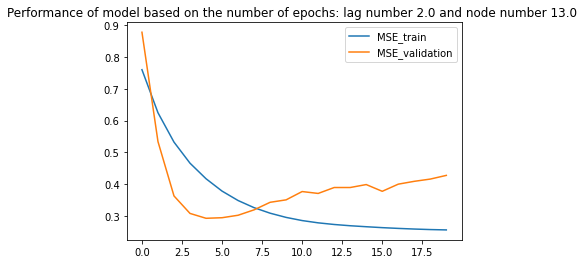

the number of nodes in the hidden layer is: 14.0 
Epoch 27: early stopping
mseval 0.58


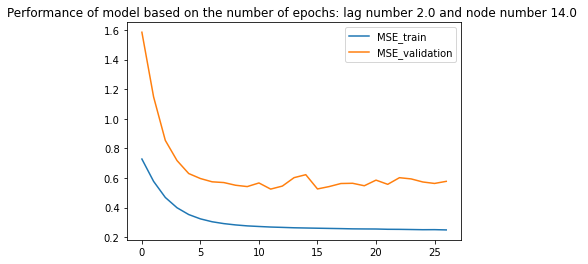

the number of nodes in the hidden layer is: 15.0 
Epoch 34: early stopping
mseval 0.45


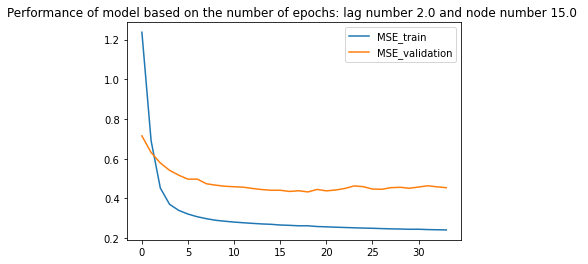

the number of nodes in the hidden layer is: 16.0 
Epoch 133: early stopping
mseval 0.48


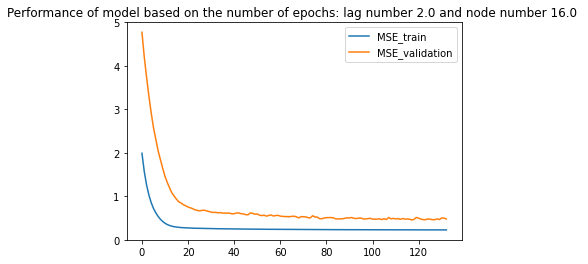

the number of nodes in the hidden layer is: 17.0 
Epoch 22: early stopping
mseval 0.52


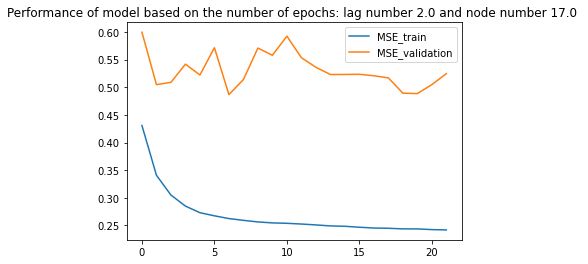

the number of nodes in the hidden layer is: 18.0 
Epoch 16: early stopping
mseval 0.56


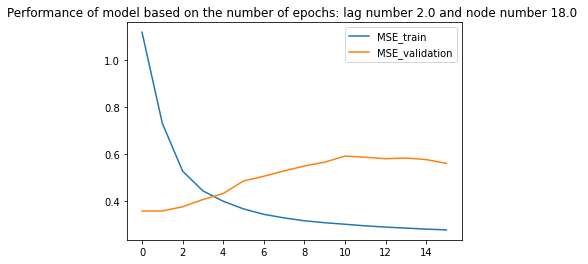

the number of nodes in the hidden layer is: 19.0 
Epoch 24: early stopping
mseval 0.50


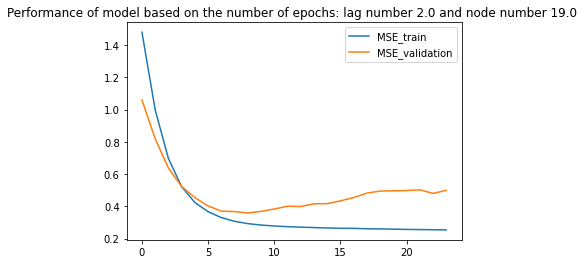

the number of nodes in the hidden layer is: 20.0 
Epoch 26: early stopping
mseval 0.64


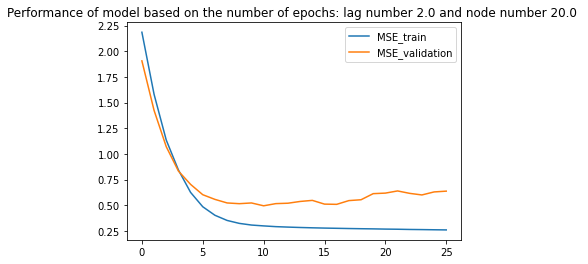

the time lag for prediction is: 3.0 
the number of nodes in the hidden layer is: 4.0 
Epoch 38: early stopping
mseval 0.60


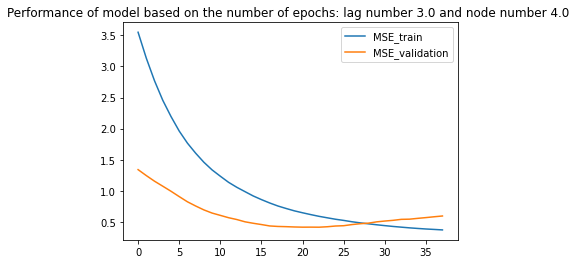

the number of nodes in the hidden layer is: 5.0 
Epoch 32: early stopping
mseval 0.57


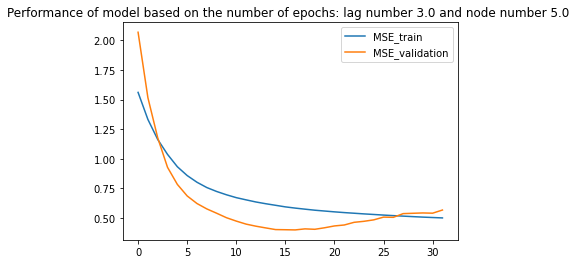

the number of nodes in the hidden layer is: 6.0 
Epoch 16: early stopping
mseval 0.61


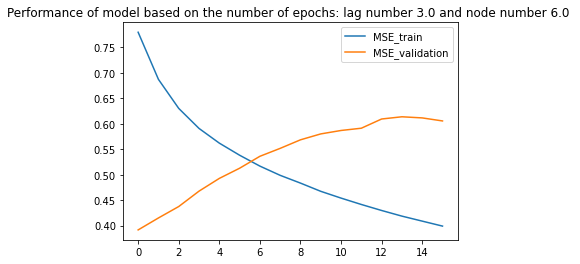

the number of nodes in the hidden layer is: 7.0 
Epoch 32: early stopping
mseval 0.92


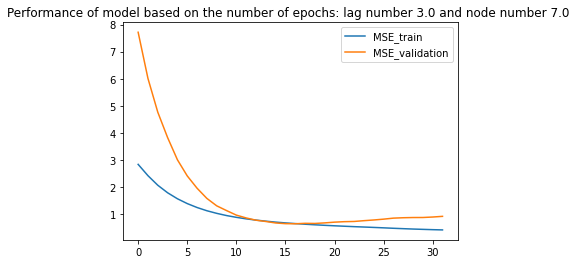

the number of nodes in the hidden layer is: 8.0 
Epoch 40: early stopping
mseval 0.28


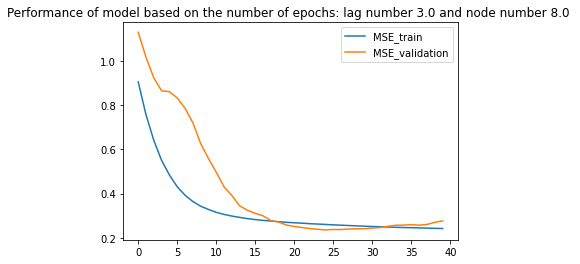

the number of nodes in the hidden layer is: 9.0 
Epoch 18: early stopping
mseval 0.54


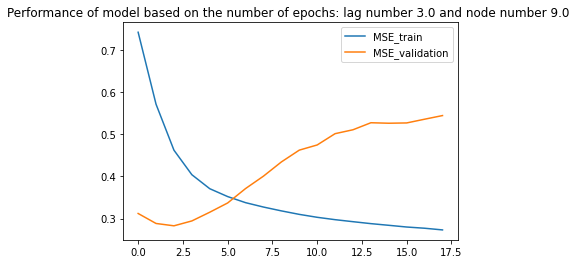

the number of nodes in the hidden layer is: 10.0 
Epoch 30: early stopping
mseval 1.02


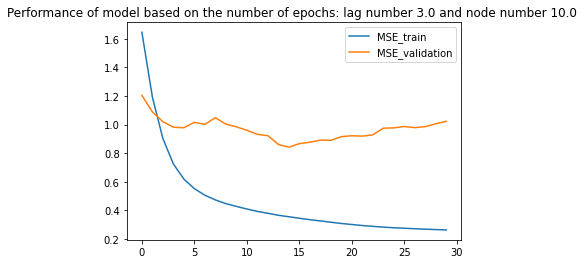

the number of nodes in the hidden layer is: 11.0 
Epoch 190: early stopping
mseval 0.53


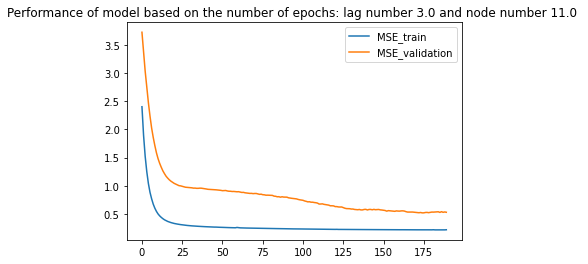

the number of nodes in the hidden layer is: 12.0 
Epoch 110: early stopping
mseval 0.69


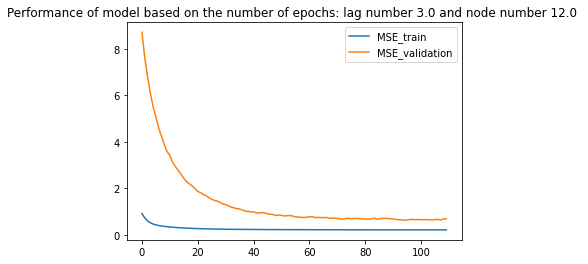

the number of nodes in the hidden layer is: 13.0 
Epoch 30: early stopping
mseval 0.68


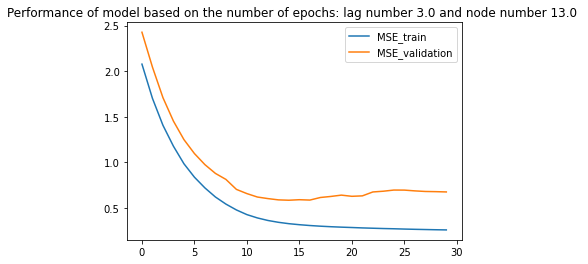

the number of nodes in the hidden layer is: 14.0 
Epoch 184: early stopping
mseval 0.77


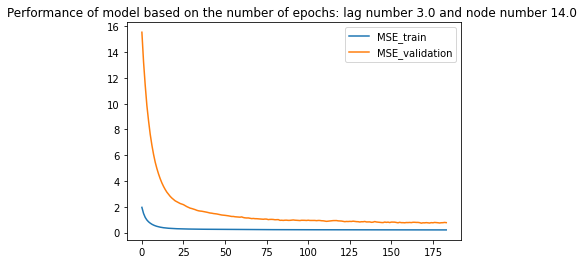

the number of nodes in the hidden layer is: 15.0 
Epoch 19: early stopping
mseval 0.47


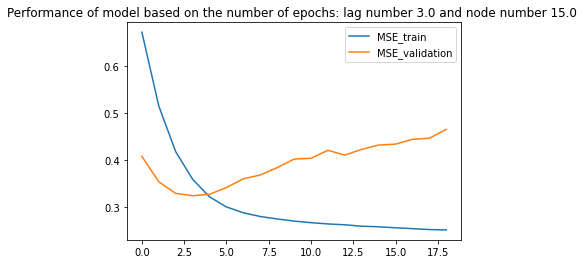

the number of nodes in the hidden layer is: 16.0 
Epoch 90: early stopping
mseval 0.98


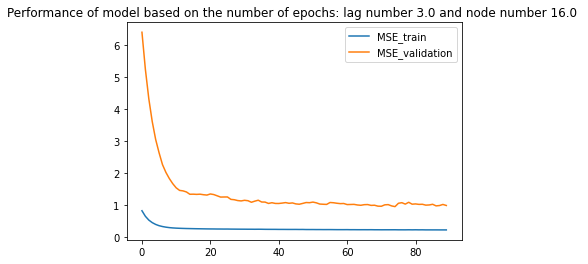

the number of nodes in the hidden layer is: 17.0 
Epoch 22: early stopping
mseval 0.45


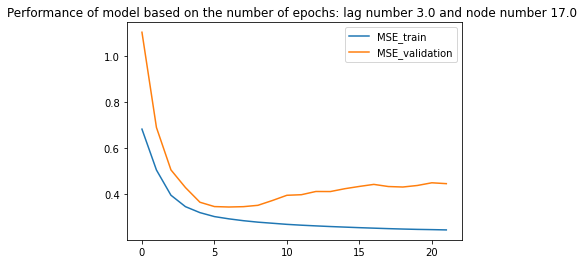

the number of nodes in the hidden layer is: 18.0 
Epoch 36: early stopping
mseval 0.40


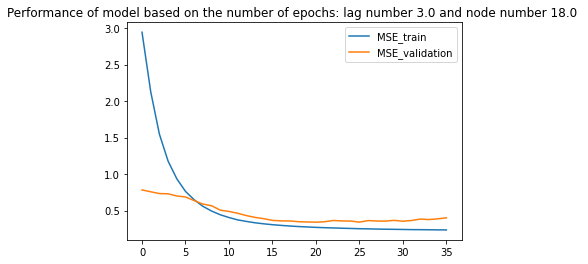

the number of nodes in the hidden layer is: 19.0 
Epoch 125: early stopping
mseval 0.47


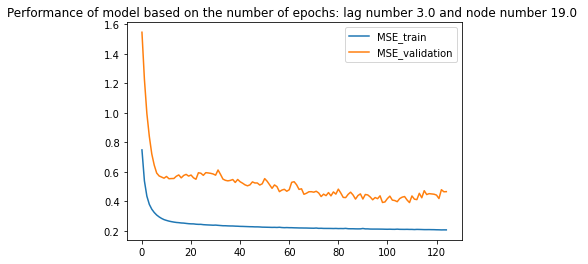

the number of nodes in the hidden layer is: 20.0 
Epoch 34: early stopping
mseval 0.54


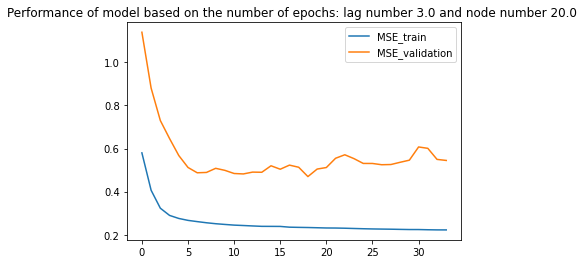

the time lag for prediction is: 4.0 
the number of nodes in the hidden layer is: 4.0 
Epoch 49: early stopping
mseval 0.37


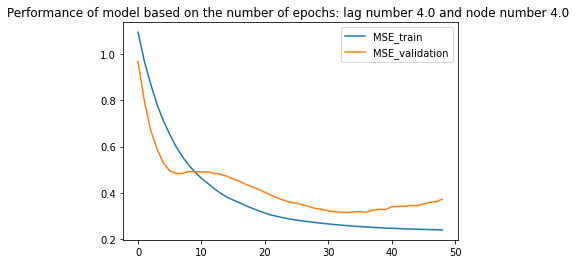

the number of nodes in the hidden layer is: 5.0 
Epoch 28: early stopping
mseval 0.52


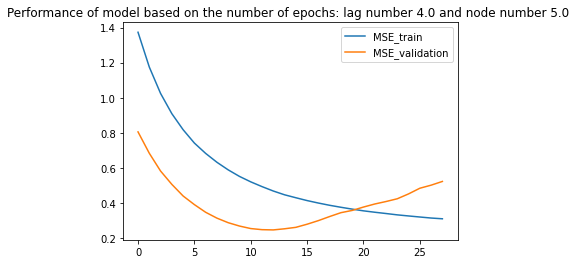

the number of nodes in the hidden layer is: 6.0 
Epoch 59: early stopping
mseval 0.59


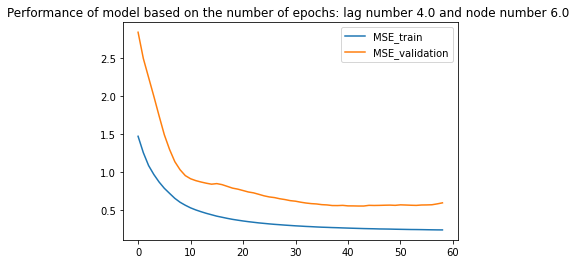

the number of nodes in the hidden layer is: 7.0 
Epoch 21: early stopping
mseval 0.49


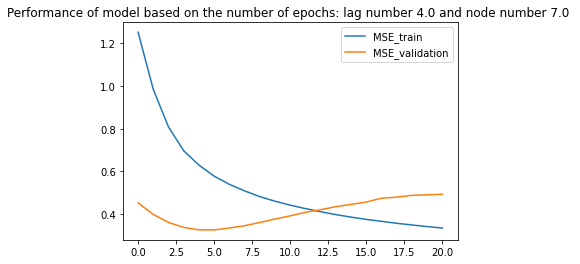

the number of nodes in the hidden layer is: 8.0 
mseval 0.88


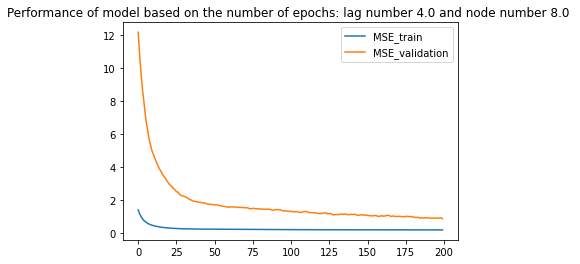

the number of nodes in the hidden layer is: 9.0 
Epoch 87: early stopping
mseval 0.93


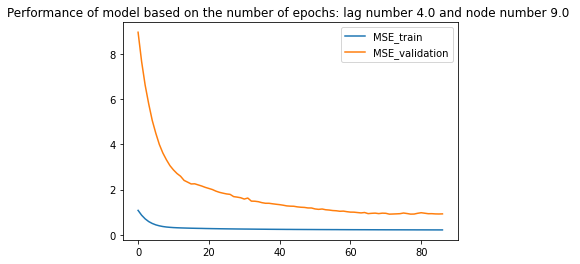

the number of nodes in the hidden layer is: 10.0 
Epoch 82: early stopping
mseval 0.72


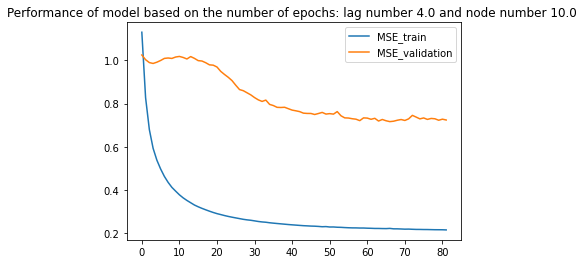

the number of nodes in the hidden layer is: 11.0 
Epoch 158: early stopping
mseval 0.42


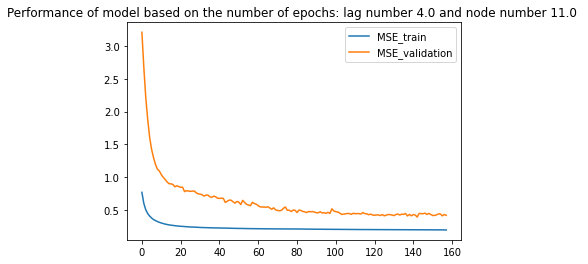

the number of nodes in the hidden layer is: 12.0 
Epoch 107: early stopping
mseval 0.97


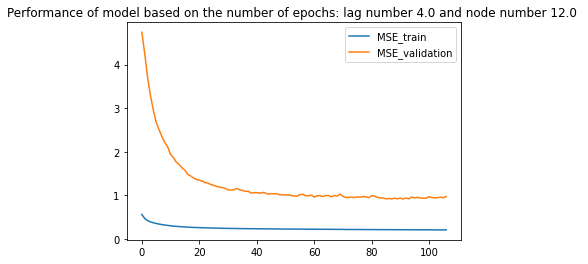

the number of nodes in the hidden layer is: 13.0 
Epoch 29: early stopping
mseval 1.21


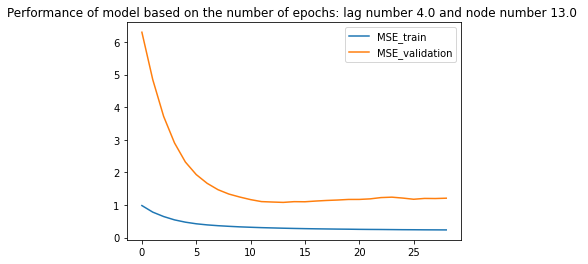

the number of nodes in the hidden layer is: 14.0 
Epoch 18: early stopping
mseval 0.42


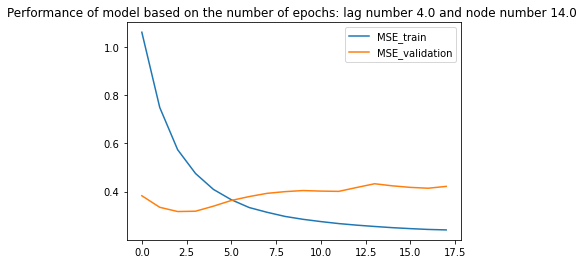

the number of nodes in the hidden layer is: 15.0 
Epoch 98: early stopping
mseval 0.36


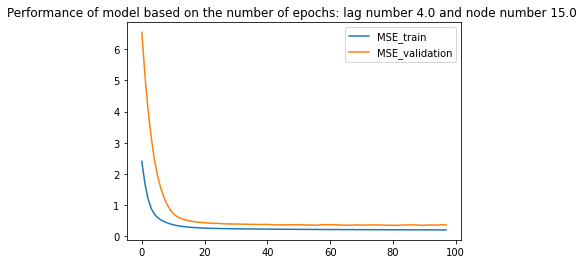

the number of nodes in the hidden layer is: 16.0 
Epoch 32: early stopping
mseval 0.34


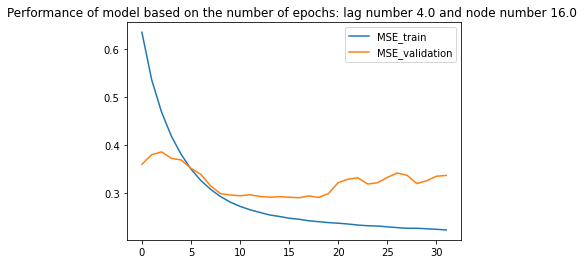

the number of nodes in the hidden layer is: 17.0 
Epoch 48: early stopping
mseval 0.54


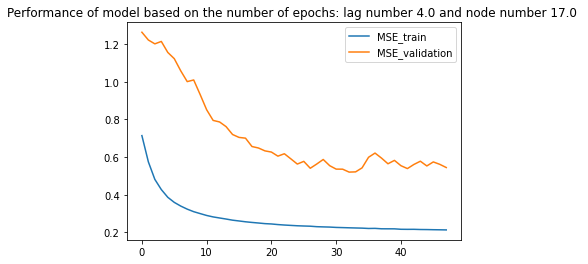

the number of nodes in the hidden layer is: 18.0 
Epoch 30: early stopping
mseval 0.40


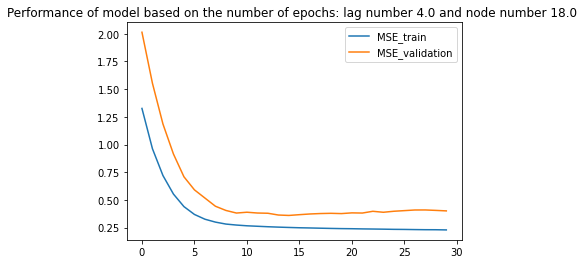

the number of nodes in the hidden layer is: 19.0 
Epoch 27: early stopping
mseval 0.43


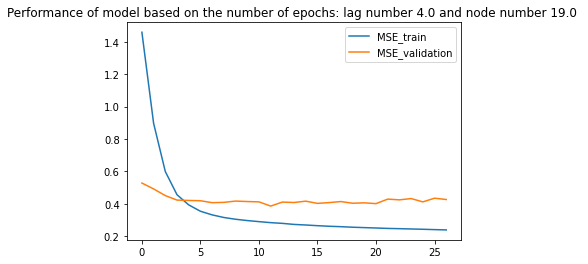

the number of nodes in the hidden layer is: 20.0 
Epoch 43: early stopping
mseval 0.52


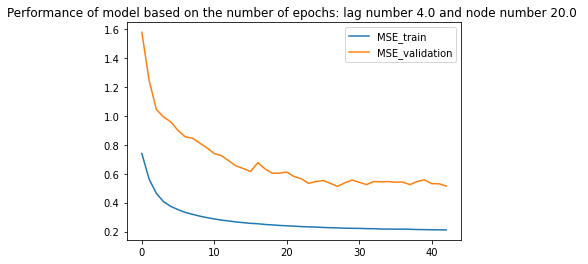

1
the time lag for prediction is: 2.0 
the number of nodes in the hidden layer is: 4.0 
Epoch 35: early stopping
mseval 0.60


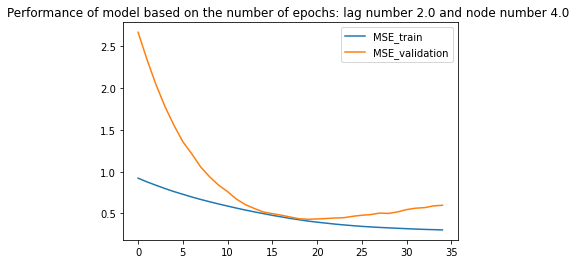

the number of nodes in the hidden layer is: 5.0 
Epoch 32: early stopping
mseval 0.89


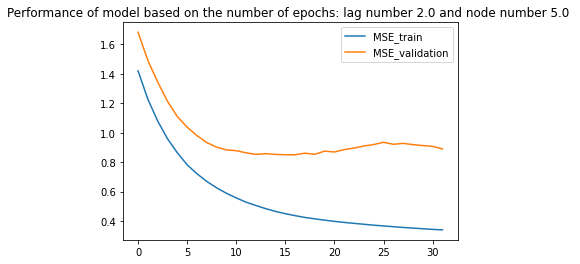

the number of nodes in the hidden layer is: 6.0 
Epoch 24: early stopping
mseval 0.52


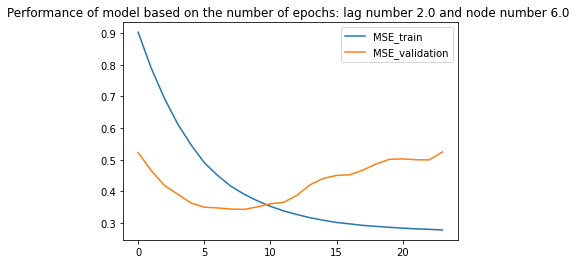

the number of nodes in the hidden layer is: 7.0 
Epoch 16: early stopping
mseval 1.36


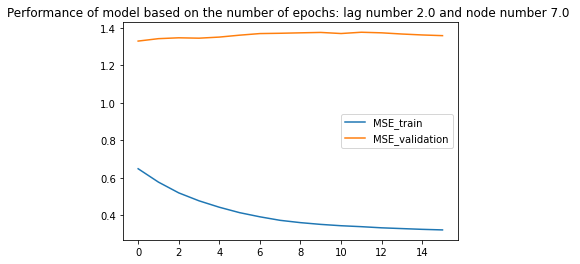

the number of nodes in the hidden layer is: 8.0 
Epoch 91: early stopping
mseval 0.66


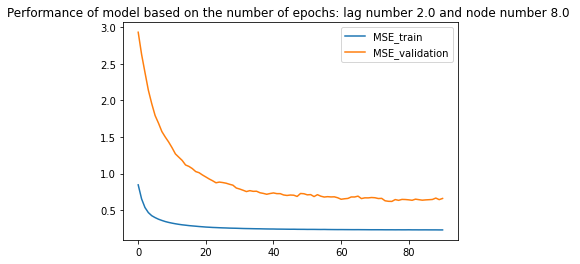

the number of nodes in the hidden layer is: 9.0 
Epoch 174: early stopping
mseval 0.49


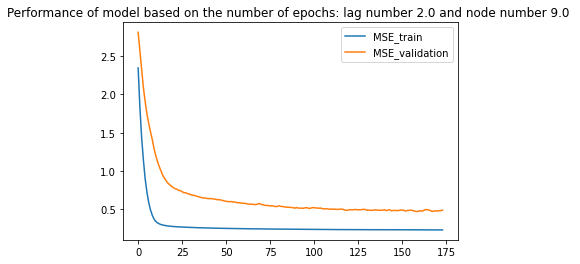

the number of nodes in the hidden layer is: 10.0 
Epoch 64: early stopping
mseval 0.51


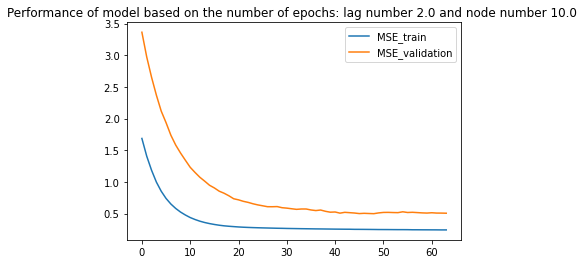

the number of nodes in the hidden layer is: 11.0 
Epoch 30: early stopping
mseval 0.53


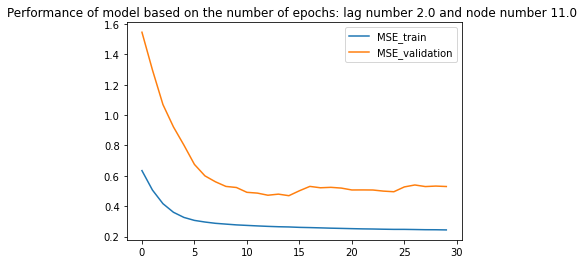

the number of nodes in the hidden layer is: 12.0 
Epoch 24: early stopping
mseval 0.55


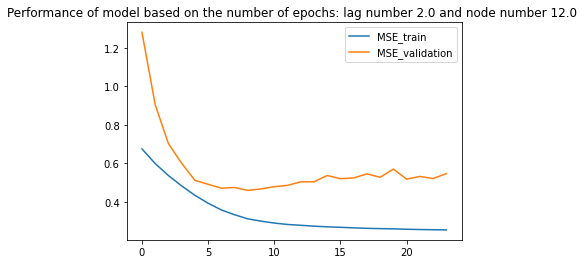

the number of nodes in the hidden layer is: 13.0 
Epoch 20: early stopping
mseval 0.36


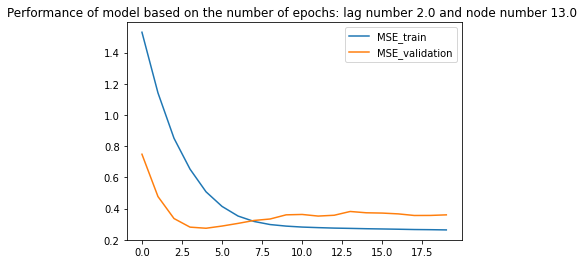

the number of nodes in the hidden layer is: 14.0 
Epoch 40: early stopping
mseval 0.56


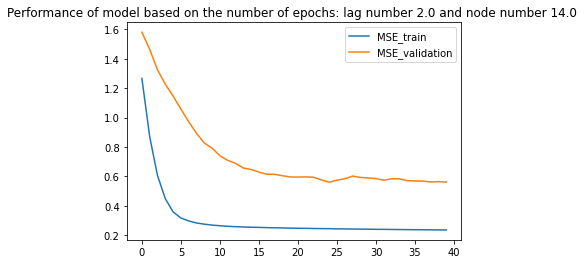

the number of nodes in the hidden layer is: 15.0 
Epoch 18: early stopping
mseval 0.49


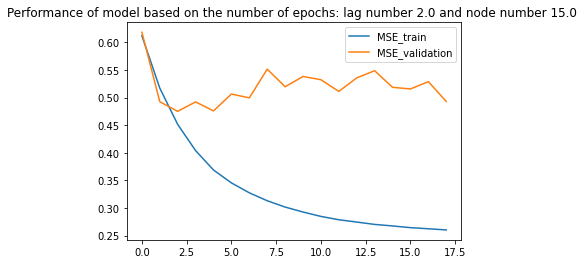

the number of nodes in the hidden layer is: 16.0 
Epoch 16: early stopping
mseval 0.55


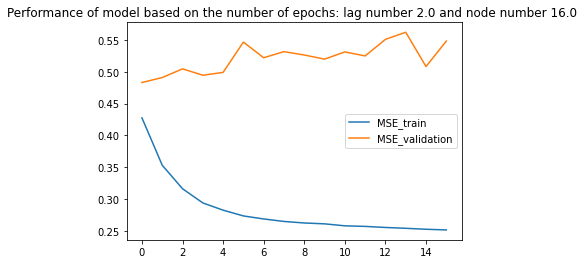

the number of nodes in the hidden layer is: 17.0 
Epoch 64: early stopping
mseval 0.41


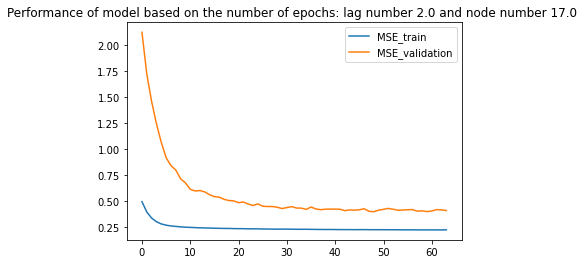

the number of nodes in the hidden layer is: 18.0 
Epoch 72: early stopping
mseval 0.46


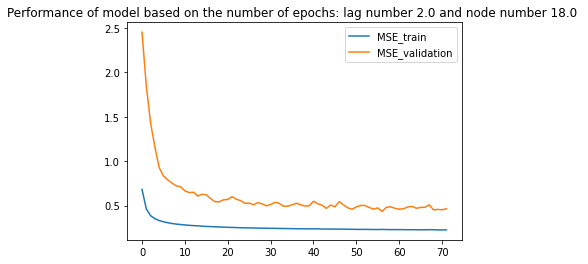

the number of nodes in the hidden layer is: 19.0 
Epoch 57: early stopping
mseval 0.51


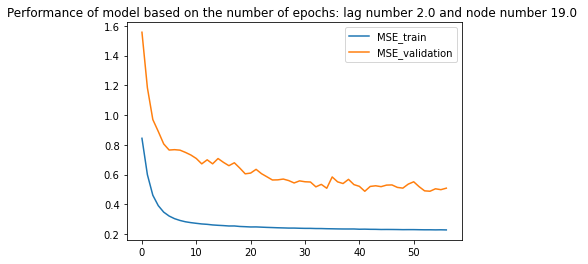

the number of nodes in the hidden layer is: 20.0 
Epoch 51: early stopping
mseval 0.46


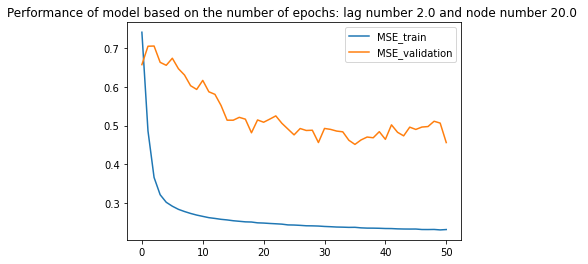

the time lag for prediction is: 3.0 
the number of nodes in the hidden layer is: 4.0 
Epoch 65: early stopping
mseval 0.44


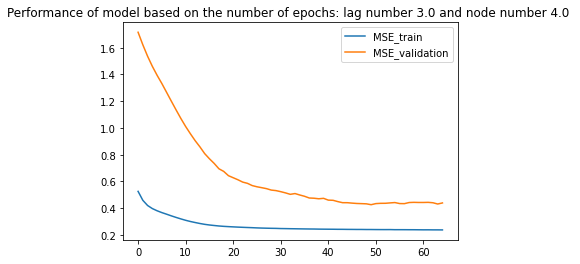

the number of nodes in the hidden layer is: 5.0 
Epoch 56: early stopping
mseval 0.34


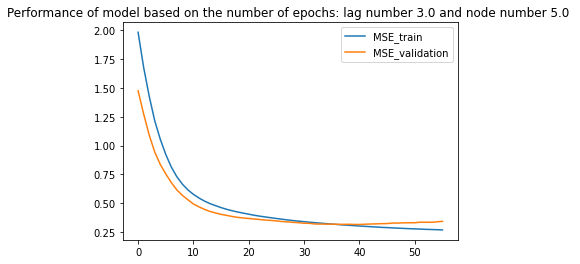

the number of nodes in the hidden layer is: 6.0 
Epoch 88: early stopping
mseval 0.30


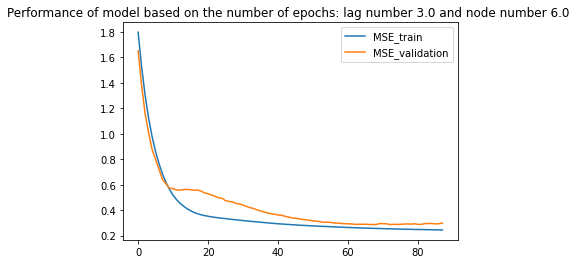

the number of nodes in the hidden layer is: 7.0 
Epoch 54: early stopping
mseval 0.63


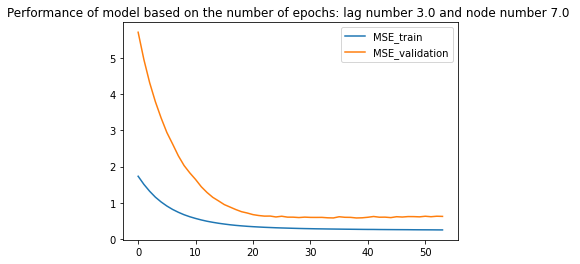

the number of nodes in the hidden layer is: 8.0 
Epoch 39: early stopping
mseval 0.40


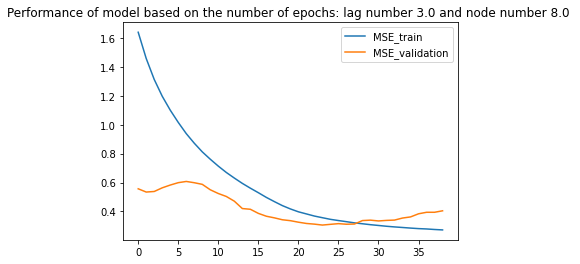

the number of nodes in the hidden layer is: 9.0 
Epoch 54: early stopping
mseval 0.53


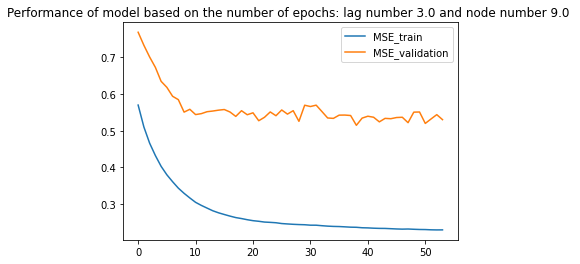

the number of nodes in the hidden layer is: 10.0 
Epoch 149: early stopping
mseval 0.54


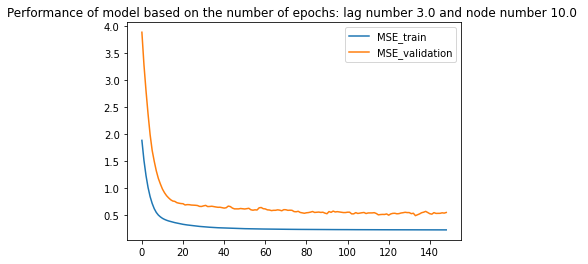

the number of nodes in the hidden layer is: 11.0 
Epoch 35: early stopping
mseval 0.47


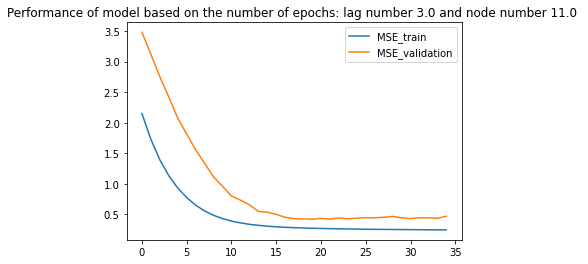

the number of nodes in the hidden layer is: 12.0 
Epoch 59: early stopping
mseval 0.73


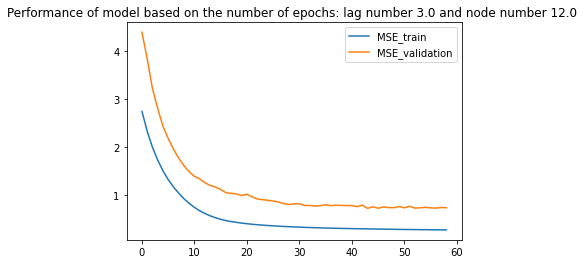

the number of nodes in the hidden layer is: 13.0 
Epoch 28: early stopping
mseval 0.32


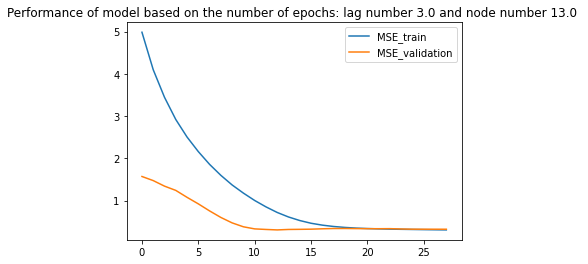

the number of nodes in the hidden layer is: 14.0 
Epoch 31: early stopping
mseval 0.43


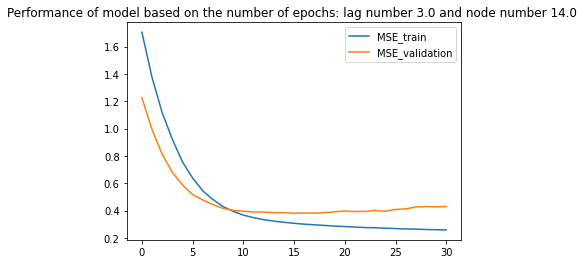

the number of nodes in the hidden layer is: 15.0 
Epoch 28: early stopping
mseval 0.43


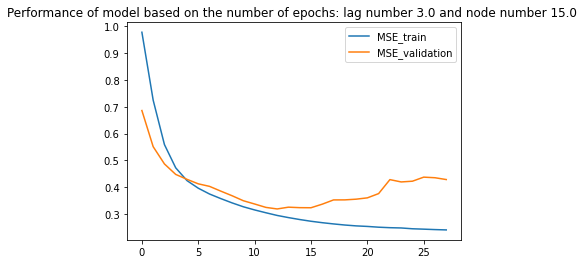

the number of nodes in the hidden layer is: 16.0 
Epoch 157: early stopping
mseval 0.65


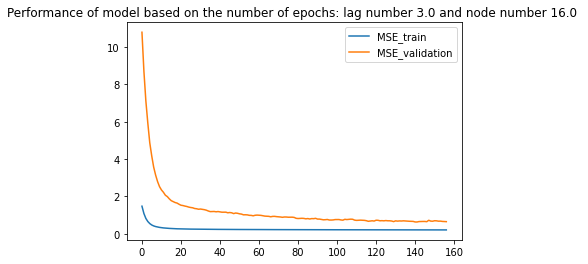

the number of nodes in the hidden layer is: 17.0 
Epoch 124: early stopping
mseval 0.64


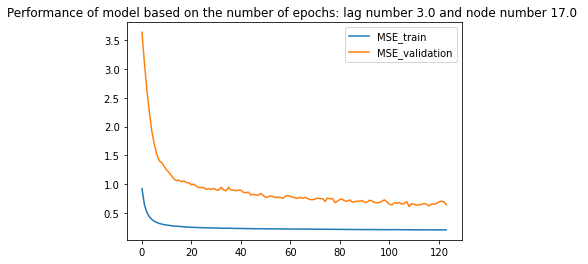

the number of nodes in the hidden layer is: 18.0 
Epoch 76: early stopping
mseval 0.64


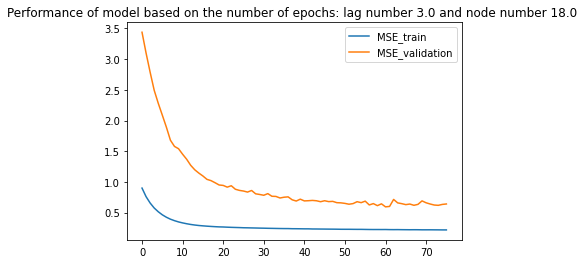

the number of nodes in the hidden layer is: 19.0 
Epoch 82: early stopping
mseval 0.43


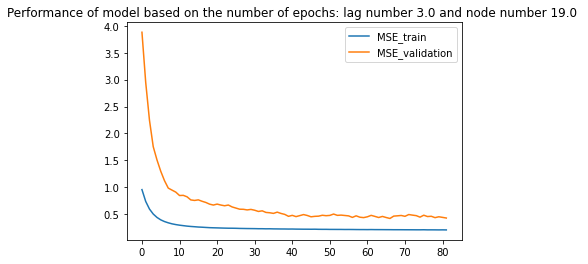

the number of nodes in the hidden layer is: 20.0 
Epoch 64: early stopping
mseval 0.52


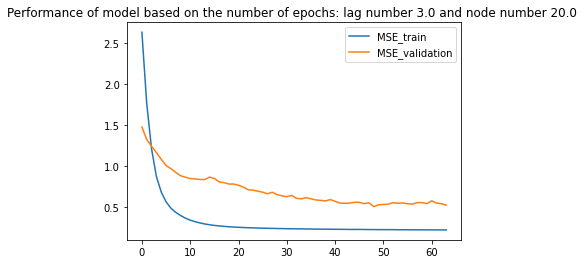

the time lag for prediction is: 4.0 
the number of nodes in the hidden layer is: 4.0 
Epoch 79: early stopping
mseval 0.48


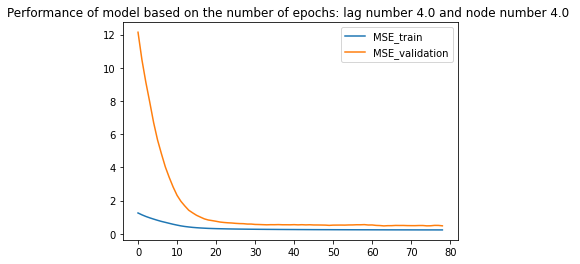

the number of nodes in the hidden layer is: 5.0 
Epoch 59: early stopping
mseval 0.38


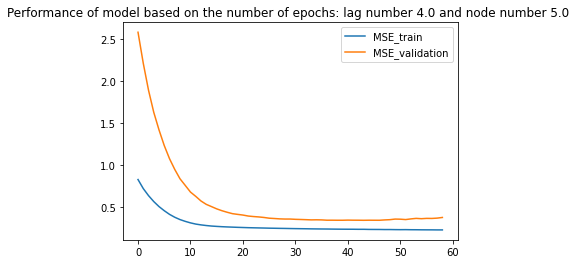

the number of nodes in the hidden layer is: 6.0 
mseval 1.15


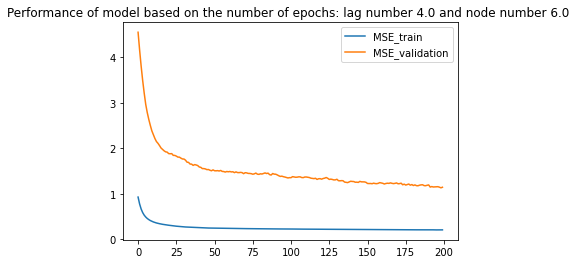

the number of nodes in the hidden layer is: 7.0 
Epoch 135: early stopping
mseval 0.67


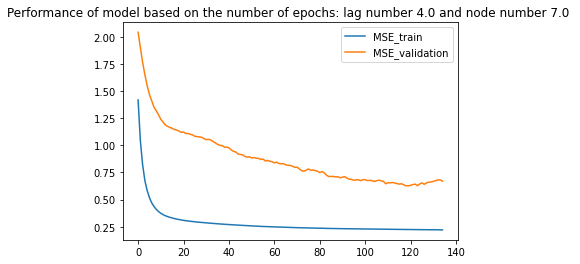

the number of nodes in the hidden layer is: 8.0 
Epoch 142: early stopping
mseval 0.96


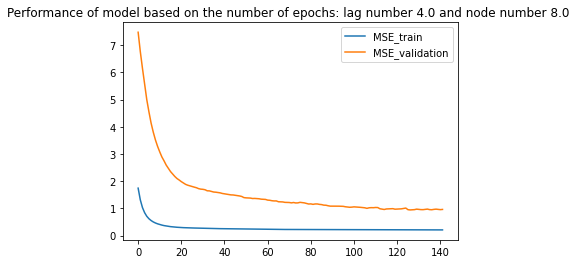

the number of nodes in the hidden layer is: 9.0 
Epoch 103: early stopping
mseval 0.66


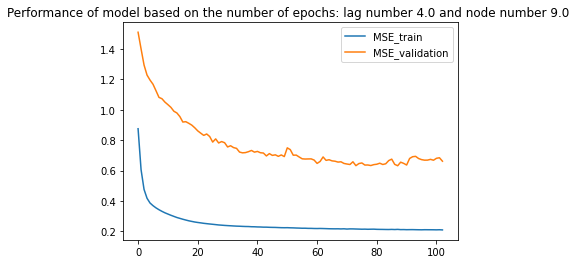

the number of nodes in the hidden layer is: 10.0 
Epoch 119: early stopping
mseval 0.41


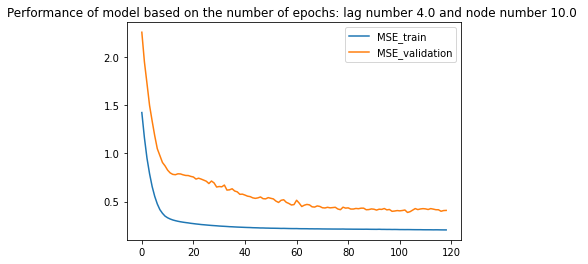

the number of nodes in the hidden layer is: 11.0 
Epoch 68: early stopping
mseval 0.33


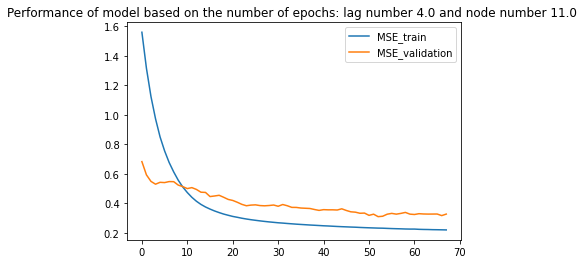

the number of nodes in the hidden layer is: 12.0 
Epoch 155: early stopping
mseval 1.50


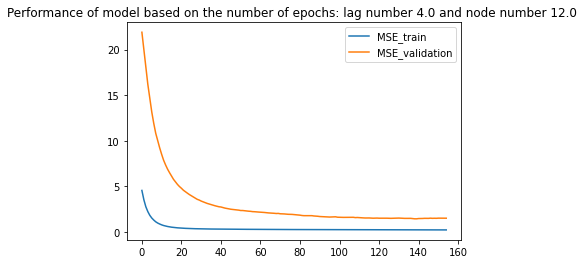

the number of nodes in the hidden layer is: 13.0 
Epoch 42: early stopping
mseval 0.40


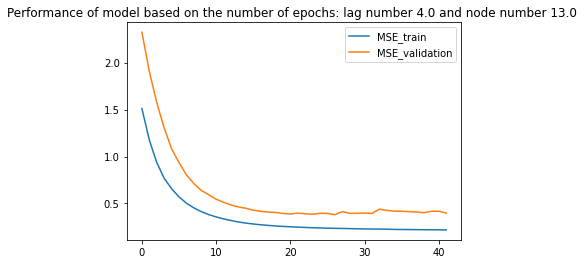

the number of nodes in the hidden layer is: 14.0 
Epoch 90: early stopping
mseval 0.81


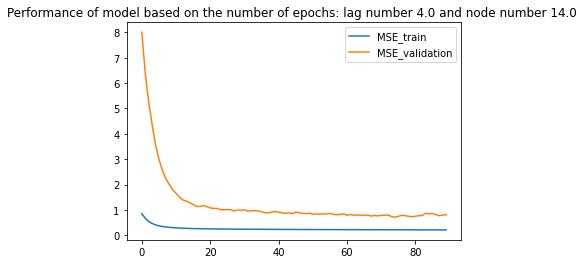

the number of nodes in the hidden layer is: 15.0 
Epoch 52: early stopping
mseval 0.43


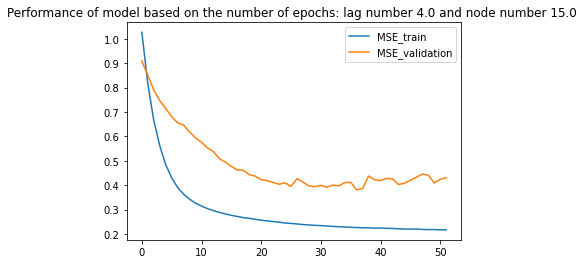

the number of nodes in the hidden layer is: 16.0 
Epoch 114: early stopping
mseval 0.67


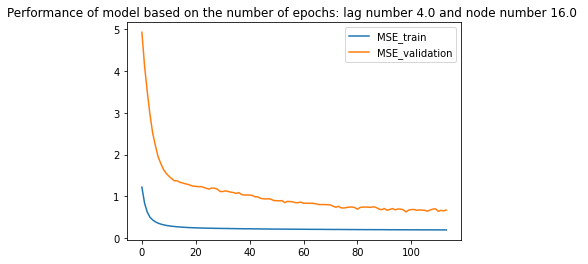

the number of nodes in the hidden layer is: 17.0 
Epoch 77: early stopping
mseval 0.88


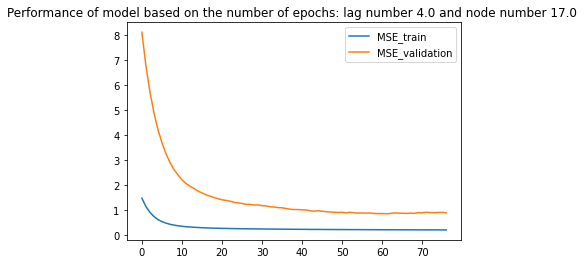

the number of nodes in the hidden layer is: 18.0 
Epoch 79: early stopping
mseval 0.52


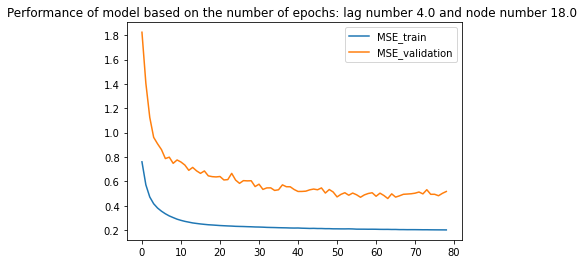

the number of nodes in the hidden layer is: 19.0 
Epoch 31: early stopping
mseval 0.54


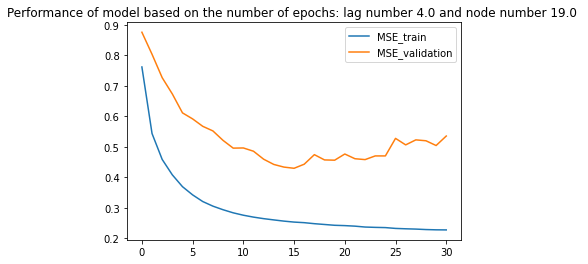

the number of nodes in the hidden layer is: 20.0 
Epoch 32: early stopping
mseval 0.34


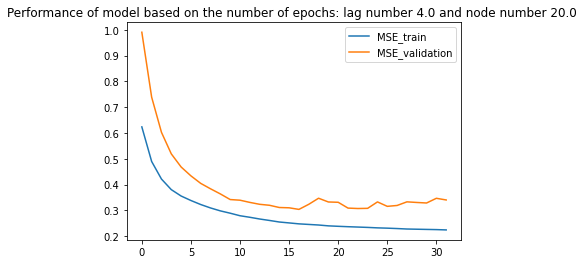

2
the time lag for prediction is: 2.0 
the number of nodes in the hidden layer is: 4.0 
Epoch 16: early stopping
mseval 0.91


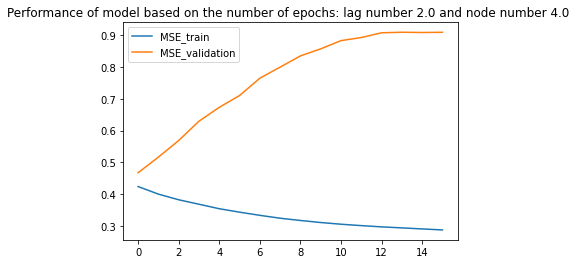

the number of nodes in the hidden layer is: 5.0 
Epoch 40: early stopping
mseval 0.60


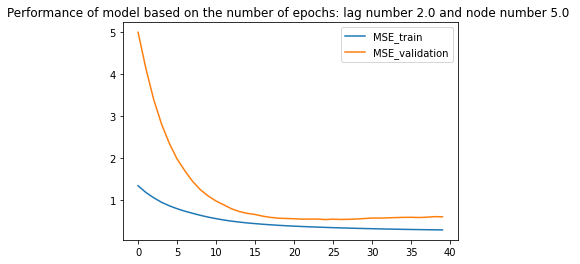

the number of nodes in the hidden layer is: 6.0 
mseval 0.61


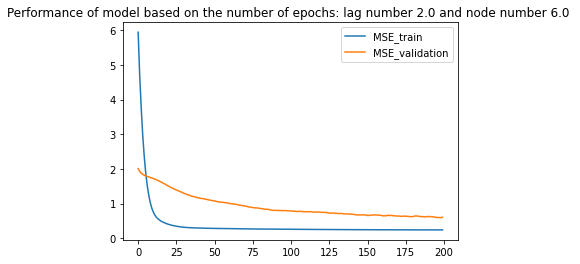

the number of nodes in the hidden layer is: 7.0 
mseval 0.61


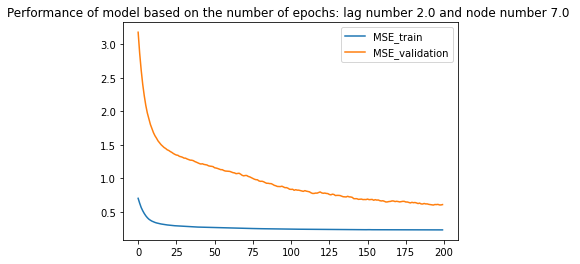

the number of nodes in the hidden layer is: 8.0 
Epoch 19: early stopping
mseval 1.01


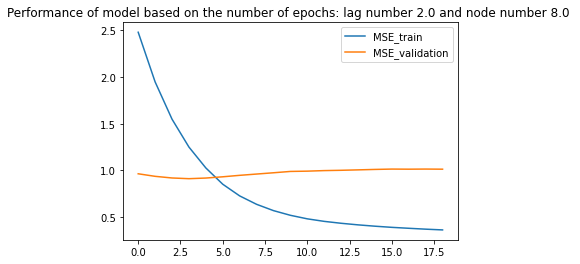

the number of nodes in the hidden layer is: 9.0 
Epoch 30: early stopping
mseval 0.46


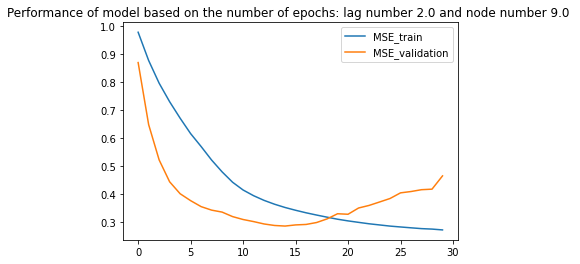

the number of nodes in the hidden layer is: 10.0 
Epoch 17: early stopping
mseval 0.67


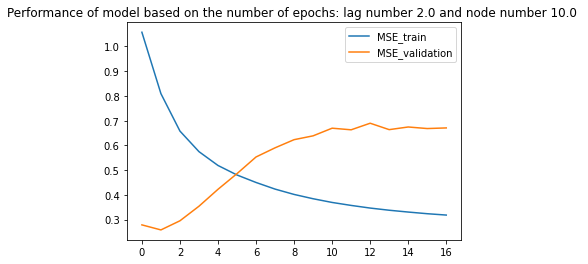

the number of nodes in the hidden layer is: 11.0 
Epoch 17: early stopping
mseval 0.58


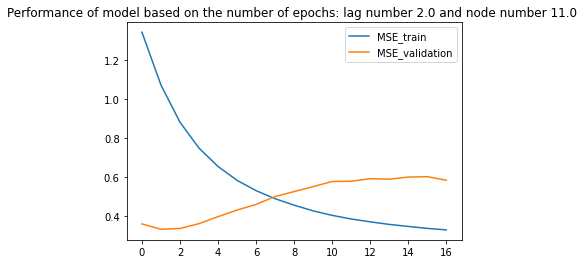

the number of nodes in the hidden layer is: 12.0 
Epoch 76: early stopping
mseval 0.52


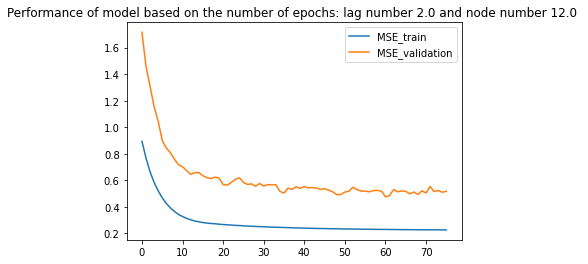

the number of nodes in the hidden layer is: 13.0 
Epoch 116: early stopping
mseval 0.53


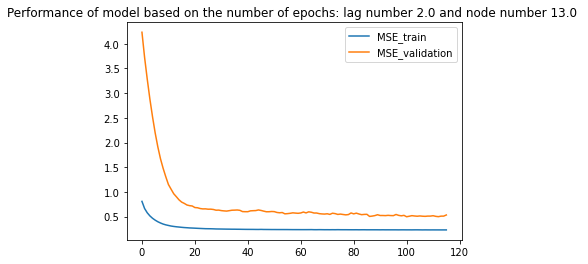

the number of nodes in the hidden layer is: 14.0 
Epoch 23: early stopping
mseval 0.71


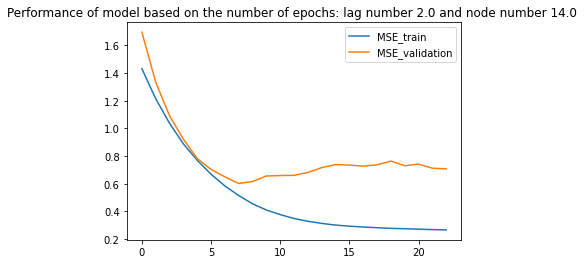

the number of nodes in the hidden layer is: 15.0 
Epoch 25: early stopping
mseval 0.63


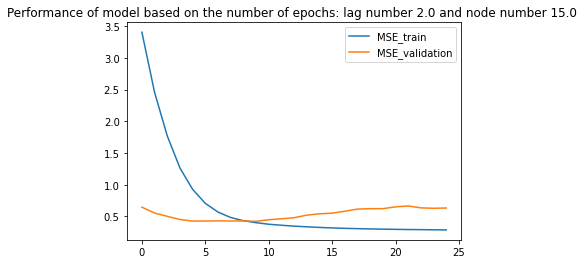

the number of nodes in the hidden layer is: 16.0 
Epoch 18: early stopping
mseval 0.58


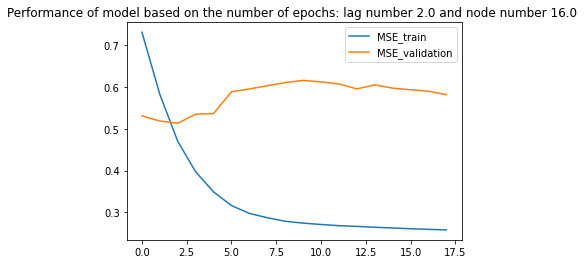

the number of nodes in the hidden layer is: 17.0 
Epoch 54: early stopping
mseval 0.57


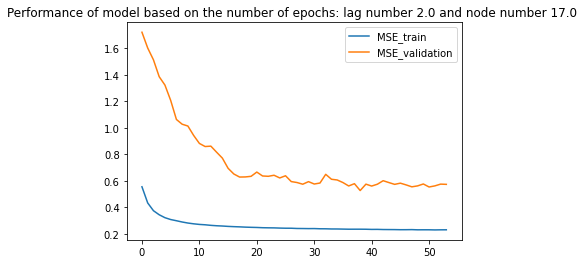

the number of nodes in the hidden layer is: 18.0 
Epoch 48: early stopping
mseval 0.48


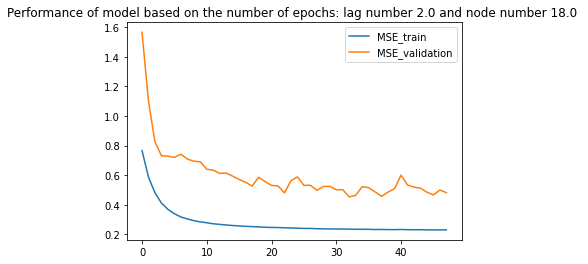

the number of nodes in the hidden layer is: 19.0 
Epoch 29: early stopping
mseval 0.60


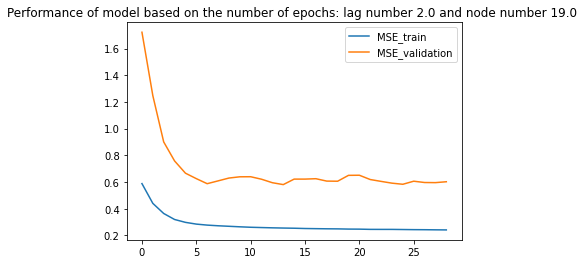

the number of nodes in the hidden layer is: 20.0 
Epoch 48: early stopping
mseval 0.44


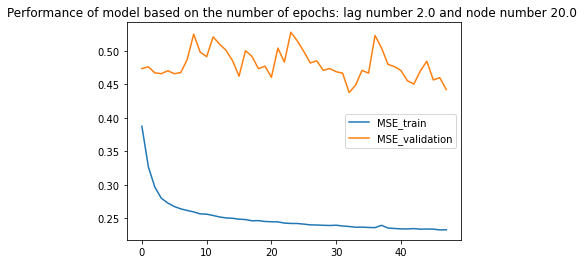

the time lag for prediction is: 3.0 
the number of nodes in the hidden layer is: 4.0 
mseval 0.85


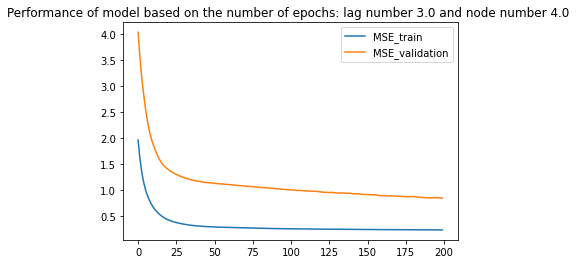

the number of nodes in the hidden layer is: 5.0 
mseval 1.33


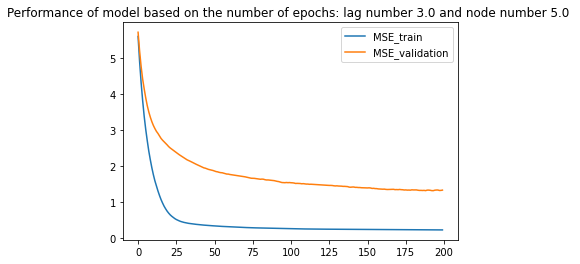

the number of nodes in the hidden layer is: 6.0 
Epoch 50: early stopping
mseval 0.59


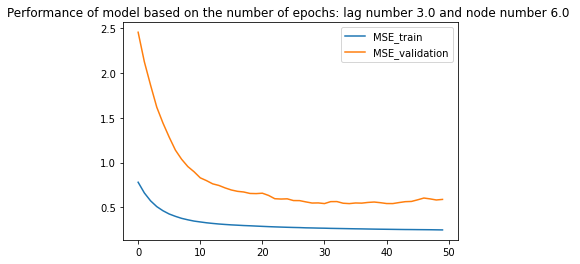

the number of nodes in the hidden layer is: 7.0 
Epoch 18: early stopping
mseval 0.90


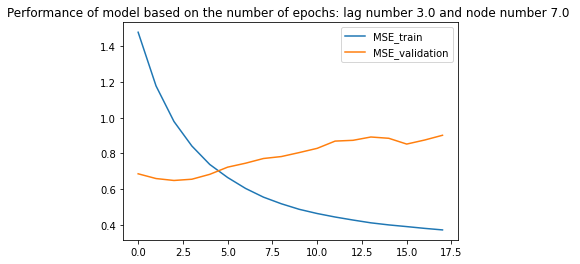

the number of nodes in the hidden layer is: 8.0 
Epoch 100: early stopping
mseval 0.80


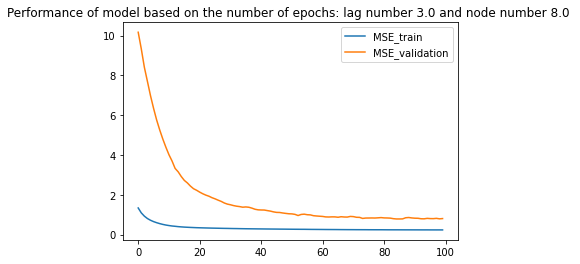

the number of nodes in the hidden layer is: 9.0 
Epoch 43: early stopping
mseval 0.30


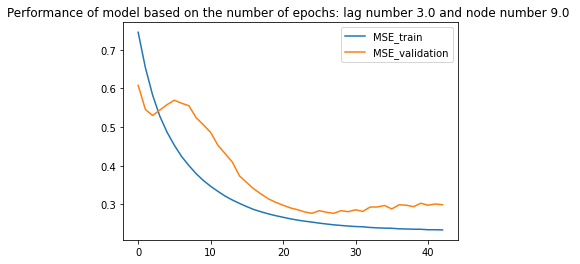

the number of nodes in the hidden layer is: 10.0 
Epoch 38: early stopping
mseval 0.89


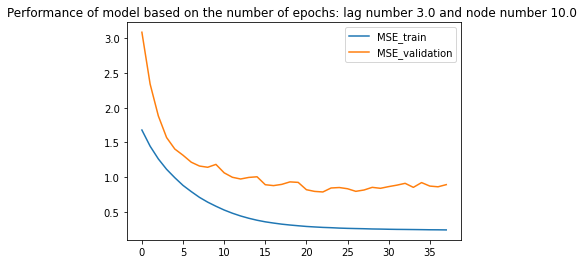

the number of nodes in the hidden layer is: 11.0 
Epoch 48: early stopping
mseval 0.30


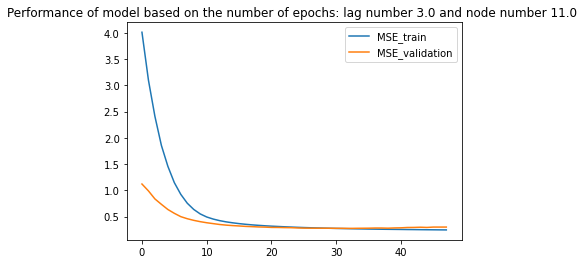

the number of nodes in the hidden layer is: 12.0 
Epoch 18: early stopping
mseval 0.60


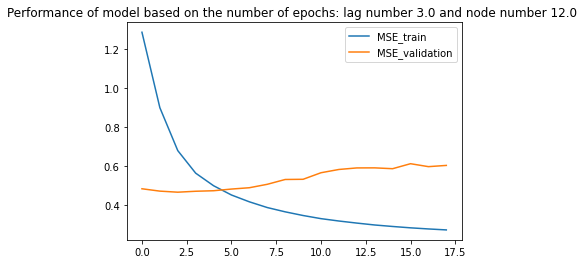

the number of nodes in the hidden layer is: 13.0 
Epoch 46: early stopping
mseval 0.62


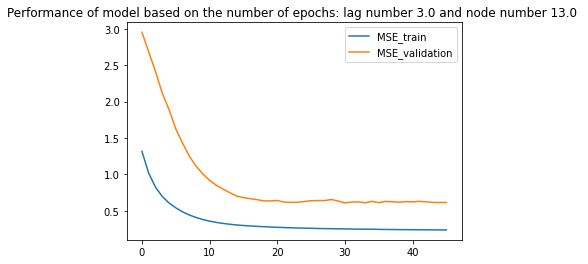

the number of nodes in the hidden layer is: 14.0 
Epoch 99: early stopping
mseval 0.56


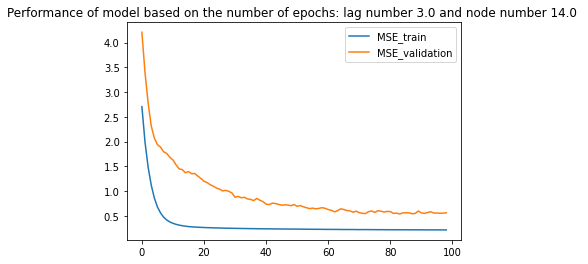

the number of nodes in the hidden layer is: 15.0 
Epoch 30: early stopping
mseval 0.54


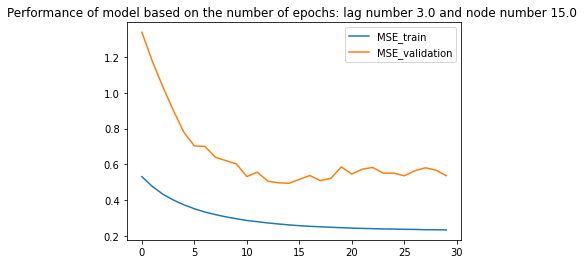

the number of nodes in the hidden layer is: 16.0 
Epoch 41: early stopping
mseval 0.43


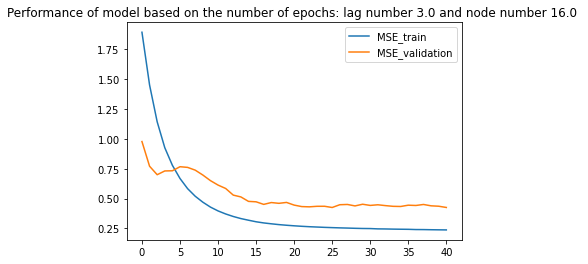

the number of nodes in the hidden layer is: 17.0 
Epoch 47: early stopping
mseval 0.66


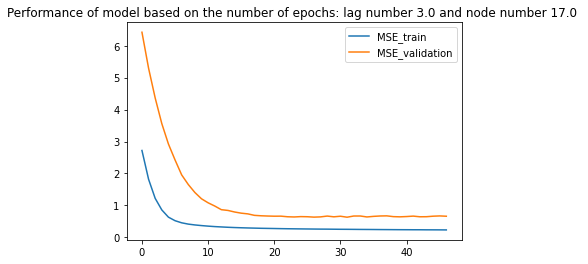

the number of nodes in the hidden layer is: 18.0 
Epoch 42: early stopping
mseval 0.54


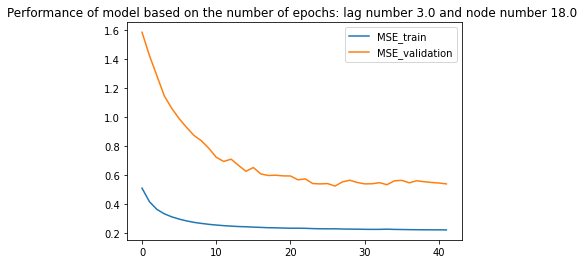

the number of nodes in the hidden layer is: 19.0 
Epoch 51: early stopping
mseval 0.36


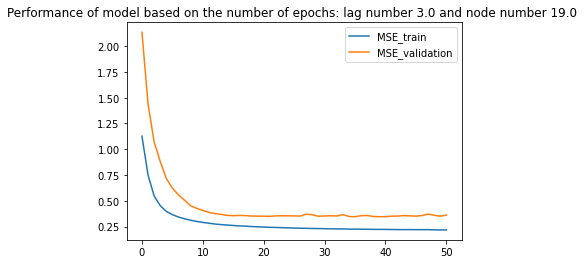

the number of nodes in the hidden layer is: 20.0 
Epoch 60: early stopping
mseval 0.72


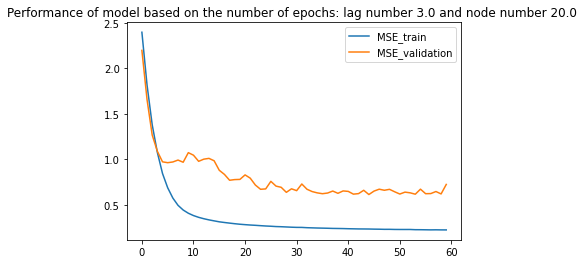

the time lag for prediction is: 4.0 
the number of nodes in the hidden layer is: 4.0 
Epoch 17: early stopping
mseval 1.47


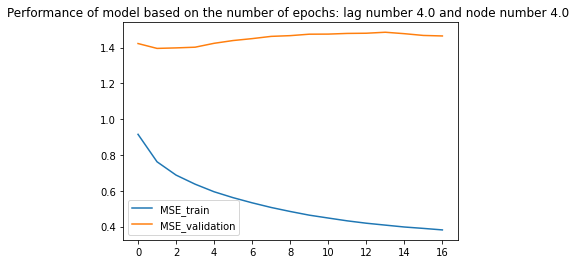

the number of nodes in the hidden layer is: 5.0 
Epoch 32: early stopping
mseval 0.49


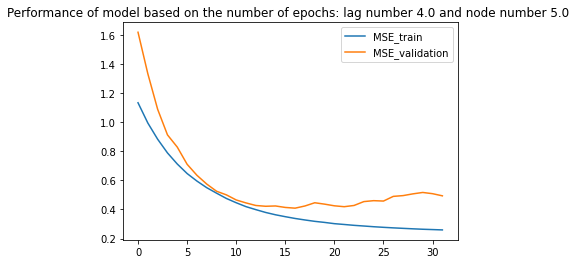

the number of nodes in the hidden layer is: 6.0 
Epoch 86: early stopping
mseval 0.77


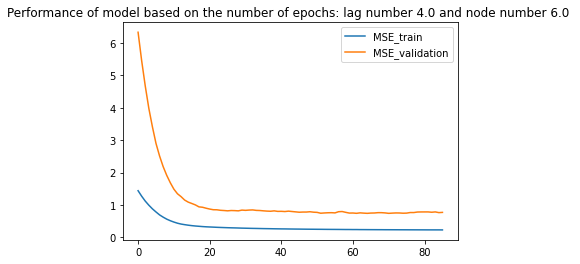

the number of nodes in the hidden layer is: 7.0 
Epoch 176: early stopping
mseval 0.63


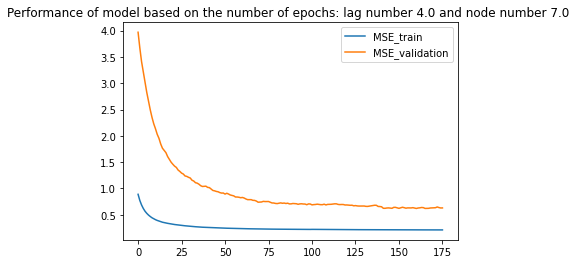

the number of nodes in the hidden layer is: 8.0 
Epoch 29: early stopping
mseval 0.61


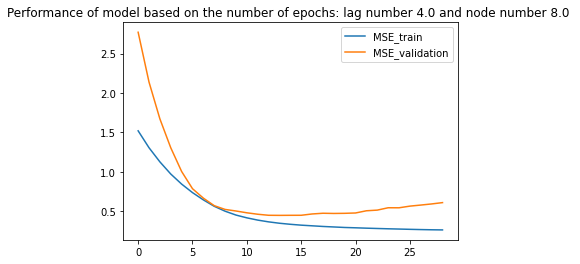

the number of nodes in the hidden layer is: 9.0 
Epoch 25: early stopping
mseval 0.43


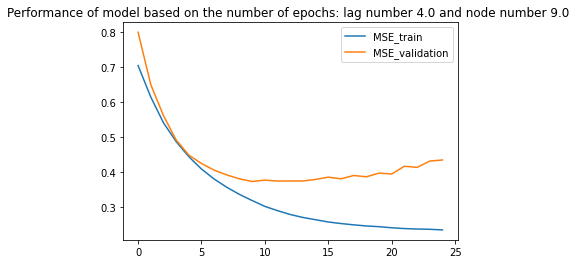

the number of nodes in the hidden layer is: 10.0 
Epoch 54: early stopping
mseval 0.56


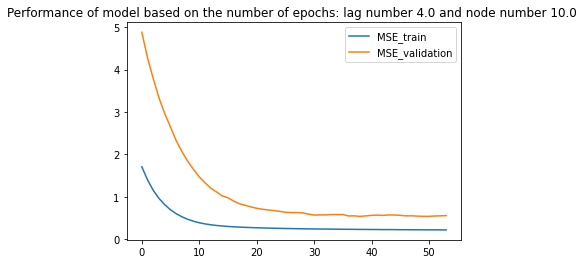

the number of nodes in the hidden layer is: 11.0 
Epoch 64: early stopping
mseval 0.33


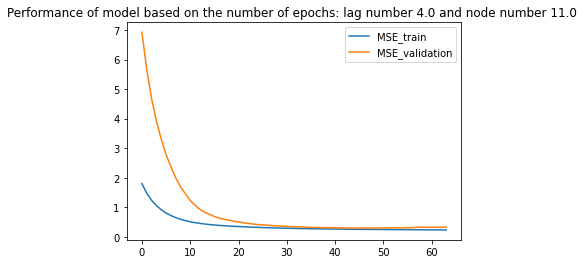

the number of nodes in the hidden layer is: 12.0 
Epoch 94: early stopping
mseval 0.70


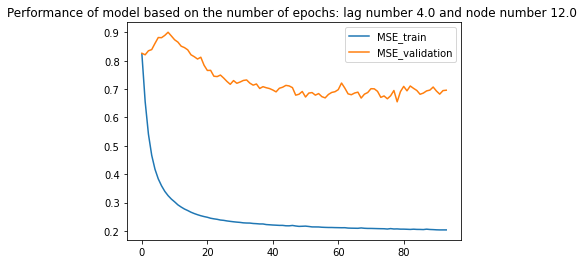

the number of nodes in the hidden layer is: 13.0 
Epoch 109: early stopping
mseval 0.55


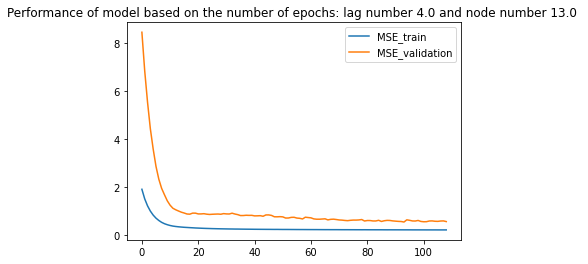

the number of nodes in the hidden layer is: 14.0 
Epoch 73: early stopping
mseval 0.42


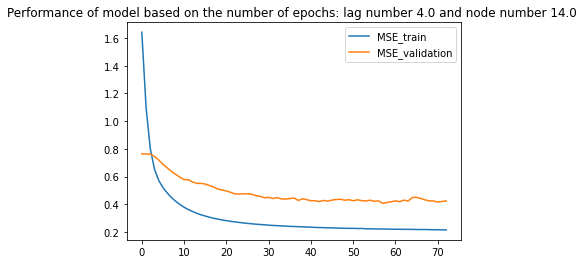

the number of nodes in the hidden layer is: 15.0 
Epoch 26: early stopping
mseval 0.42


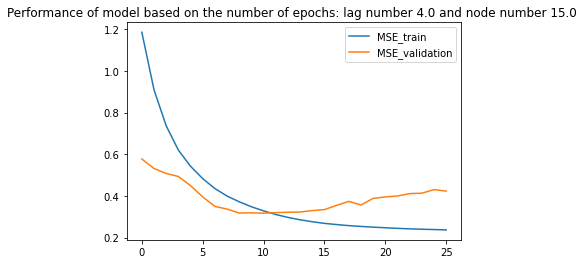

the number of nodes in the hidden layer is: 16.0 
Epoch 34: early stopping
mseval 0.29


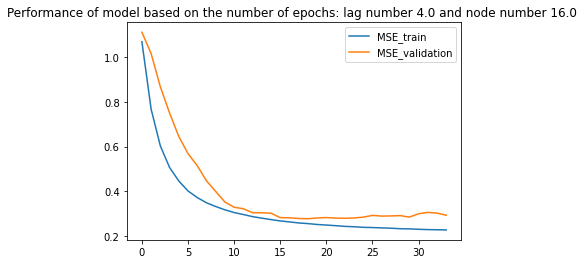

the number of nodes in the hidden layer is: 17.0 
Epoch 54: early stopping
mseval 0.53


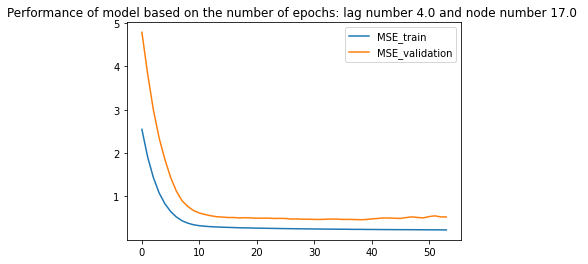

the number of nodes in the hidden layer is: 18.0 
Epoch 144: early stopping
mseval 0.92


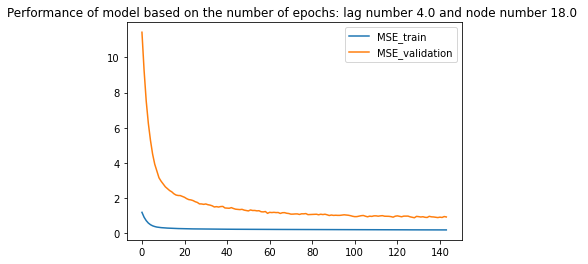

the number of nodes in the hidden layer is: 19.0 
Epoch 108: early stopping
mseval 0.56


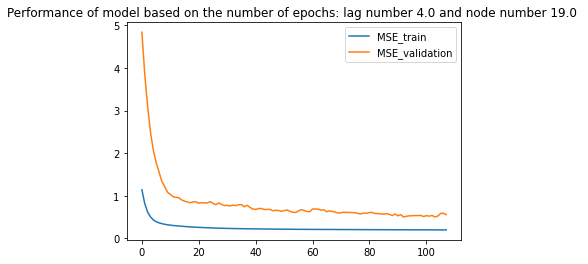

the number of nodes in the hidden layer is: 20.0 
Epoch 30: early stopping
mseval 0.40


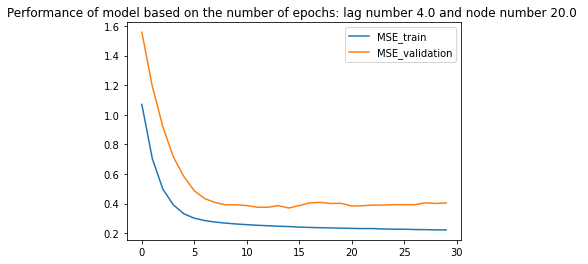

3
the time lag for prediction is: 2.0 
the number of nodes in the hidden layer is: 4.0 
mseval 0.64


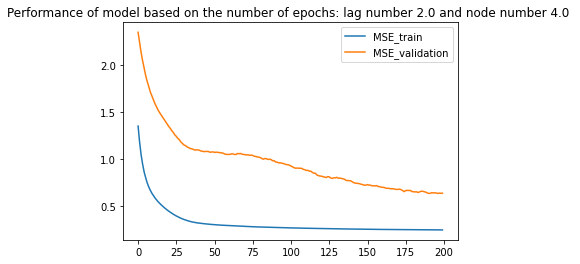

the number of nodes in the hidden layer is: 5.0 
Epoch 58: early stopping
mseval 0.86


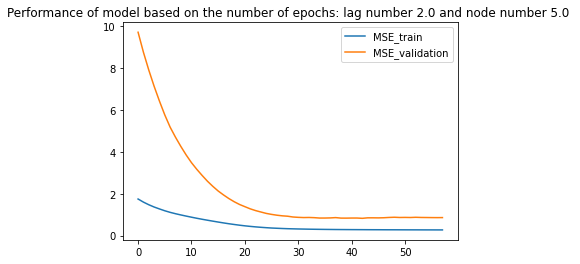

the number of nodes in the hidden layer is: 6.0 
Epoch 118: early stopping
mseval 0.55


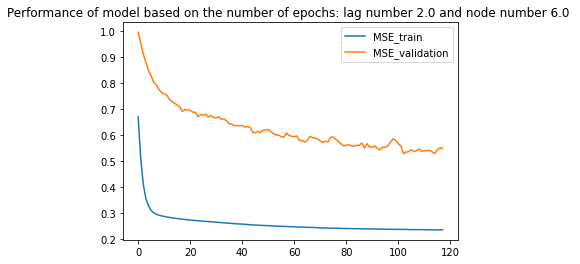

the number of nodes in the hidden layer is: 7.0 
Epoch 40: early stopping
mseval 0.54


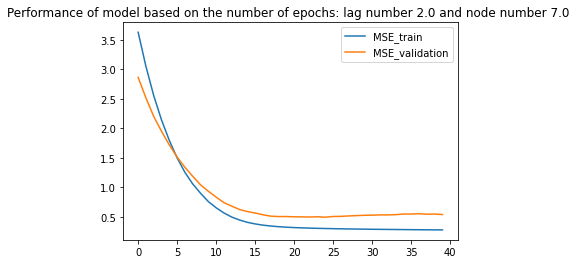

the number of nodes in the hidden layer is: 8.0 
Epoch 95: early stopping
mseval 0.49


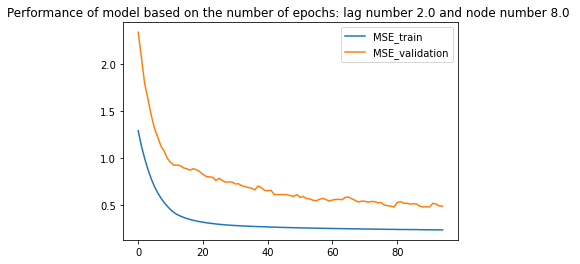

the number of nodes in the hidden layer is: 9.0 
Epoch 140: early stopping
mseval 0.50


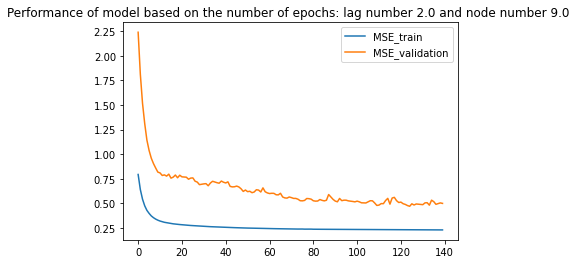

the number of nodes in the hidden layer is: 10.0 
Epoch 36: early stopping
mseval 0.54


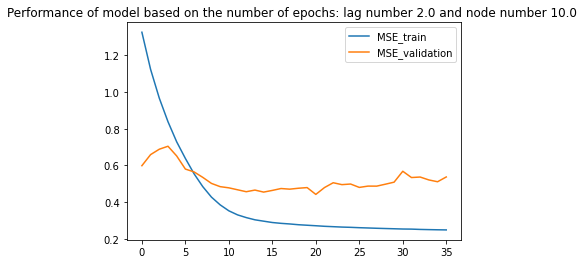

the number of nodes in the hidden layer is: 11.0 
Epoch 21: early stopping
mseval 0.52


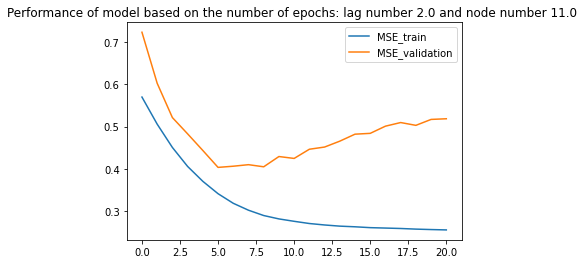

the number of nodes in the hidden layer is: 12.0 
Epoch 45: early stopping
mseval 0.65


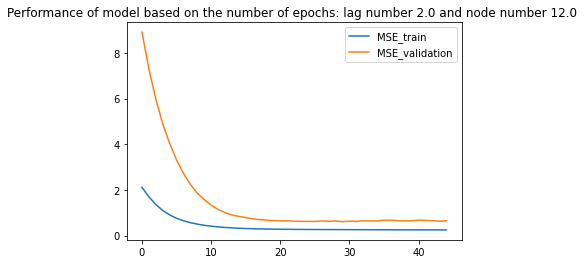

the number of nodes in the hidden layer is: 13.0 
Epoch 24: early stopping
mseval 0.56


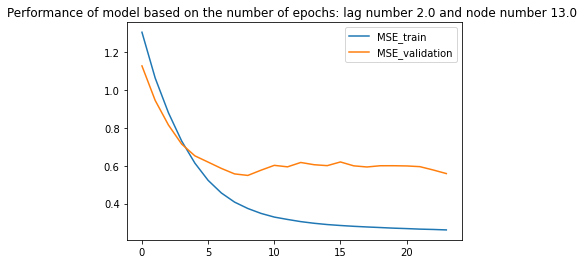

the number of nodes in the hidden layer is: 14.0 
Epoch 32: early stopping
mseval 0.46


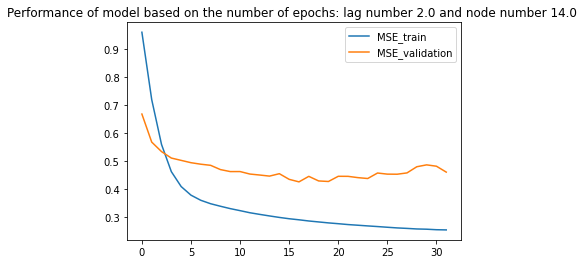

the number of nodes in the hidden layer is: 15.0 
Epoch 45: early stopping
mseval 0.47


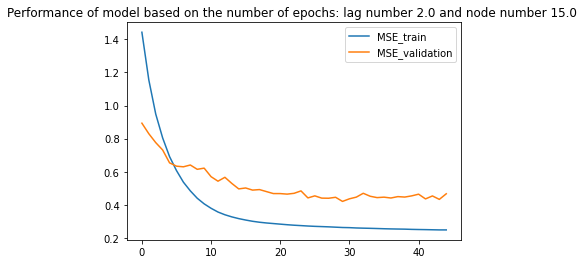

the number of nodes in the hidden layer is: 16.0 
Epoch 27: early stopping
mseval 0.57


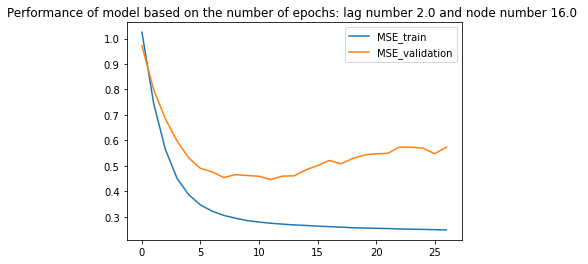

the number of nodes in the hidden layer is: 17.0 
Epoch 59: early stopping
mseval 0.48


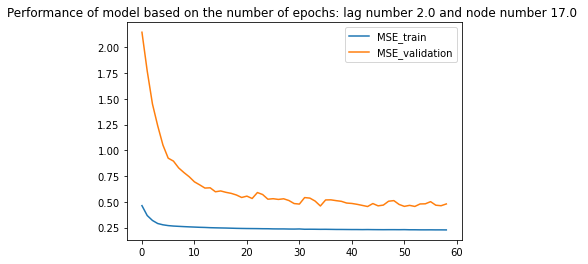

the number of nodes in the hidden layer is: 18.0 
Epoch 21: early stopping
mseval 0.68


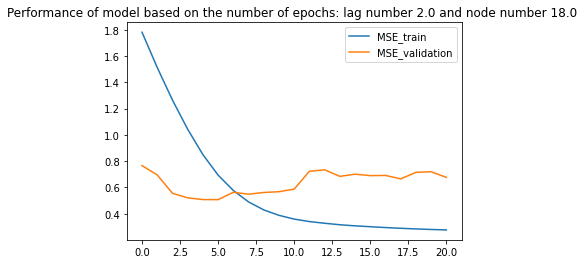

the number of nodes in the hidden layer is: 19.0 
Epoch 99: early stopping
mseval 0.58


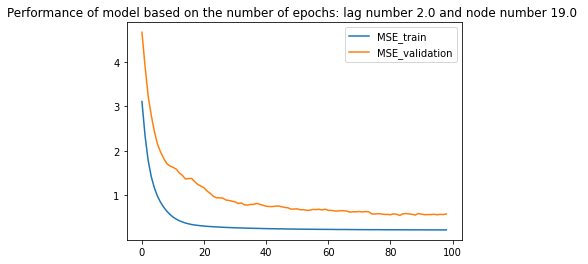

the number of nodes in the hidden layer is: 20.0 
Epoch 77: early stopping
mseval 0.54


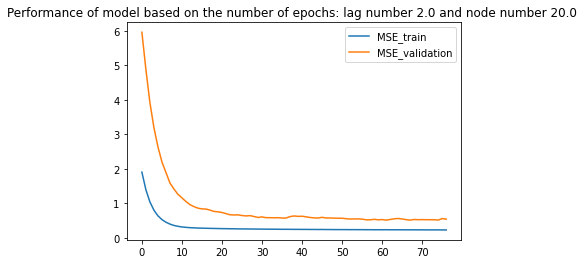

the time lag for prediction is: 3.0 
the number of nodes in the hidden layer is: 4.0 
Epoch 34: early stopping
mseval 0.92


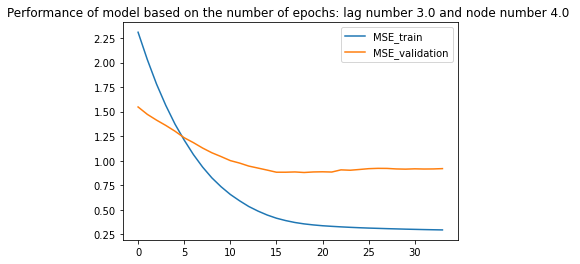

the number of nodes in the hidden layer is: 5.0 
Epoch 17: early stopping
mseval 0.52


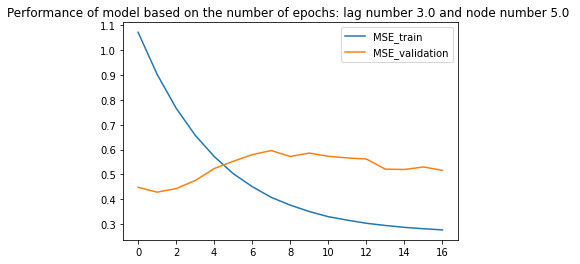

the number of nodes in the hidden layer is: 6.0 
Epoch 50: early stopping
mseval 0.77


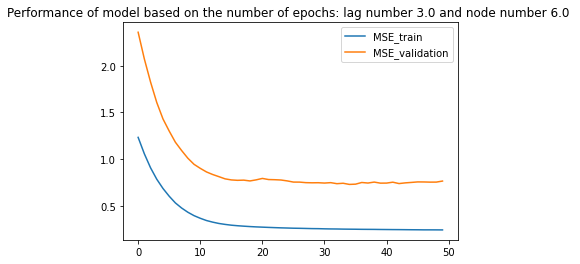

the number of nodes in the hidden layer is: 7.0 
Epoch 93: early stopping
mseval 0.53


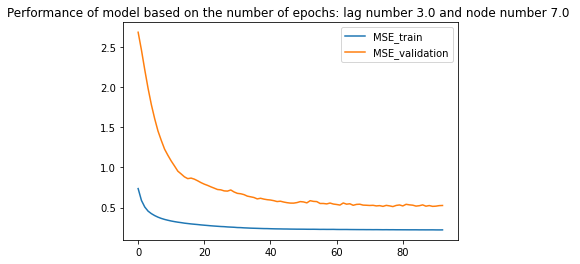

the number of nodes in the hidden layer is: 8.0 
Epoch 50: early stopping
mseval 0.31


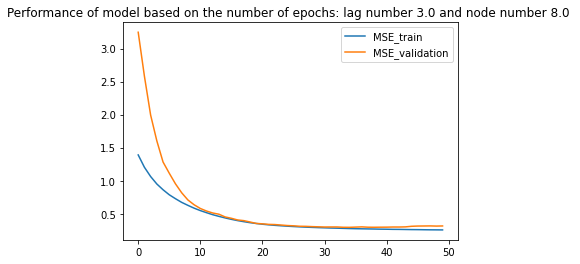

the number of nodes in the hidden layer is: 9.0 
Epoch 39: early stopping
mseval 0.56


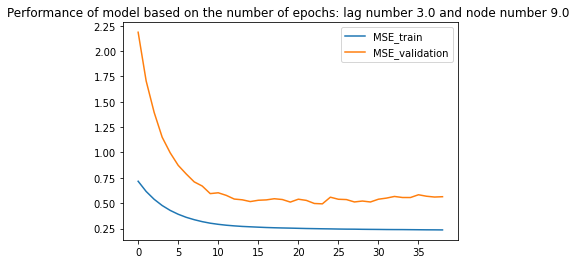

the number of nodes in the hidden layer is: 10.0 
Epoch 120: early stopping
mseval 0.64


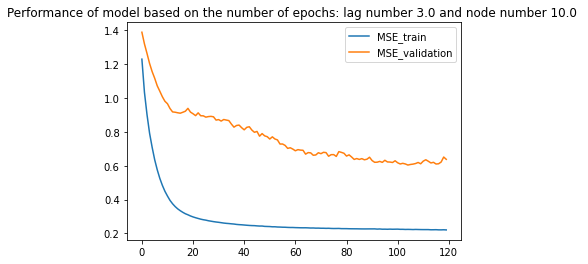

the number of nodes in the hidden layer is: 11.0 
Epoch 177: early stopping
mseval 0.62


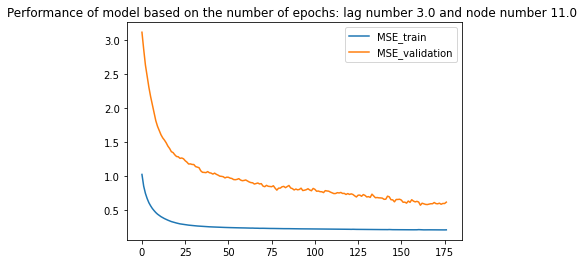

the number of nodes in the hidden layer is: 12.0 
Epoch 143: early stopping
mseval 0.53


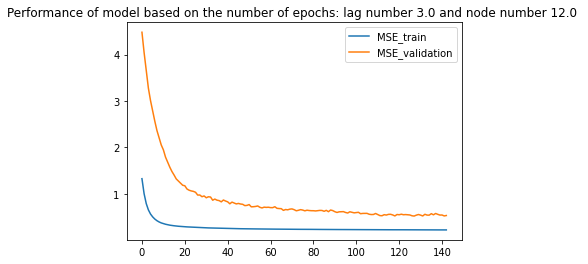

the number of nodes in the hidden layer is: 13.0 
Epoch 33: early stopping
mseval 0.46


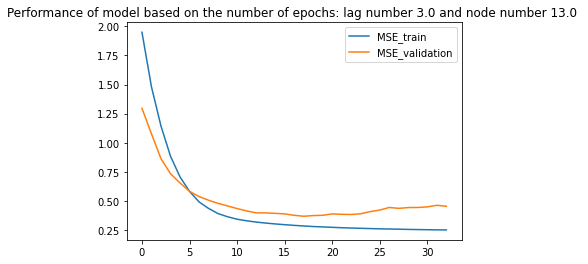

the number of nodes in the hidden layer is: 14.0 
Epoch 29: early stopping
mseval 0.45


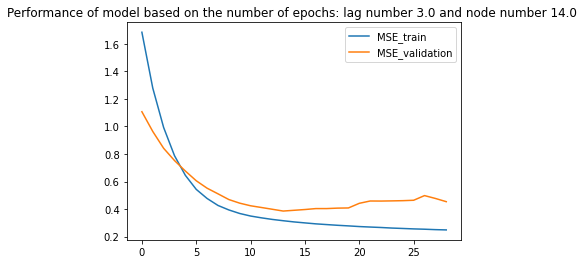

the number of nodes in the hidden layer is: 15.0 
Epoch 89: early stopping
mseval 0.61


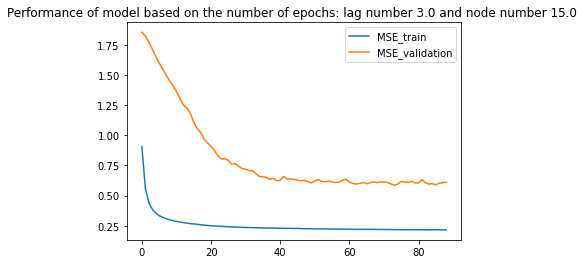

the number of nodes in the hidden layer is: 16.0 
Epoch 26: early stopping
mseval 0.67


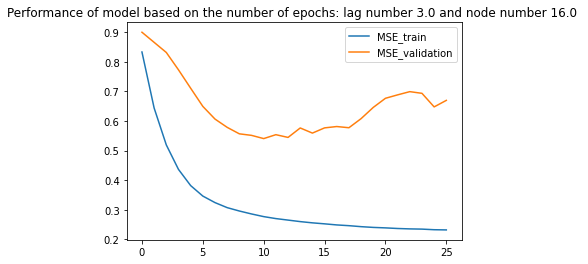

the number of nodes in the hidden layer is: 17.0 
Epoch 36: early stopping
mseval 0.43


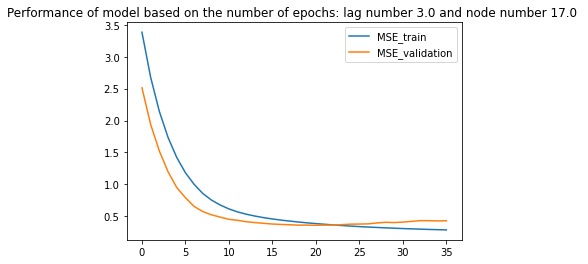

the number of nodes in the hidden layer is: 18.0 
Epoch 56: early stopping
mseval 0.54


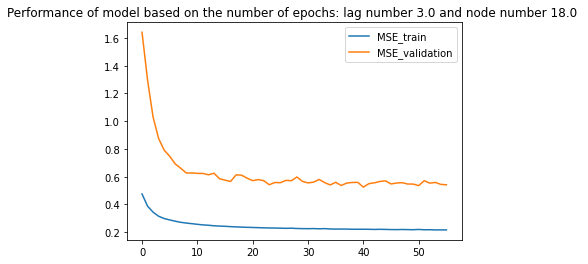

the number of nodes in the hidden layer is: 19.0 
Epoch 105: early stopping
mseval 0.45


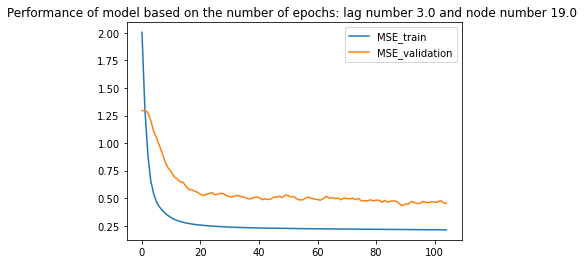

the number of nodes in the hidden layer is: 20.0 
Epoch 43: early stopping
mseval 0.54


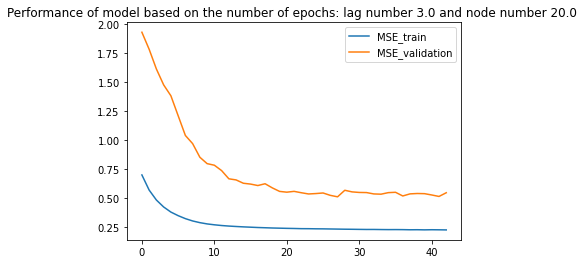

the time lag for prediction is: 4.0 
the number of nodes in the hidden layer is: 4.0 
mseval 0.41


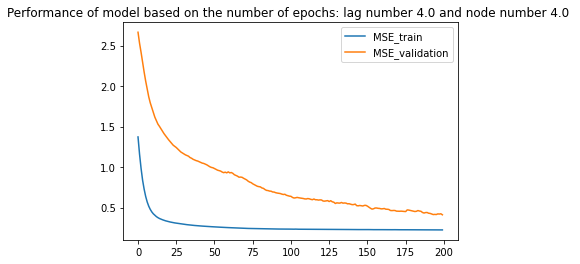

the number of nodes in the hidden layer is: 5.0 
Epoch 17: early stopping
mseval 0.90


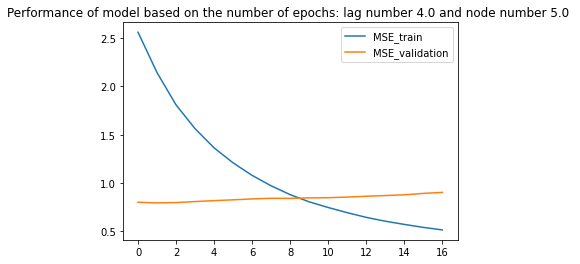

the number of nodes in the hidden layer is: 6.0 
mseval 0.52


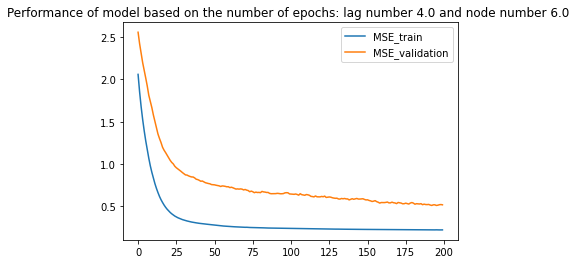

the number of nodes in the hidden layer is: 7.0 
Epoch 59: early stopping
mseval 0.97


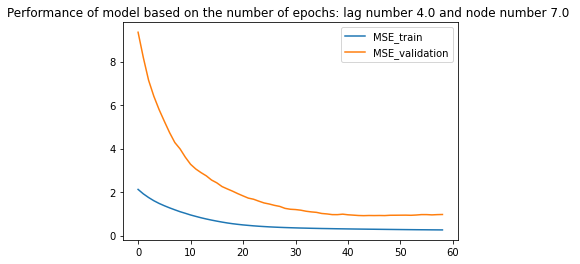

the number of nodes in the hidden layer is: 8.0 
Epoch 16: early stopping
mseval 0.78


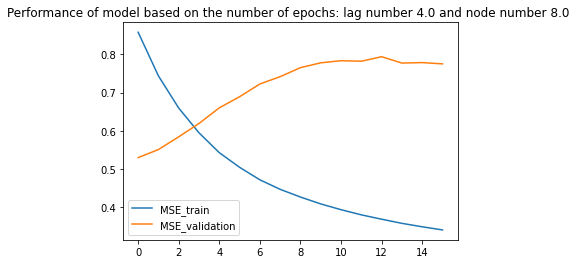

the number of nodes in the hidden layer is: 9.0 
Epoch 54: early stopping
mseval 0.37


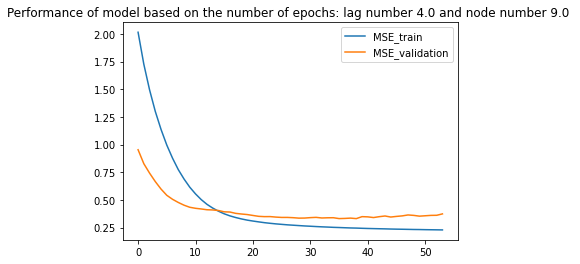

the number of nodes in the hidden layer is: 10.0 
Epoch 55: early stopping
mseval 0.97


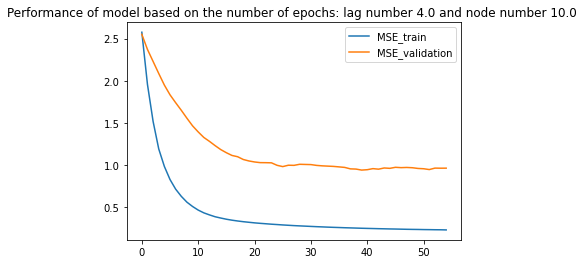

the number of nodes in the hidden layer is: 11.0 
Epoch 79: early stopping
mseval 0.66


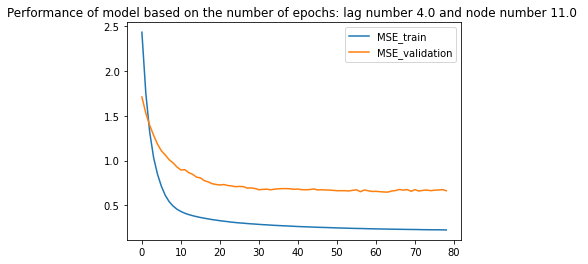

the number of nodes in the hidden layer is: 12.0 
Epoch 66: early stopping
mseval 1.12


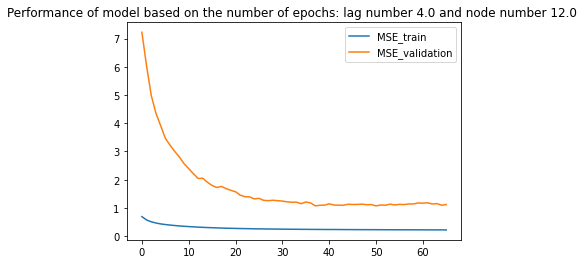

the number of nodes in the hidden layer is: 13.0 
Epoch 197: early stopping
mseval 0.64


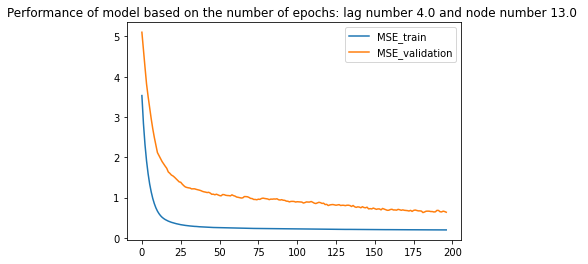

the number of nodes in the hidden layer is: 14.0 
Epoch 33: early stopping
mseval 0.56


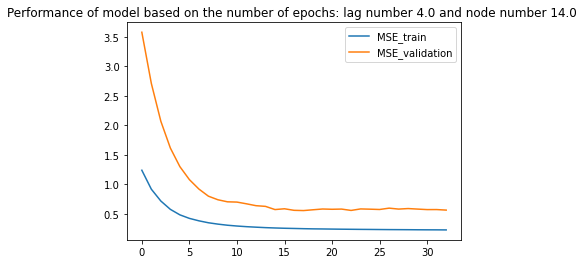

the number of nodes in the hidden layer is: 15.0 
Epoch 28: early stopping
mseval 0.82


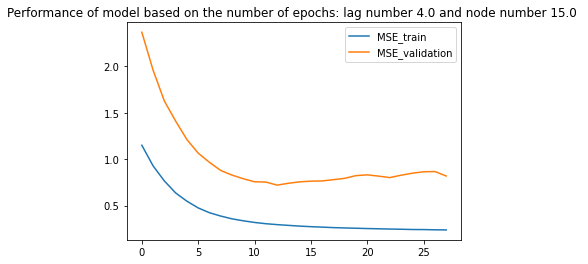

the number of nodes in the hidden layer is: 16.0 
Epoch 49: early stopping
mseval 0.48


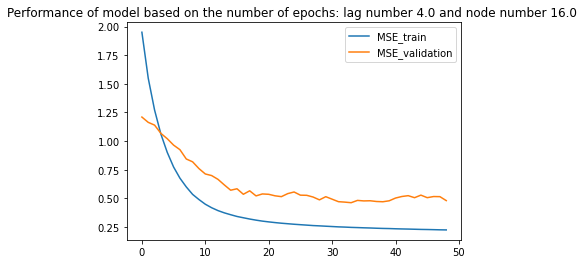

the number of nodes in the hidden layer is: 17.0 
Epoch 74: early stopping
mseval 0.75


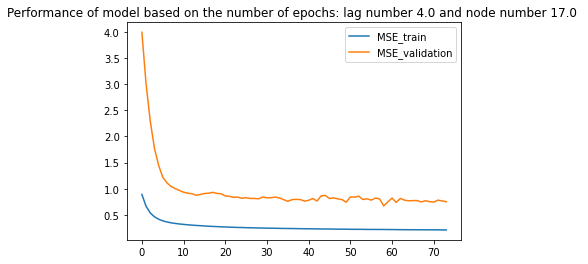

the number of nodes in the hidden layer is: 18.0 
Epoch 94: early stopping
mseval 0.78


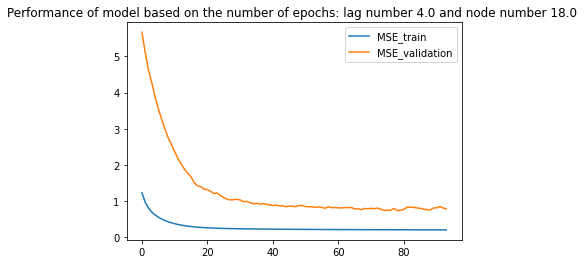

the number of nodes in the hidden layer is: 19.0 
Epoch 16: early stopping
mseval 0.47


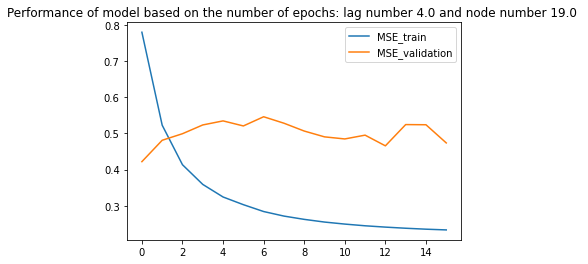

the number of nodes in the hidden layer is: 20.0 
Epoch 28: early stopping
mseval 0.60


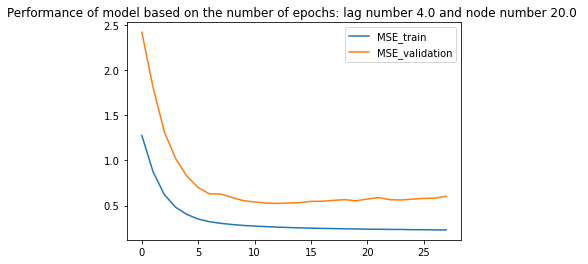

4
the time lag for prediction is: 2.0 
the number of nodes in the hidden layer is: 4.0 
Epoch 45: early stopping
mseval 0.73


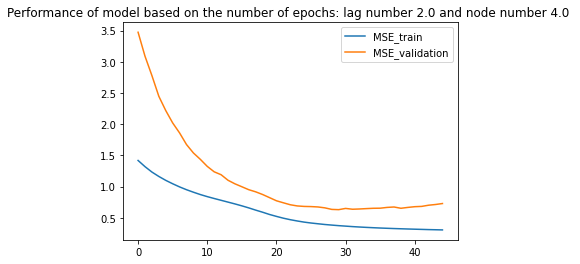

the number of nodes in the hidden layer is: 5.0 
mseval 0.86


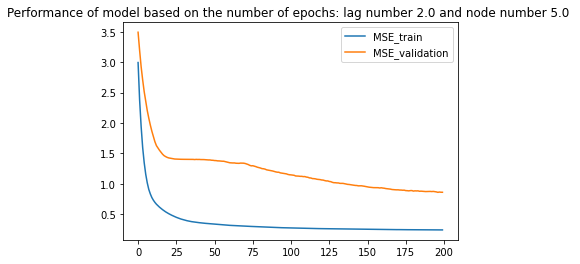

the number of nodes in the hidden layer is: 6.0 
mseval 0.93


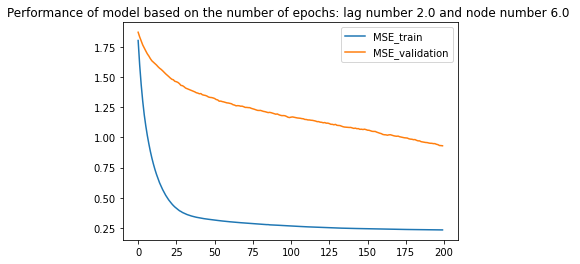

the number of nodes in the hidden layer is: 7.0 
Epoch 67: early stopping
mseval 0.56


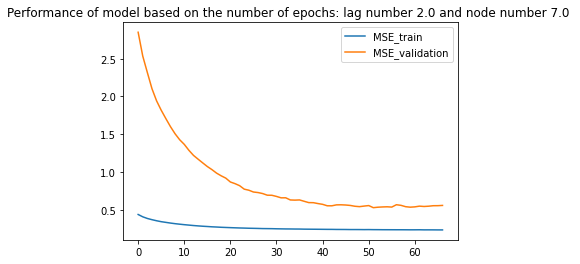

the number of nodes in the hidden layer is: 8.0 
Epoch 40: early stopping
mseval 0.67


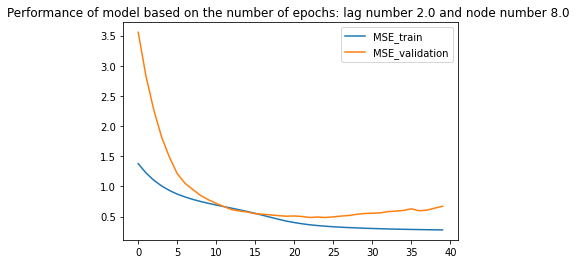

the number of nodes in the hidden layer is: 9.0 
Epoch 49: early stopping
mseval 0.58


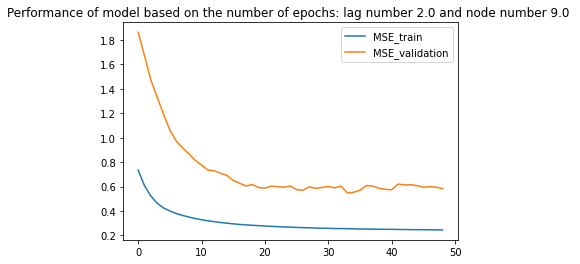

the number of nodes in the hidden layer is: 10.0 
Epoch 99: early stopping
mseval 0.50


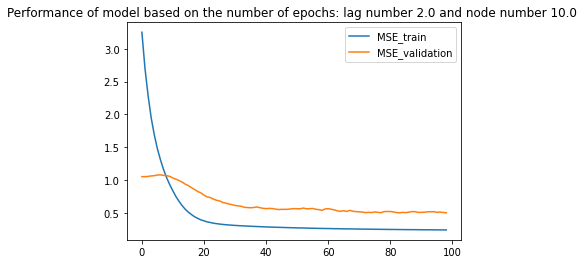

the number of nodes in the hidden layer is: 11.0 
Epoch 130: early stopping
mseval 0.59


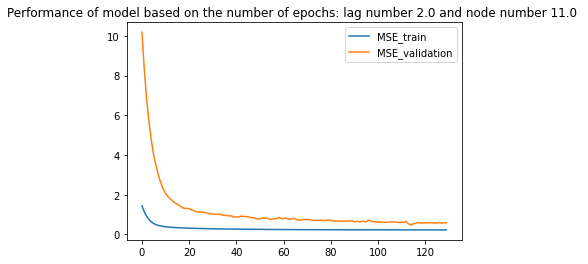

the number of nodes in the hidden layer is: 12.0 
Epoch 65: early stopping
mseval 0.53


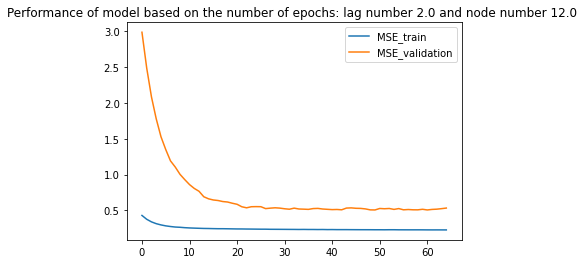

the number of nodes in the hidden layer is: 13.0 
Epoch 70: early stopping
mseval 0.43


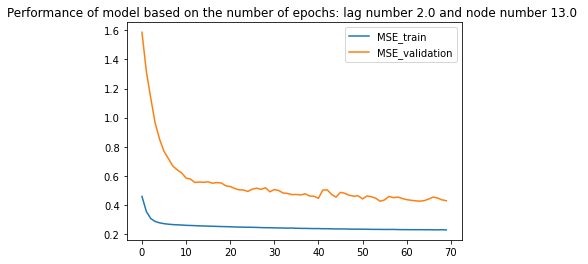

the number of nodes in the hidden layer is: 14.0 
Epoch 27: early stopping
mseval 0.62


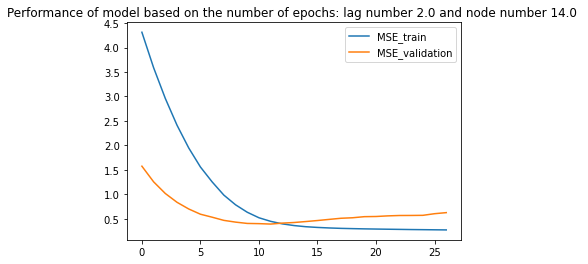

the number of nodes in the hidden layer is: 15.0 
Epoch 16: early stopping
mseval 0.51


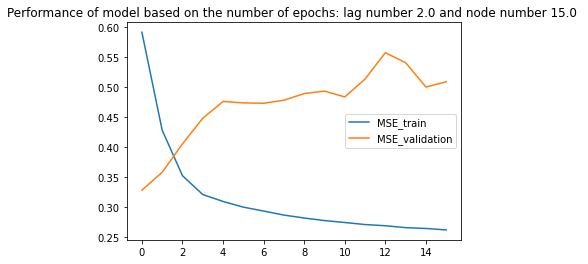

the number of nodes in the hidden layer is: 16.0 
Epoch 70: early stopping
mseval 0.56


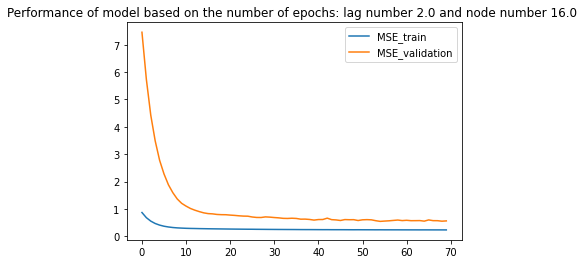

the number of nodes in the hidden layer is: 17.0 
Epoch 20: early stopping
mseval 0.57


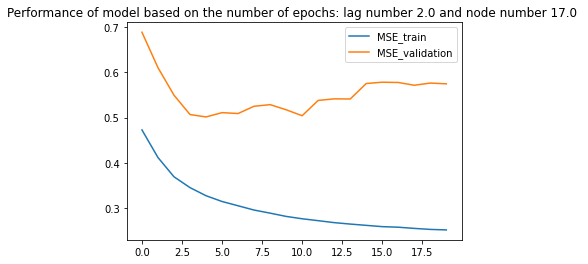

the number of nodes in the hidden layer is: 18.0 
Epoch 22: early stopping
mseval 0.50


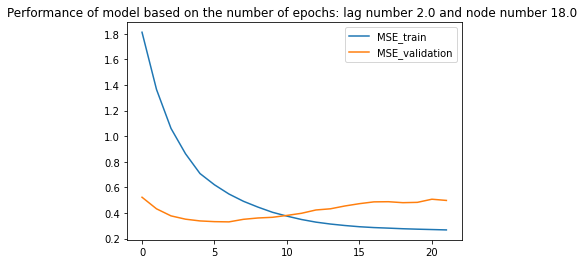

the number of nodes in the hidden layer is: 19.0 
Epoch 20: early stopping
mseval 0.46


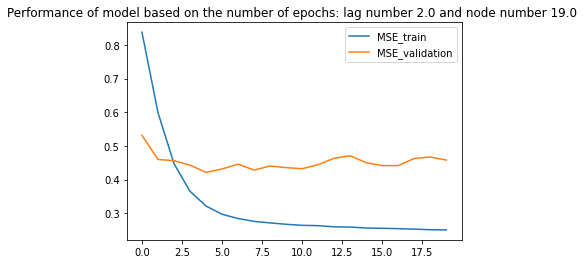

the number of nodes in the hidden layer is: 20.0 
Epoch 22: early stopping
mseval 0.44


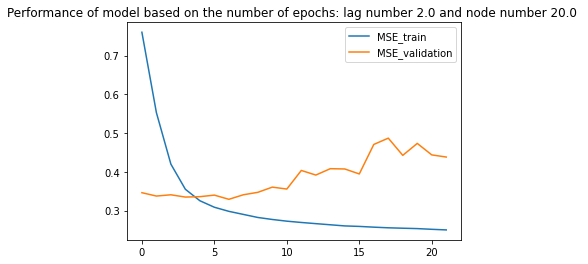

the time lag for prediction is: 3.0 
the number of nodes in the hidden layer is: 4.0 
Epoch 45: early stopping
mseval 0.43


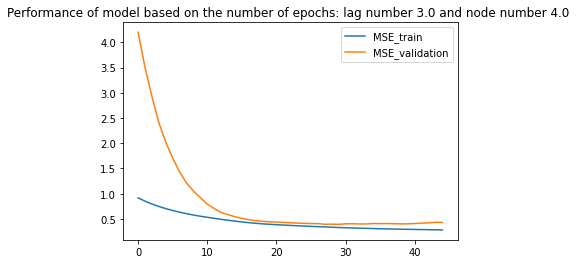

the number of nodes in the hidden layer is: 5.0 
Epoch 183: early stopping
mseval 0.41


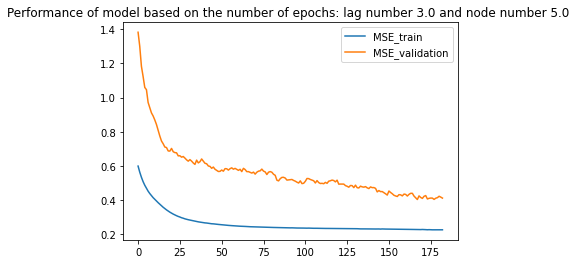

the number of nodes in the hidden layer is: 6.0 
Epoch 138: early stopping
mseval 0.81


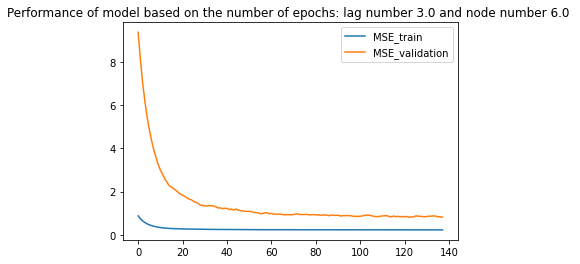

the number of nodes in the hidden layer is: 7.0 
Epoch 46: early stopping
mseval 0.87


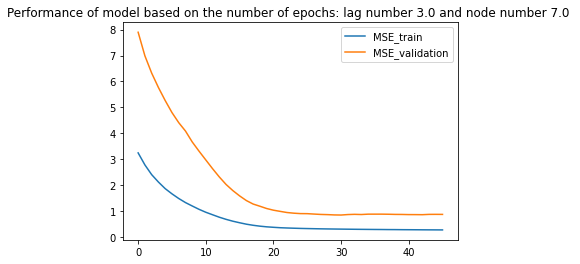

the number of nodes in the hidden layer is: 8.0 
Epoch 39: early stopping
mseval 0.33


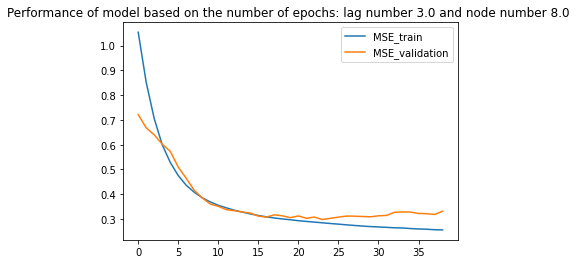

the number of nodes in the hidden layer is: 9.0 
Epoch 34: early stopping
mseval 0.45


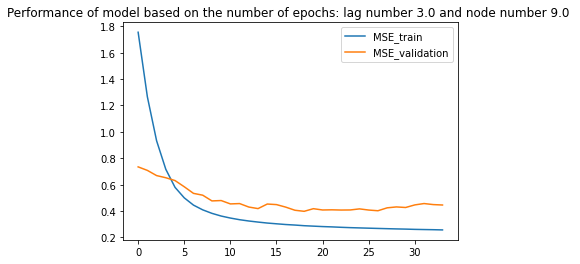

the number of nodes in the hidden layer is: 10.0 
Epoch 131: early stopping
mseval 0.77


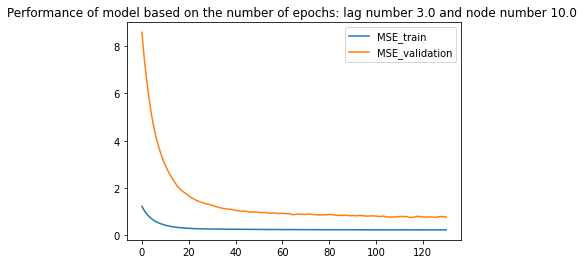

the number of nodes in the hidden layer is: 11.0 
Epoch 29: early stopping
mseval 0.29


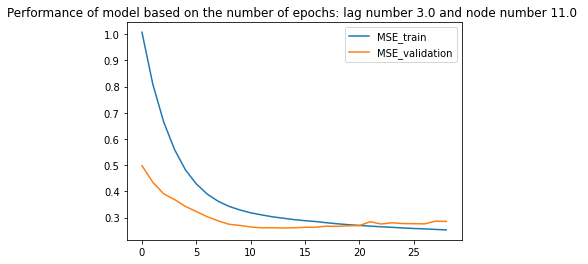

the number of nodes in the hidden layer is: 12.0 
Epoch 17: early stopping
mseval 0.56


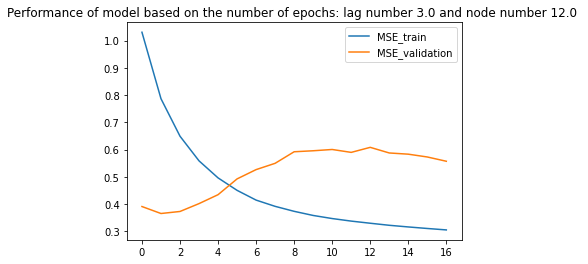

the number of nodes in the hidden layer is: 13.0 
Epoch 64: early stopping
mseval 0.52


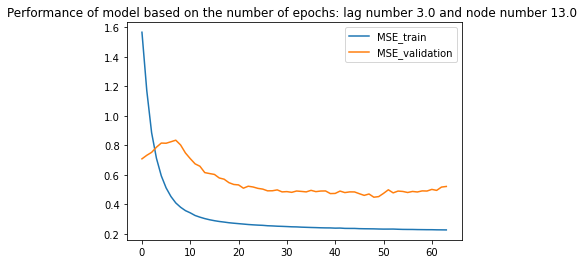

the number of nodes in the hidden layer is: 14.0 
Epoch 27: early stopping
mseval 0.45


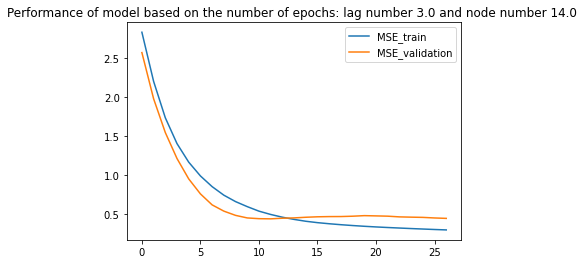

the number of nodes in the hidden layer is: 15.0 
Epoch 84: early stopping
mseval 0.45


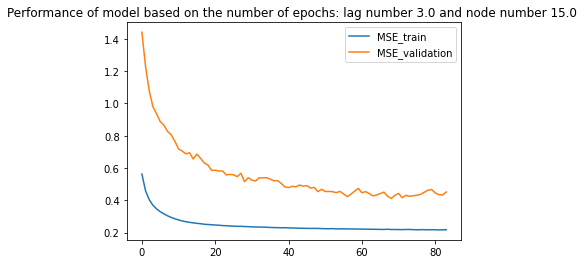

the number of nodes in the hidden layer is: 16.0 
Epoch 52: early stopping
mseval 0.72


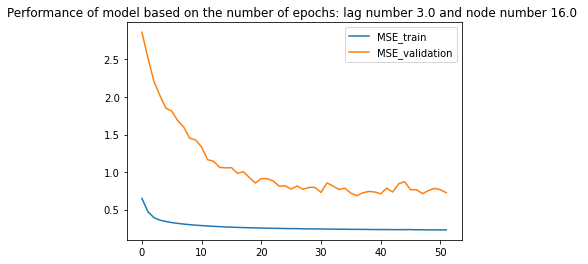

the number of nodes in the hidden layer is: 17.0 
Epoch 132: early stopping
mseval 0.70


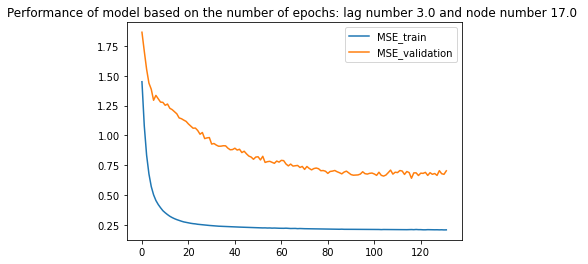

the number of nodes in the hidden layer is: 18.0 
Epoch 17: early stopping
mseval 0.56


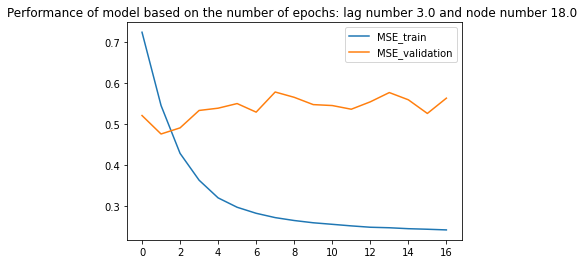

the number of nodes in the hidden layer is: 19.0 
Epoch 54: early stopping
mseval 0.46


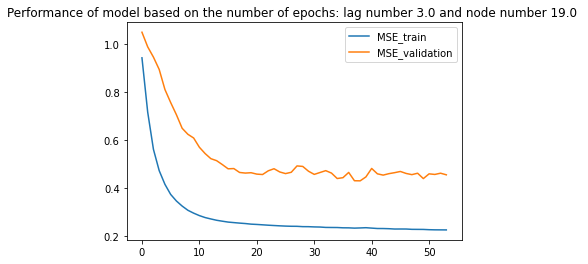

the number of nodes in the hidden layer is: 20.0 
Epoch 51: early stopping
mseval 0.42


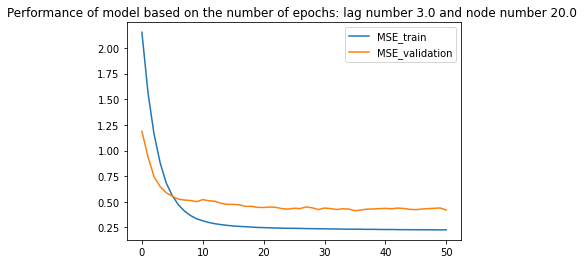

the time lag for prediction is: 4.0 
the number of nodes in the hidden layer is: 4.0 
mseval 0.80


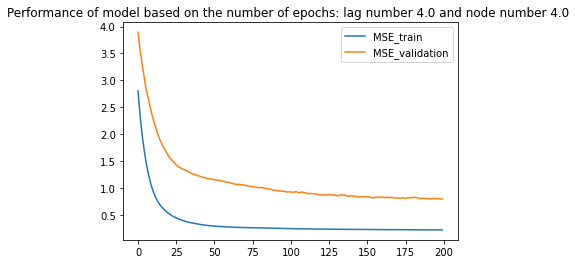

the number of nodes in the hidden layer is: 5.0 
Epoch 108: early stopping
mseval 1.35


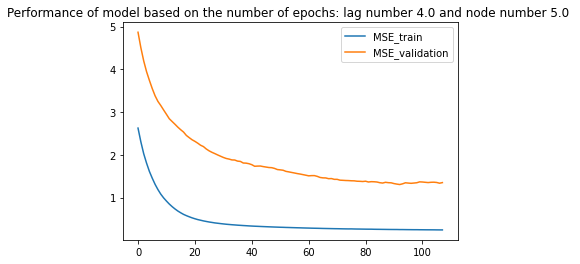

the number of nodes in the hidden layer is: 6.0 
Epoch 85: early stopping
mseval 0.30


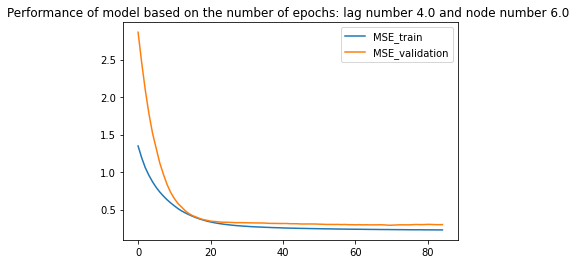

the number of nodes in the hidden layer is: 7.0 
Epoch 83: early stopping
mseval 0.28


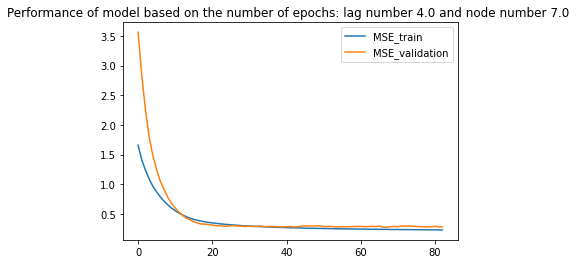

the number of nodes in the hidden layer is: 8.0 
Epoch 88: early stopping
mseval 0.41


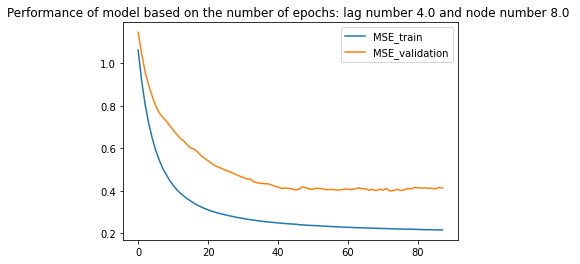

the number of nodes in the hidden layer is: 9.0 
Epoch 98: early stopping
mseval 0.61


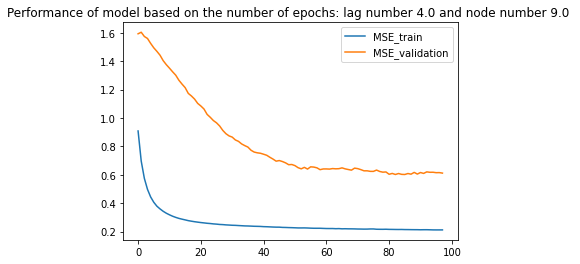

the number of nodes in the hidden layer is: 10.0 
Epoch 124: early stopping
mseval 0.65


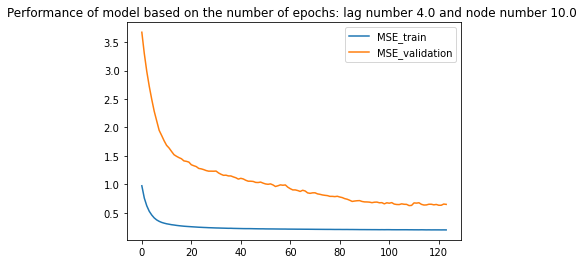

the number of nodes in the hidden layer is: 11.0 
Epoch 40: early stopping
mseval 0.39


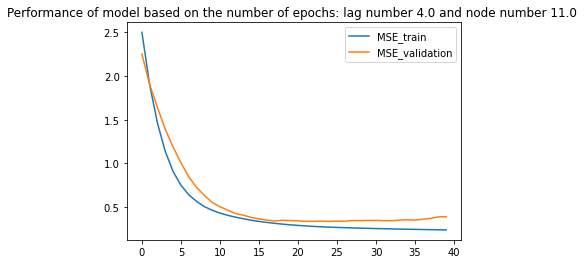

the number of nodes in the hidden layer is: 12.0 
Epoch 44: early stopping
mseval 0.28


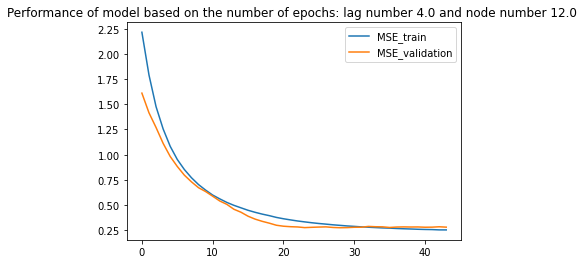

the number of nodes in the hidden layer is: 13.0 
Epoch 131: early stopping
mseval 0.35


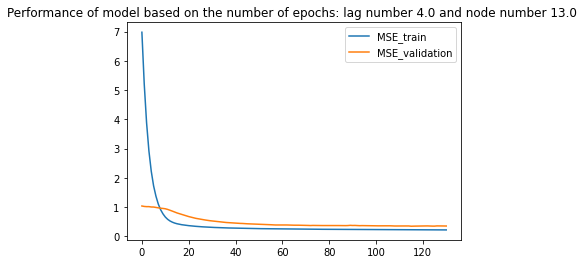

the number of nodes in the hidden layer is: 14.0 
Epoch 67: early stopping
mseval 0.57


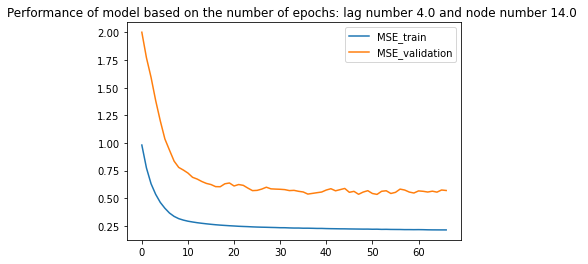

the number of nodes in the hidden layer is: 15.0 
Epoch 45: early stopping
mseval 0.41


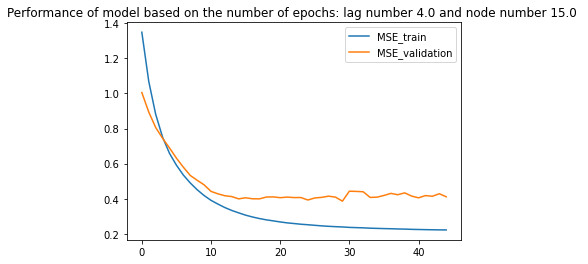

the number of nodes in the hidden layer is: 16.0 
Epoch 69: early stopping
mseval 0.46


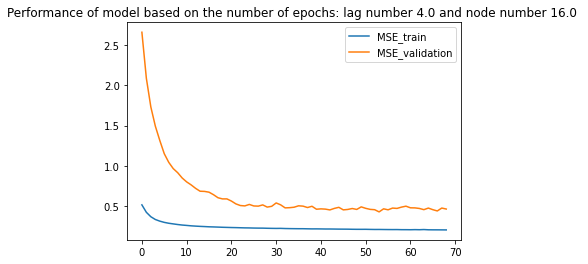

the number of nodes in the hidden layer is: 17.0 
Epoch 127: early stopping
mseval 0.48


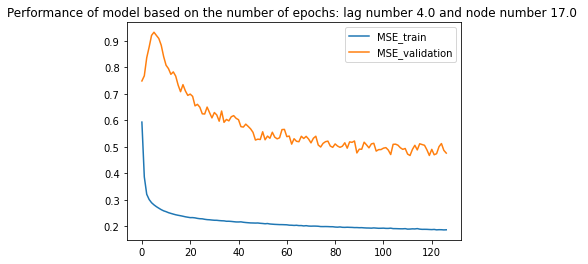

the number of nodes in the hidden layer is: 18.0 
Epoch 33: early stopping
mseval 0.68


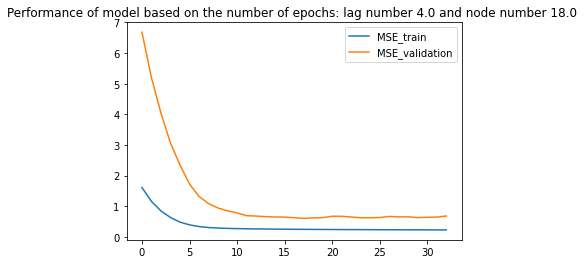

the number of nodes in the hidden layer is: 19.0 
Epoch 33: early stopping
mseval 0.35


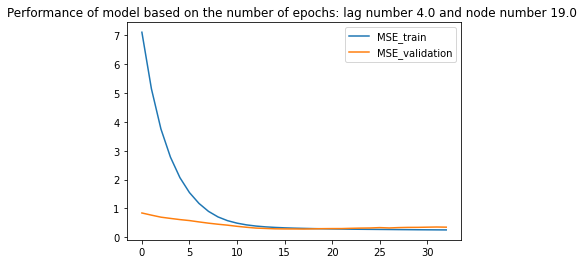

the number of nodes in the hidden layer is: 20.0 
Epoch 57: early stopping
mseval 0.37


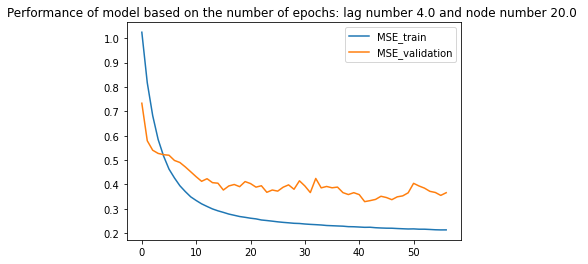

5
the time lag for prediction is: 2.0 
the number of nodes in the hidden layer is: 4.0 
Epoch 24: early stopping
mseval 0.62


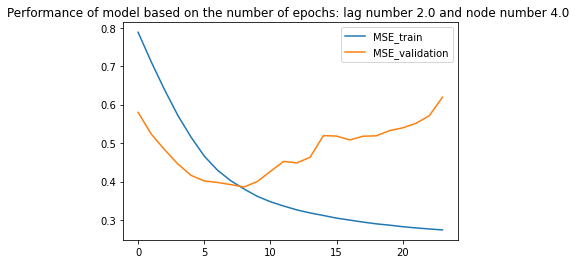

the number of nodes in the hidden layer is: 5.0 
Epoch 47: early stopping
mseval 0.53


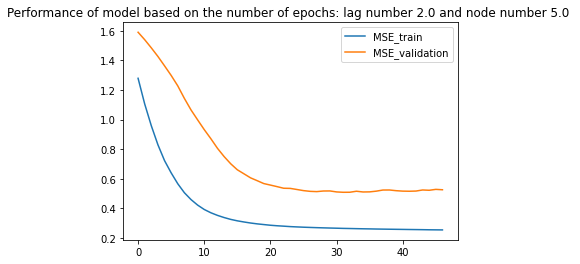

the number of nodes in the hidden layer is: 6.0 
Epoch 63: early stopping
mseval 0.36


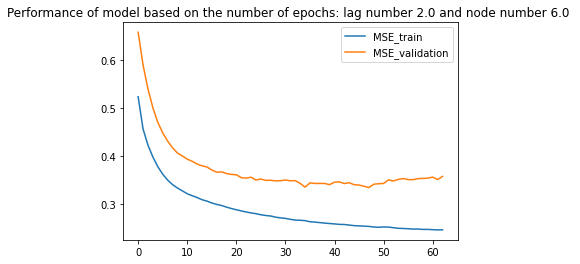

the number of nodes in the hidden layer is: 7.0 
Epoch 101: early stopping
mseval 0.54


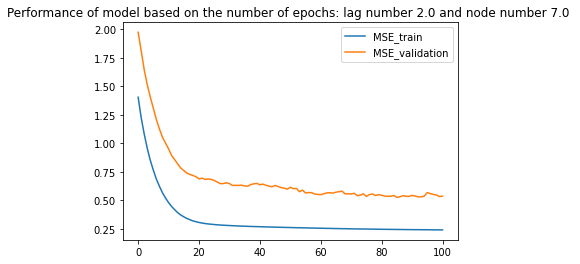

the number of nodes in the hidden layer is: 8.0 
Epoch 35: early stopping
mseval 0.68


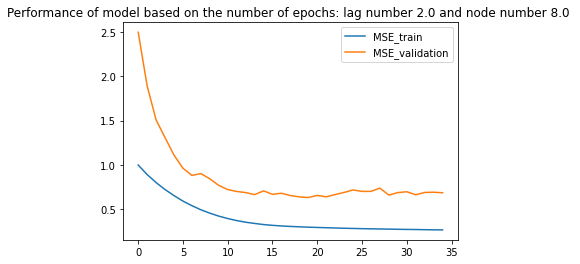

the number of nodes in the hidden layer is: 9.0 
Epoch 119: early stopping
mseval 0.51


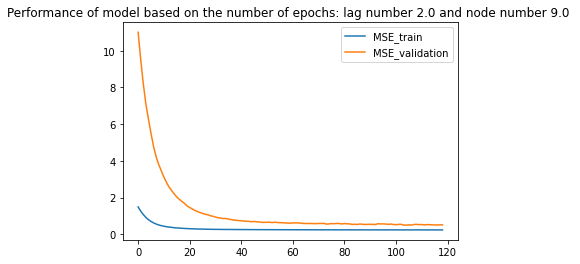

the number of nodes in the hidden layer is: 10.0 
Epoch 16: early stopping
mseval 0.43


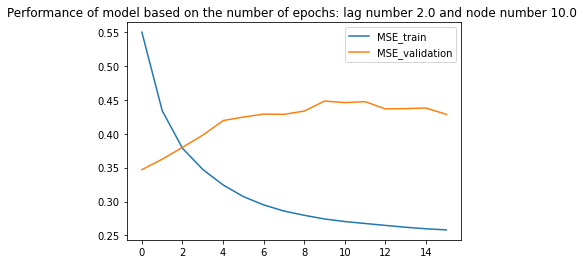

the number of nodes in the hidden layer is: 11.0 
Epoch 26: early stopping
mseval 0.53


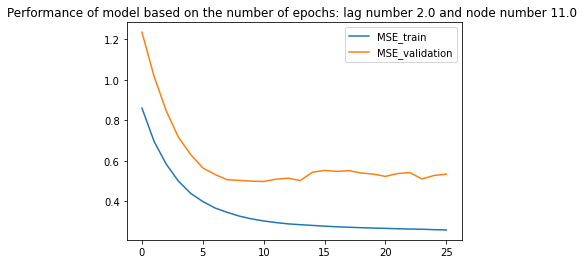

the number of nodes in the hidden layer is: 12.0 
Epoch 17: early stopping
mseval 0.65


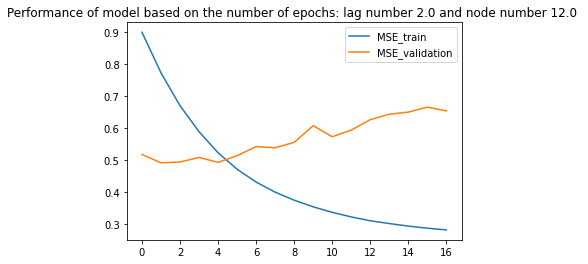

the number of nodes in the hidden layer is: 13.0 
Epoch 85: early stopping
mseval 0.62


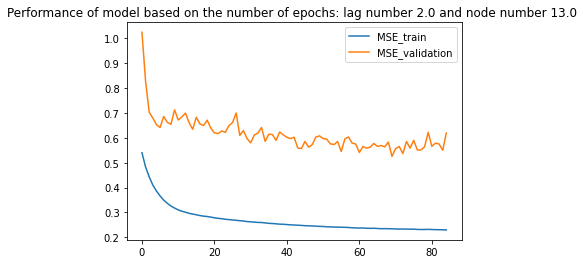

the number of nodes in the hidden layer is: 14.0 
Epoch 23: early stopping
mseval 0.44


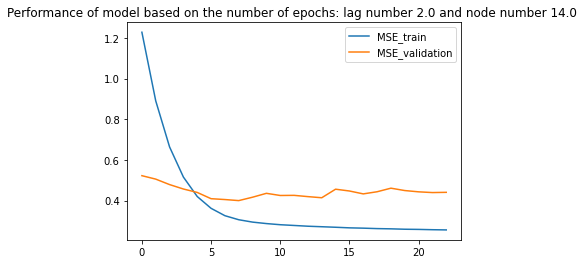

the number of nodes in the hidden layer is: 15.0 
Epoch 125: early stopping
mseval 0.52


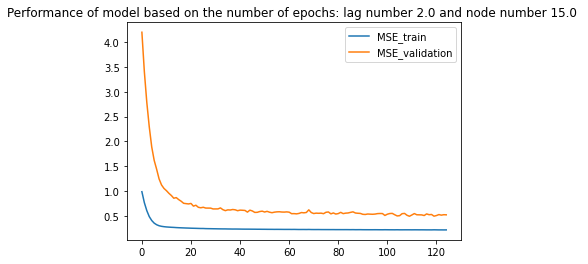

the number of nodes in the hidden layer is: 16.0 
Epoch 61: early stopping
mseval 0.54


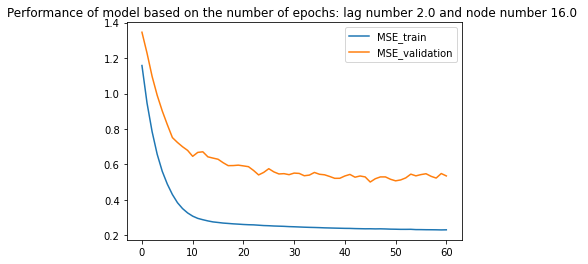

the number of nodes in the hidden layer is: 17.0 
Epoch 25: early stopping
mseval 0.42


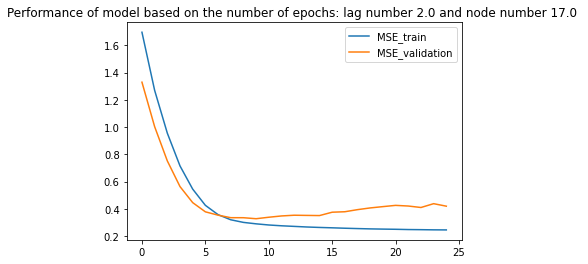

the number of nodes in the hidden layer is: 18.0 
Epoch 67: early stopping
mseval 0.51


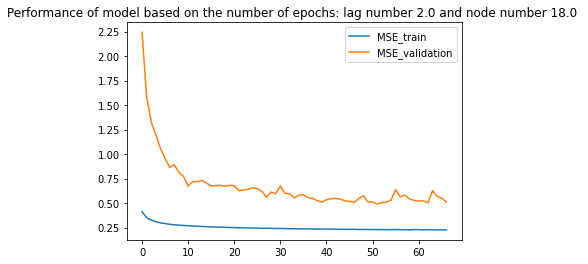

the number of nodes in the hidden layer is: 19.0 
Epoch 20: early stopping
mseval 0.51


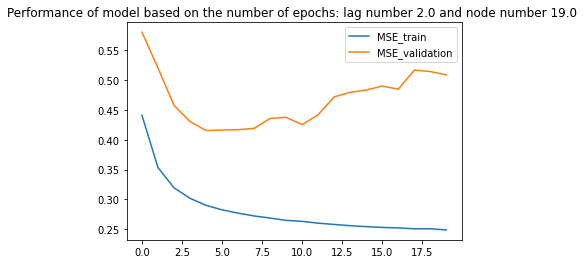

the number of nodes in the hidden layer is: 20.0 
Epoch 24: early stopping
mseval 0.64


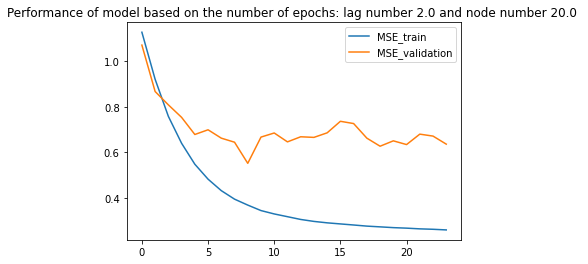

the time lag for prediction is: 3.0 
the number of nodes in the hidden layer is: 4.0 
mseval 1.52


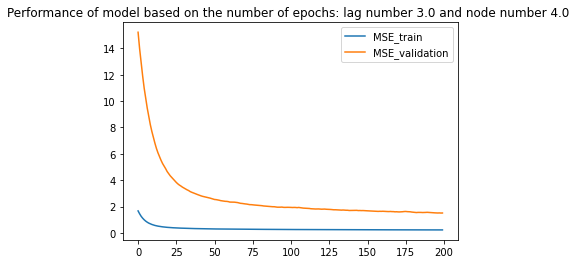

the number of nodes in the hidden layer is: 5.0 
Epoch 29: early stopping
mseval 0.46


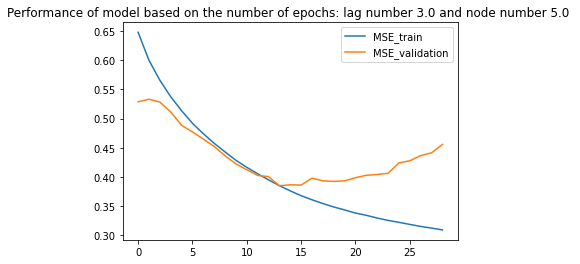

the number of nodes in the hidden layer is: 6.0 
Epoch 37: early stopping
mseval 0.43


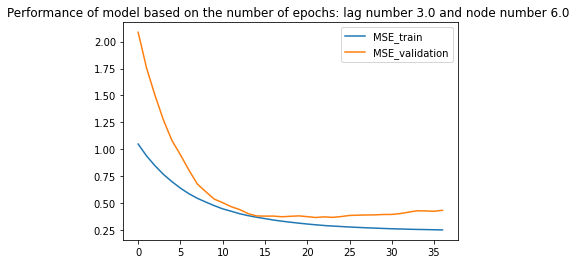

the number of nodes in the hidden layer is: 7.0 
Epoch 82: early stopping
mseval 0.48


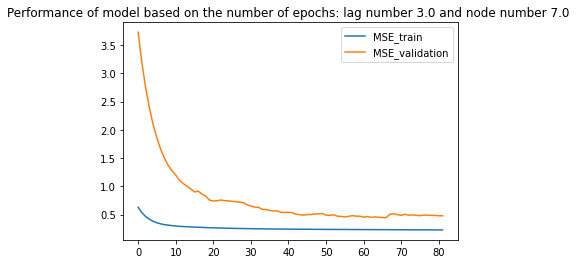

the number of nodes in the hidden layer is: 8.0 
Epoch 107: early stopping
mseval 0.57


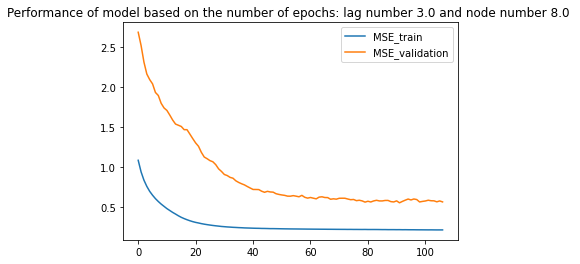

the number of nodes in the hidden layer is: 9.0 
Epoch 27: early stopping
mseval 0.48


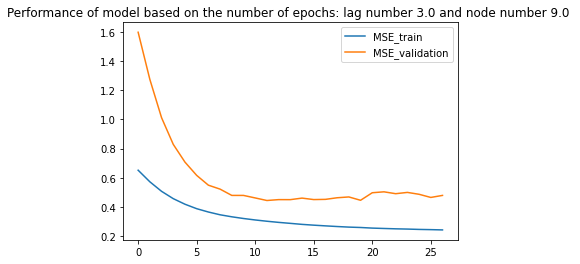

the number of nodes in the hidden layer is: 10.0 
Epoch 31: early stopping
mseval 0.46


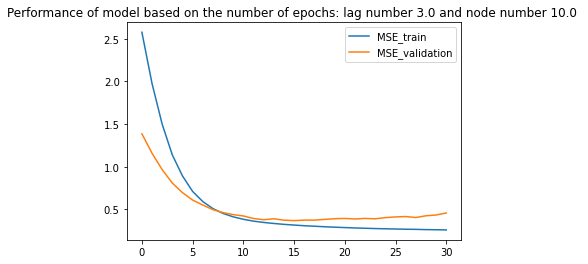

the number of nodes in the hidden layer is: 11.0 
Epoch 56: early stopping
mseval 0.59


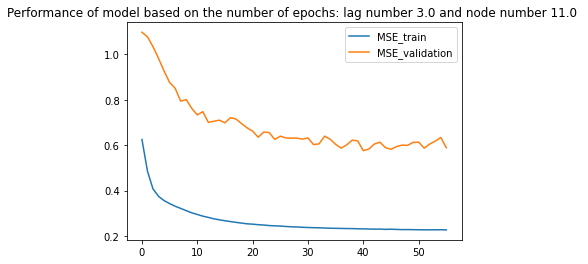

the number of nodes in the hidden layer is: 12.0 
Epoch 18: early stopping
mseval 0.93


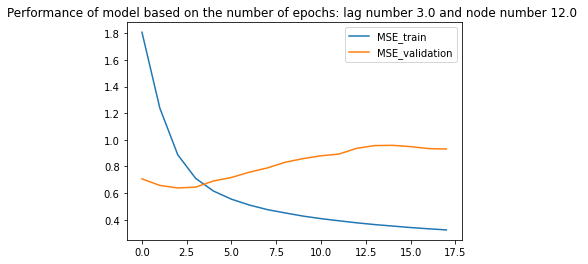

the number of nodes in the hidden layer is: 13.0 
Epoch 53: early stopping
mseval 0.36


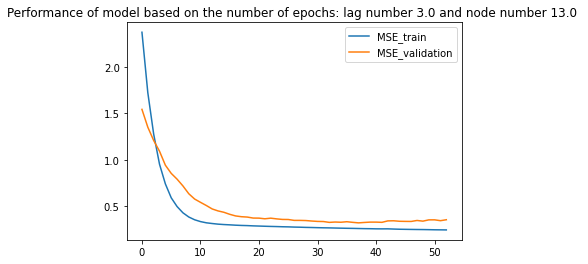

the number of nodes in the hidden layer is: 14.0 
Epoch 75: early stopping
mseval 0.51


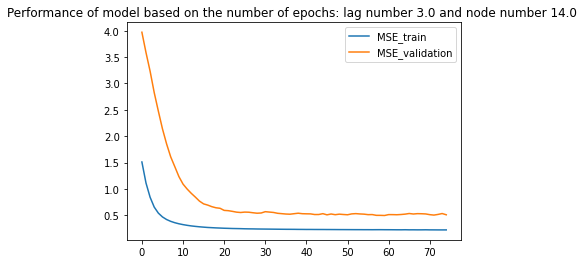

the number of nodes in the hidden layer is: 15.0 
Epoch 28: early stopping
mseval 0.53


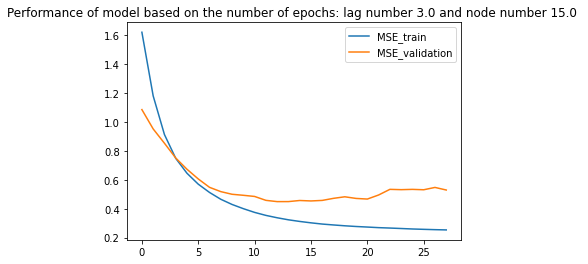

the number of nodes in the hidden layer is: 16.0 
Epoch 16: early stopping
mseval 0.44


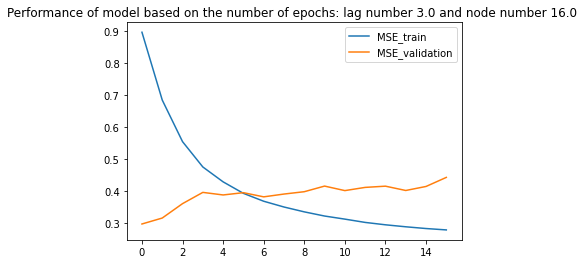

the number of nodes in the hidden layer is: 17.0 
Epoch 54: early stopping
mseval 0.67


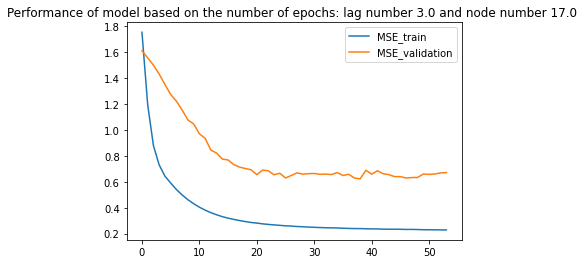

the number of nodes in the hidden layer is: 18.0 
Epoch 22: early stopping
mseval 0.33


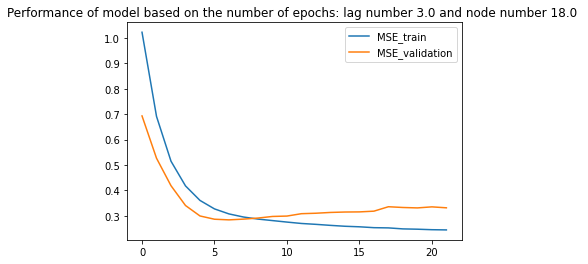

the number of nodes in the hidden layer is: 19.0 
Epoch 24: early stopping
mseval 0.71


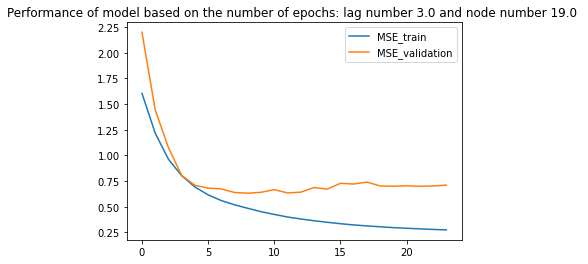

the number of nodes in the hidden layer is: 20.0 
Epoch 23: early stopping
mseval 0.61


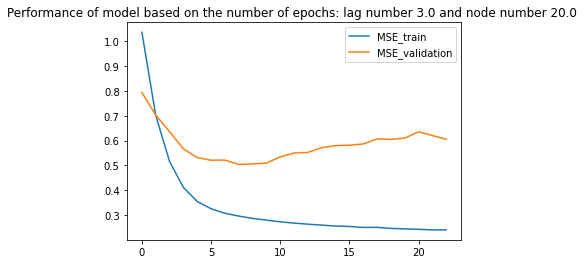

the time lag for prediction is: 4.0 
the number of nodes in the hidden layer is: 4.0 
Epoch 36: early stopping
mseval 0.64


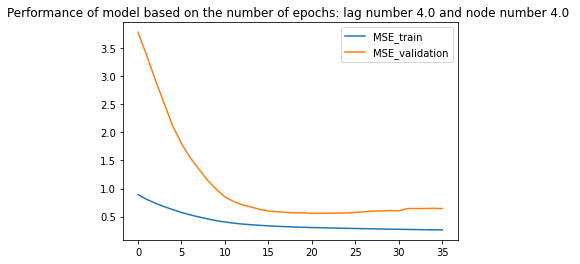

the number of nodes in the hidden layer is: 5.0 
Epoch 46: early stopping
mseval 1.19


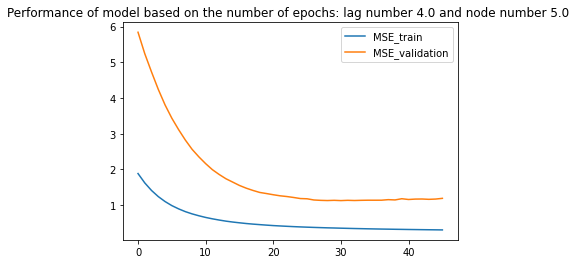

the number of nodes in the hidden layer is: 6.0 
Epoch 45: early stopping
mseval 0.31


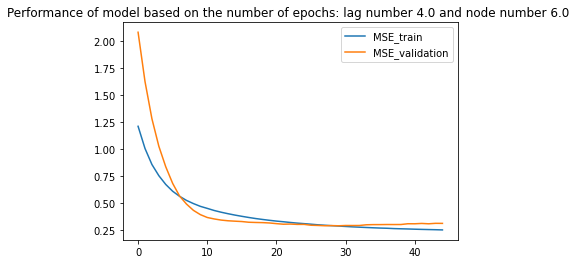

the number of nodes in the hidden layer is: 7.0 
Epoch 117: early stopping
mseval 1.10


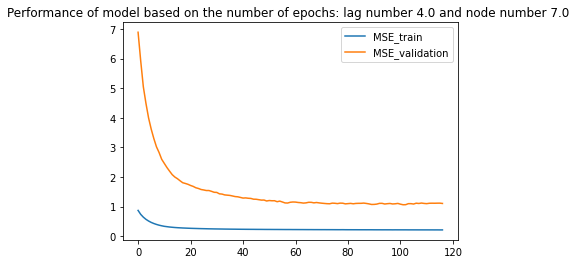

the number of nodes in the hidden layer is: 8.0 
Epoch 48: early stopping
mseval 0.46


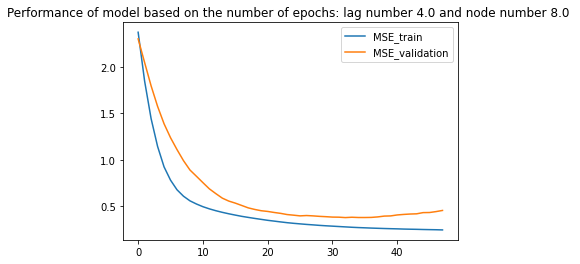

the number of nodes in the hidden layer is: 9.0 
Epoch 54: early stopping
mseval 0.59


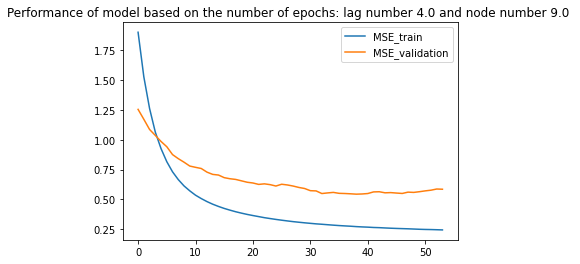

the number of nodes in the hidden layer is: 10.0 
Epoch 35: early stopping
mseval 0.31


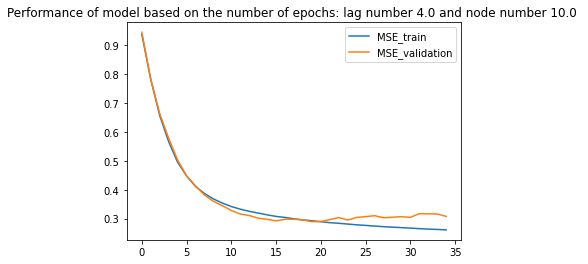

the number of nodes in the hidden layer is: 11.0 
Epoch 128: early stopping
mseval 0.59


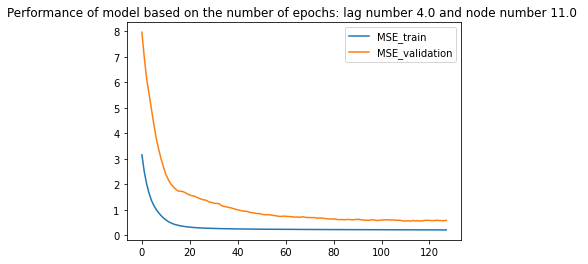

the number of nodes in the hidden layer is: 12.0 
Epoch 57: early stopping
mseval 0.80


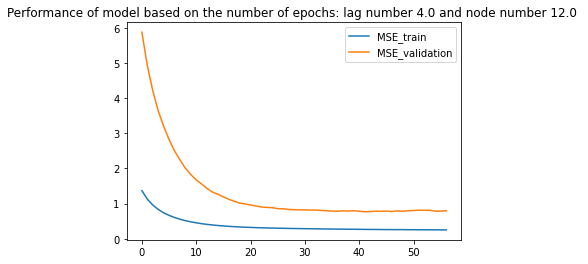

the number of nodes in the hidden layer is: 13.0 
Epoch 81: early stopping
mseval 0.50


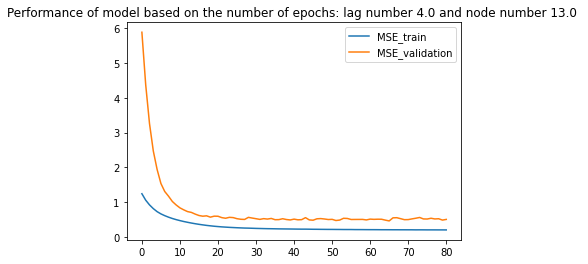

the number of nodes in the hidden layer is: 14.0 
Epoch 83: early stopping
mseval 0.66


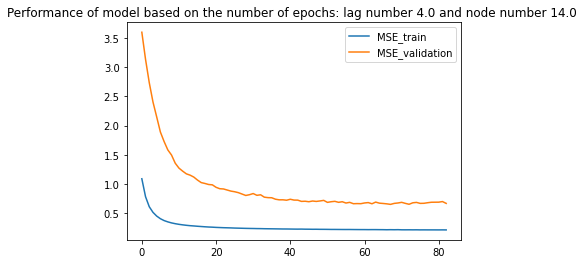

the number of nodes in the hidden layer is: 15.0 
Epoch 24: early stopping
mseval 0.36


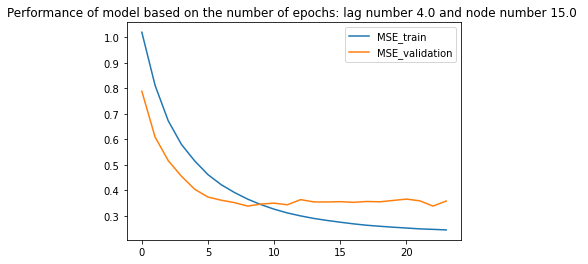

the number of nodes in the hidden layer is: 16.0 
Epoch 124: early stopping
mseval 0.90


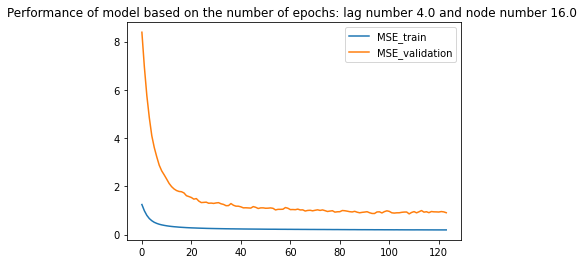

the number of nodes in the hidden layer is: 17.0 
Epoch 78: early stopping
mseval 0.61


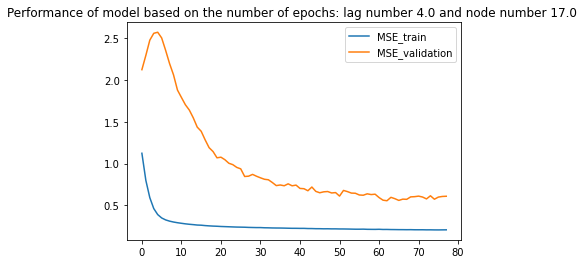

the number of nodes in the hidden layer is: 18.0 
Epoch 90: early stopping
mseval 0.60


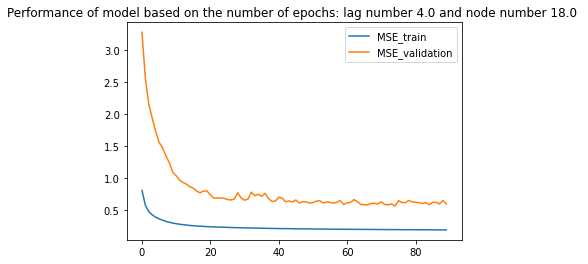

the number of nodes in the hidden layer is: 19.0 
Epoch 43: early stopping
mseval 0.84


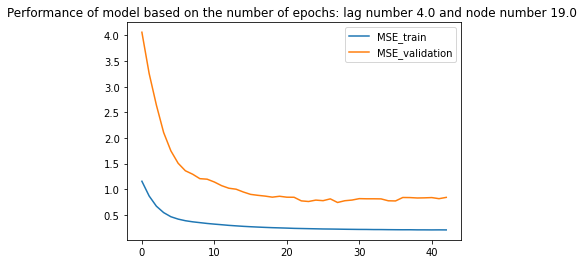

the number of nodes in the hidden layer is: 20.0 
Epoch 53: early stopping
mseval 0.55


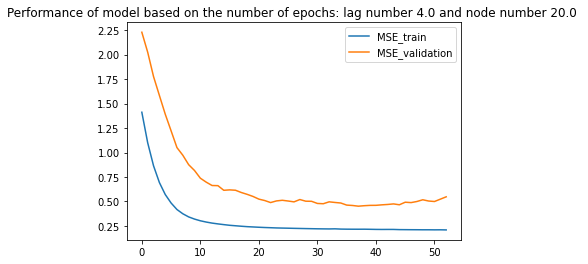

6
the time lag for prediction is: 2.0 
the number of nodes in the hidden layer is: 4.0 
Epoch 16: early stopping
mseval 0.35


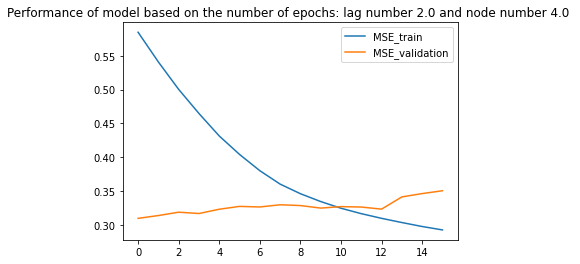

the number of nodes in the hidden layer is: 5.0 
Epoch 16: early stopping
mseval 0.44


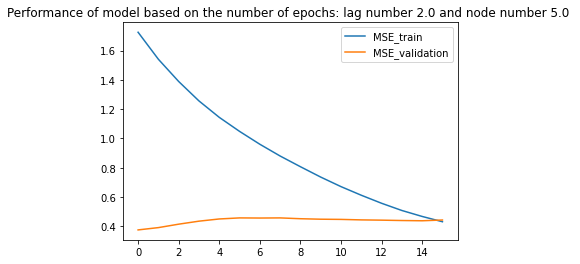

the number of nodes in the hidden layer is: 6.0 
Epoch 69: early stopping
mseval 0.56


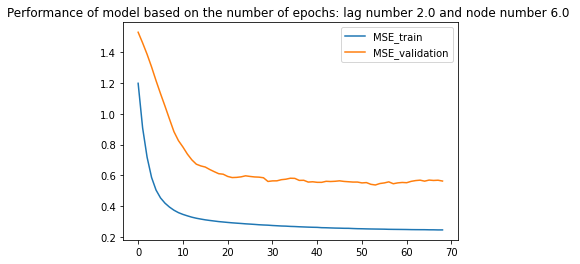

the number of nodes in the hidden layer is: 7.0 
Epoch 16: early stopping
mseval 0.80


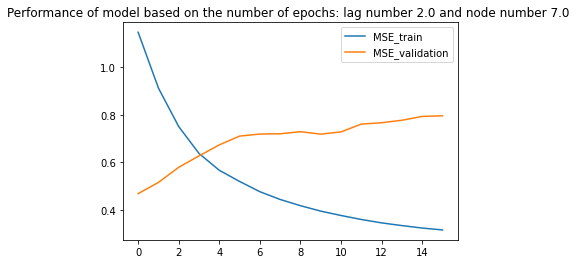

the number of nodes in the hidden layer is: 8.0 
Epoch 98: early stopping
mseval 0.65


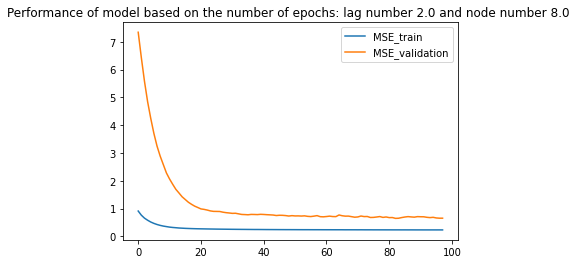

the number of nodes in the hidden layer is: 9.0 
Epoch 96: early stopping
mseval 0.70


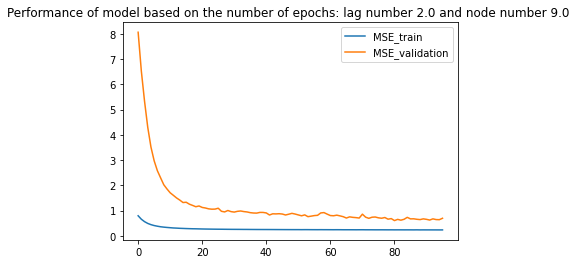

the number of nodes in the hidden layer is: 10.0 
Epoch 21: early stopping
mseval 0.62


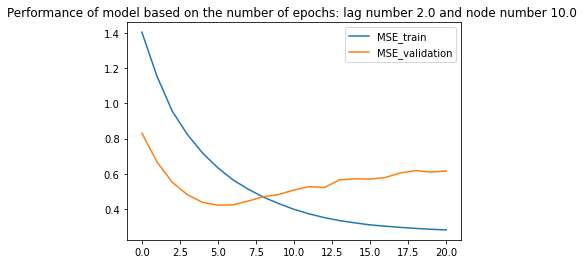

the number of nodes in the hidden layer is: 11.0 
Epoch 29: early stopping
mseval 0.59


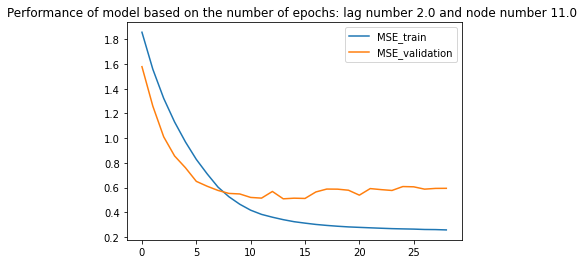

the number of nodes in the hidden layer is: 12.0 
Epoch 26: early stopping
mseval 0.41


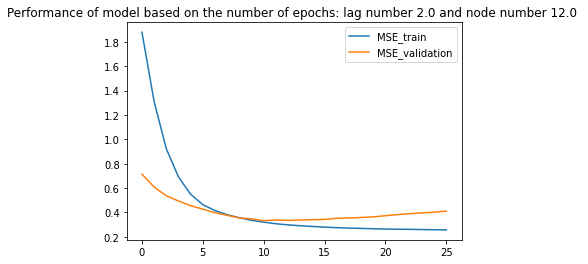

the number of nodes in the hidden layer is: 13.0 
Epoch 36: early stopping
mseval 0.53


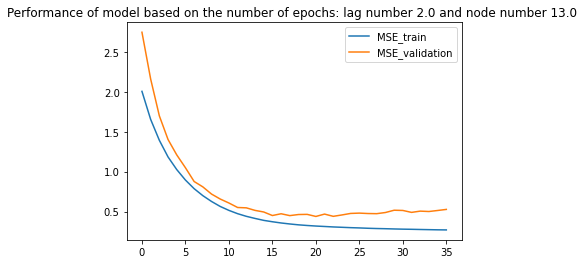

the number of nodes in the hidden layer is: 14.0 
Epoch 36: early stopping
mseval 0.41


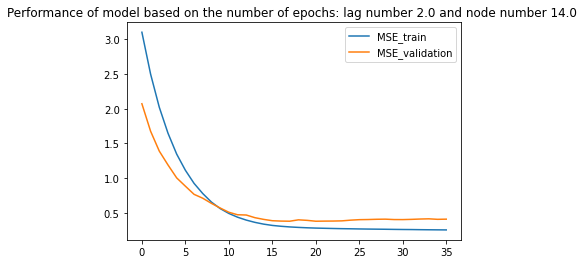

the number of nodes in the hidden layer is: 15.0 
Epoch 124: early stopping
mseval 0.54


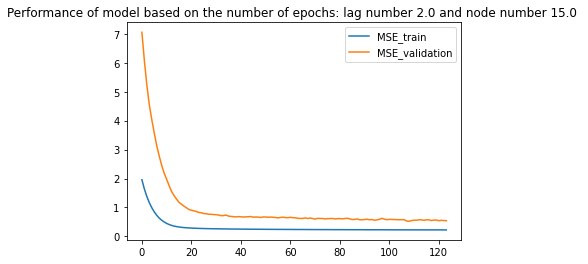

the number of nodes in the hidden layer is: 16.0 
Epoch 99: early stopping
mseval 0.58


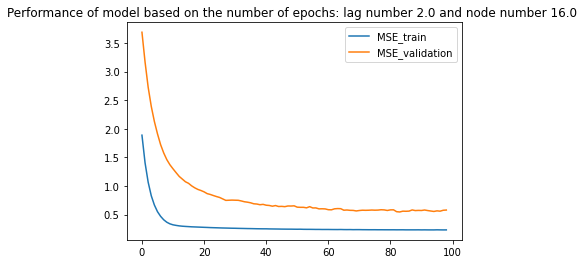

the number of nodes in the hidden layer is: 17.0 
Epoch 76: early stopping
mseval 0.56


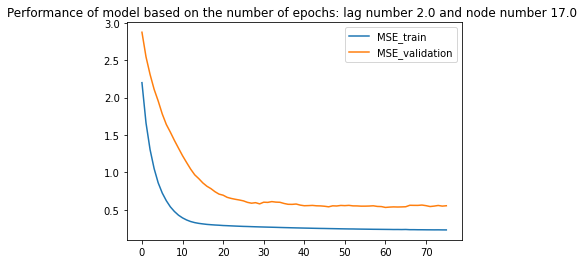

the number of nodes in the hidden layer is: 18.0 
Epoch 53: early stopping
mseval 0.53


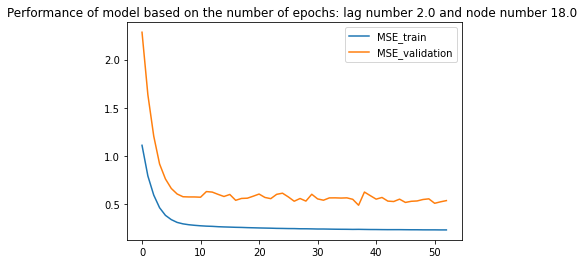

the number of nodes in the hidden layer is: 19.0 
Epoch 31: early stopping
mseval 0.58


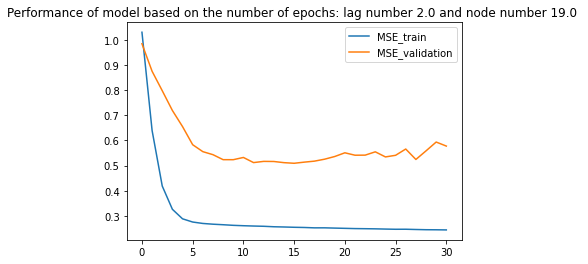

the number of nodes in the hidden layer is: 20.0 
Epoch 69: early stopping
mseval 0.51


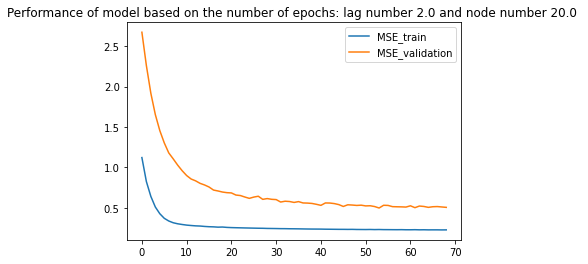

the time lag for prediction is: 3.0 
the number of nodes in the hidden layer is: 4.0 
Epoch 21: early stopping
mseval 0.67


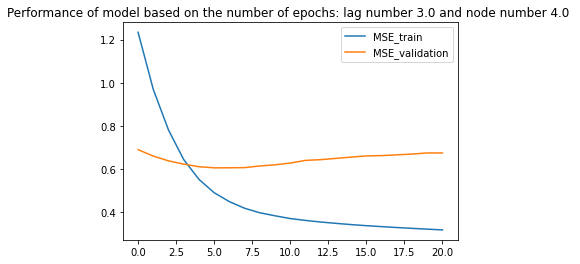

the number of nodes in the hidden layer is: 5.0 
Epoch 55: early stopping
mseval 0.41


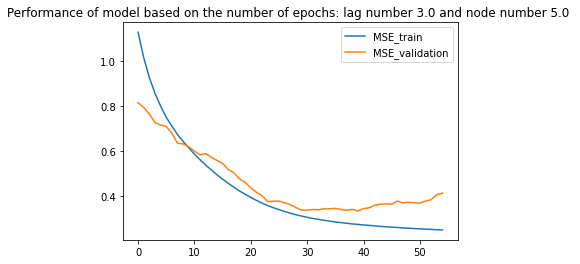

the number of nodes in the hidden layer is: 6.0 
Epoch 97: early stopping
mseval 0.33


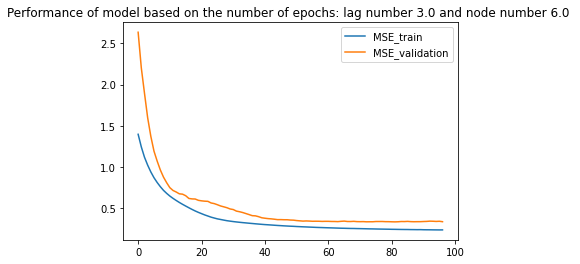

the number of nodes in the hidden layer is: 7.0 
Epoch 33: early stopping
mseval 0.62


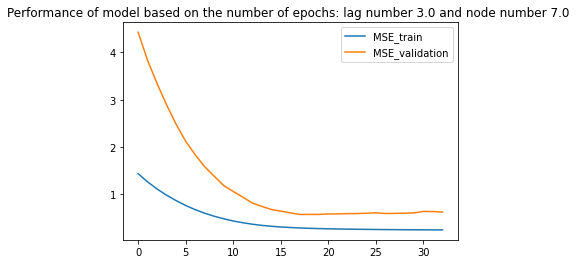

the number of nodes in the hidden layer is: 8.0 
Epoch 127: early stopping
mseval 0.64


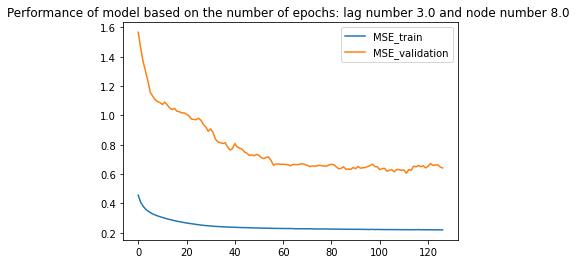

the number of nodes in the hidden layer is: 9.0 
Epoch 50: early stopping
mseval 0.52


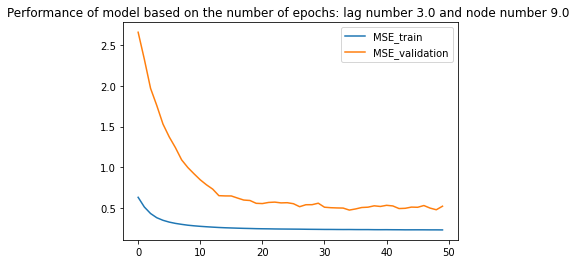

the number of nodes in the hidden layer is: 10.0 
Epoch 36: early stopping
mseval 0.33


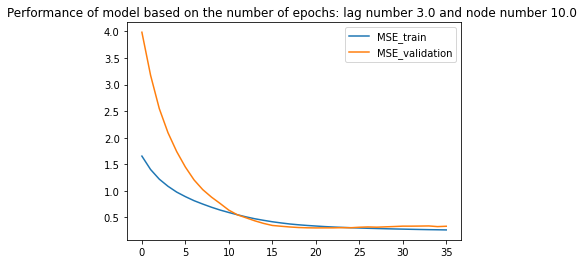

the number of nodes in the hidden layer is: 11.0 
Epoch 47: early stopping
mseval 0.79


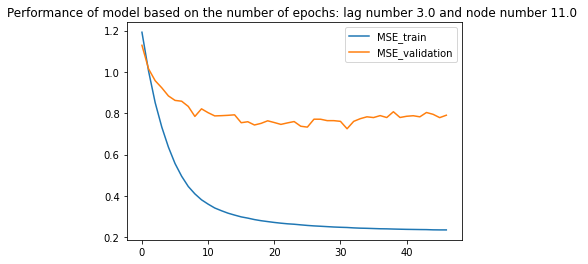

the number of nodes in the hidden layer is: 12.0 
Epoch 126: early stopping
mseval 0.86


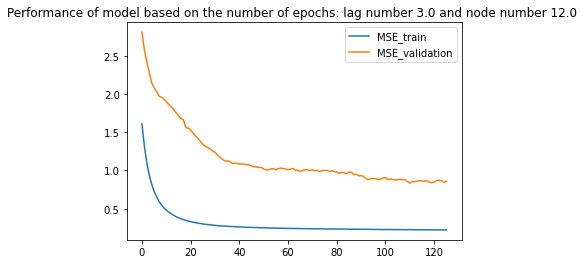

the number of nodes in the hidden layer is: 13.0 
Epoch 26: early stopping
mseval 0.50


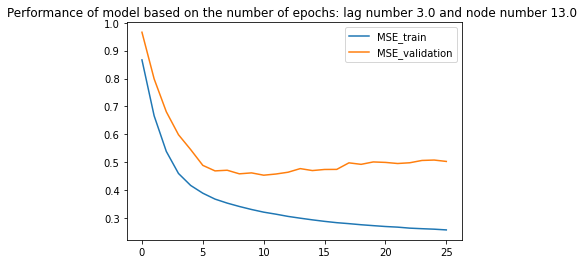

the number of nodes in the hidden layer is: 14.0 
Epoch 28: early stopping
mseval 0.58


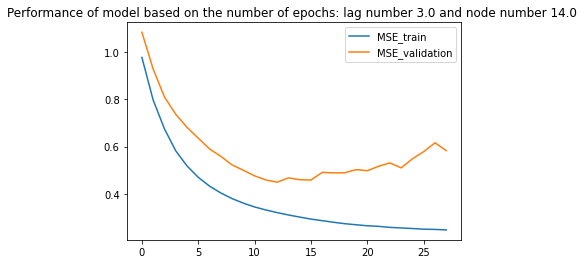

the number of nodes in the hidden layer is: 15.0 
Epoch 57: early stopping
mseval 0.65


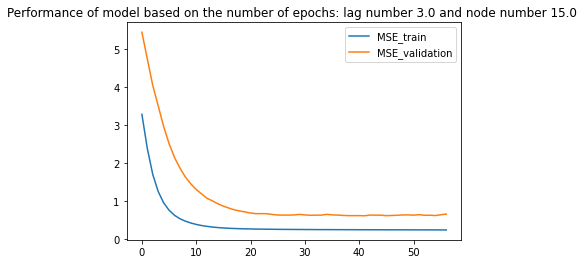

the number of nodes in the hidden layer is: 16.0 
Epoch 31: early stopping
mseval 0.51


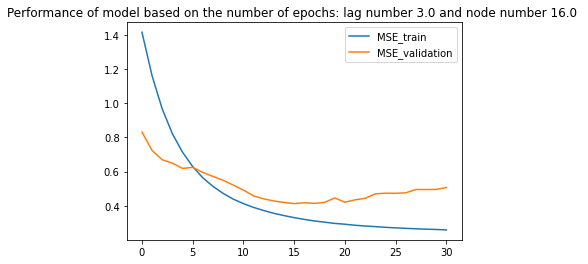

the number of nodes in the hidden layer is: 17.0 
Epoch 63: early stopping
mseval 0.50


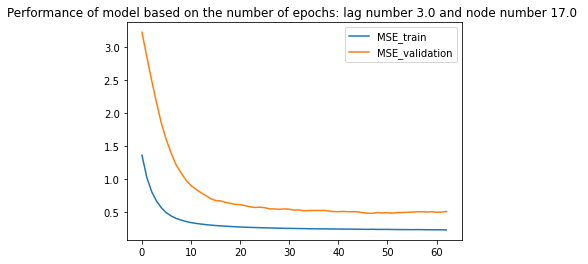

the number of nodes in the hidden layer is: 18.0 
Epoch 28: early stopping
mseval 0.43


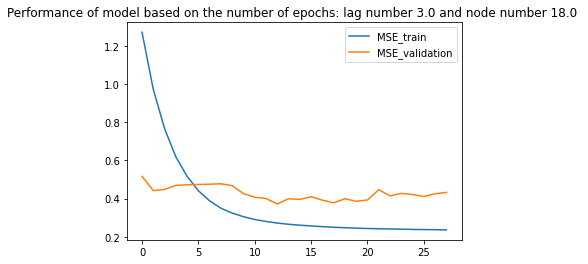

the number of nodes in the hidden layer is: 19.0 
Epoch 27: early stopping
mseval 0.74


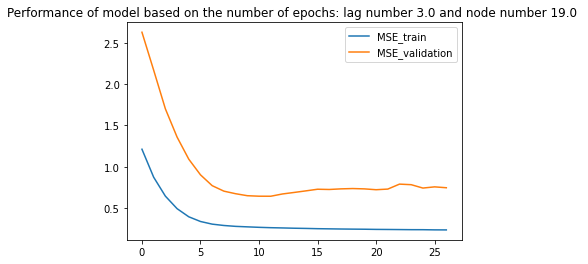

the number of nodes in the hidden layer is: 20.0 
Epoch 37: early stopping
mseval 0.49


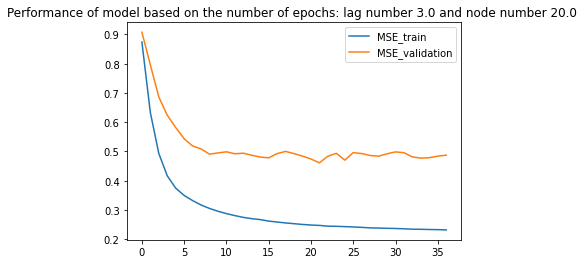

the time lag for prediction is: 4.0 
the number of nodes in the hidden layer is: 4.0 
Epoch 120: early stopping
mseval 0.48


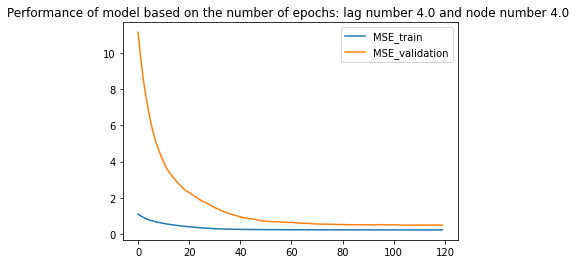

the number of nodes in the hidden layer is: 5.0 
Epoch 63: early stopping
mseval 1.07


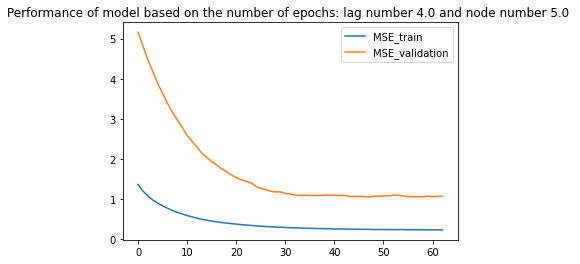

the number of nodes in the hidden layer is: 6.0 
Epoch 55: early stopping
mseval 0.41


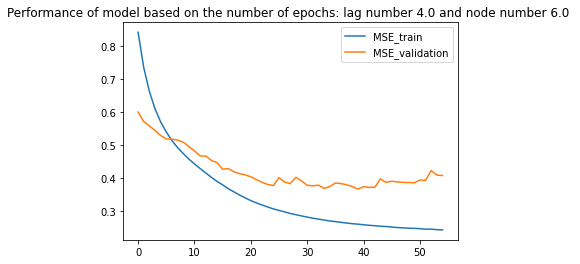

the number of nodes in the hidden layer is: 7.0 
mseval 0.72


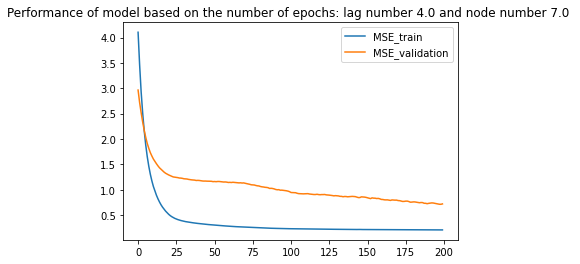

the number of nodes in the hidden layer is: 8.0 
Epoch 81: early stopping
mseval 0.46


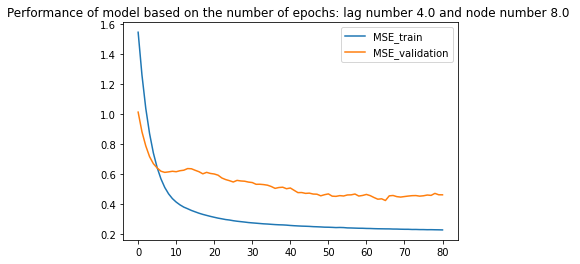

the number of nodes in the hidden layer is: 9.0 
Epoch 44: early stopping
mseval 0.53


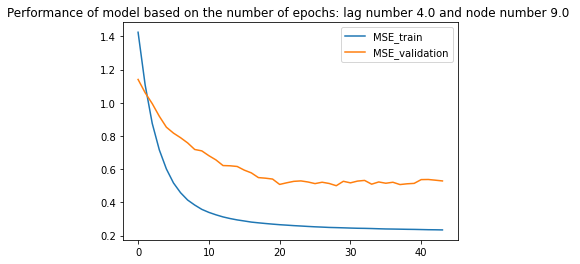

the number of nodes in the hidden layer is: 10.0 
Epoch 93: early stopping
mseval 0.99


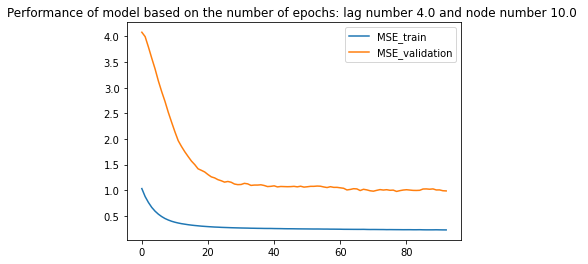

the number of nodes in the hidden layer is: 11.0 
Epoch 48: early stopping
mseval 0.91


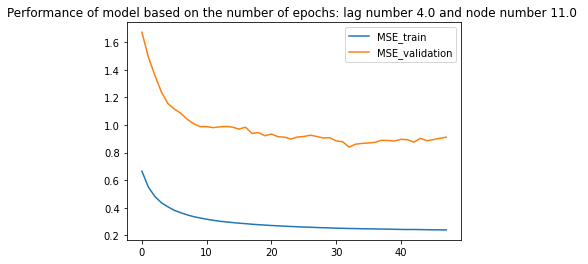

the number of nodes in the hidden layer is: 12.0 
Epoch 33: early stopping
mseval 0.43


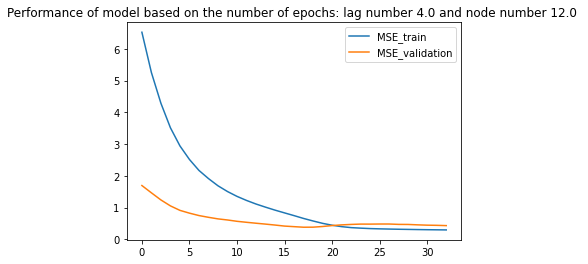

the number of nodes in the hidden layer is: 13.0 
Epoch 25: early stopping
mseval 0.58


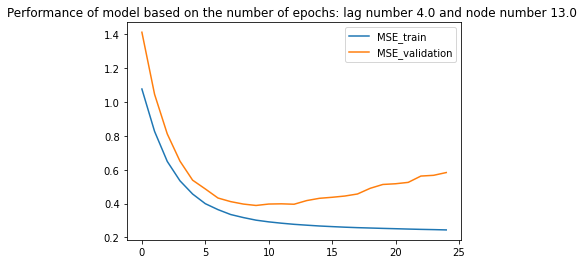

the number of nodes in the hidden layer is: 14.0 
Epoch 95: early stopping
mseval 1.01


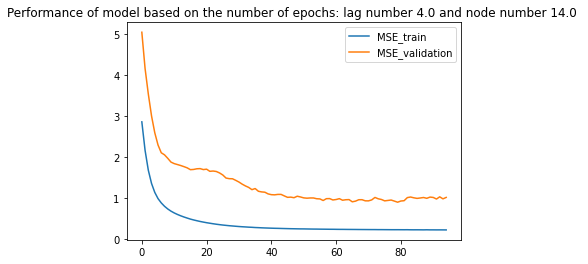

the number of nodes in the hidden layer is: 15.0 
Epoch 114: early stopping
mseval 0.39


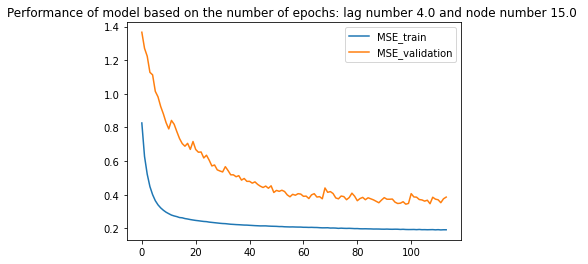

the number of nodes in the hidden layer is: 16.0 
Epoch 32: early stopping
mseval 0.53


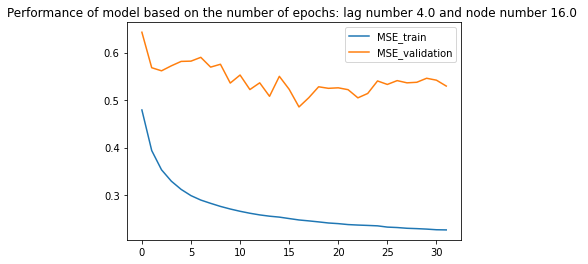

the number of nodes in the hidden layer is: 17.0 
Epoch 101: early stopping
mseval 0.58


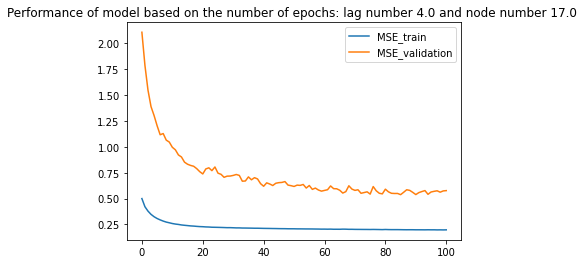

the number of nodes in the hidden layer is: 18.0 
Epoch 31: early stopping
mseval 0.61


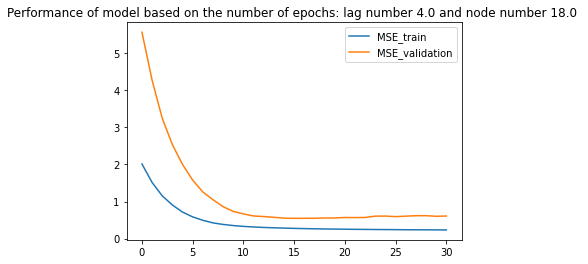

the number of nodes in the hidden layer is: 19.0 
Epoch 55: early stopping
mseval 0.54


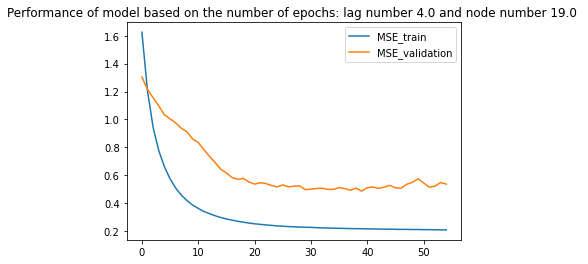

the number of nodes in the hidden layer is: 20.0 
Epoch 65: early stopping
mseval 0.48


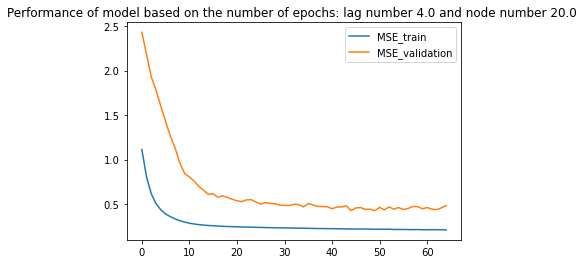

7
the time lag for prediction is: 2.0 
the number of nodes in the hidden layer is: 4.0 
Epoch 153: early stopping
mseval 0.55


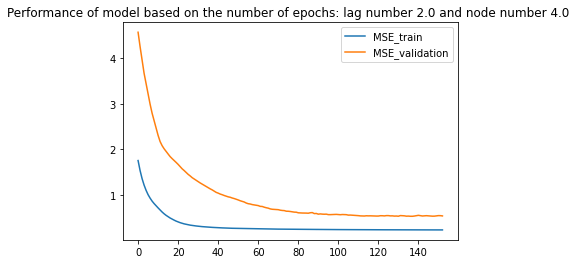

the number of nodes in the hidden layer is: 5.0 
Epoch 16: early stopping
mseval 0.56


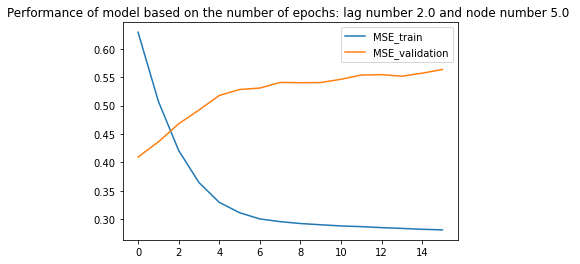

the number of nodes in the hidden layer is: 6.0 
Epoch 159: early stopping
mseval 0.69


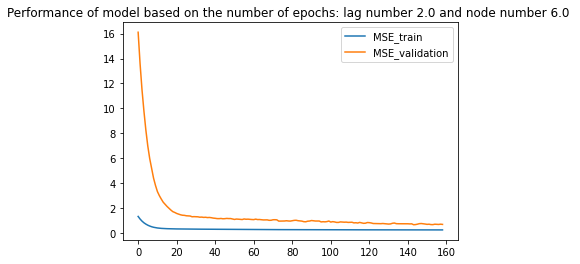

the number of nodes in the hidden layer is: 7.0 
Epoch 66: early stopping
mseval 0.56


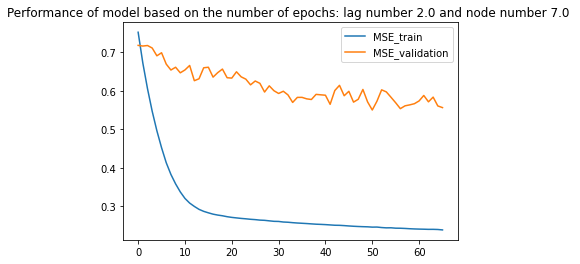

the number of nodes in the hidden layer is: 8.0 
Epoch 39: early stopping
mseval 0.69


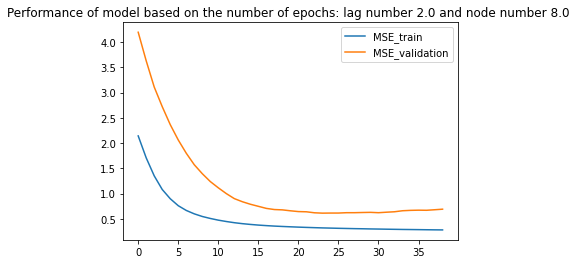

the number of nodes in the hidden layer is: 9.0 
Epoch 17: early stopping
mseval 0.42


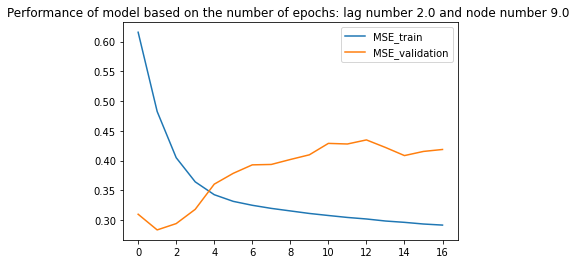

the number of nodes in the hidden layer is: 10.0 
Epoch 59: early stopping
mseval 0.52


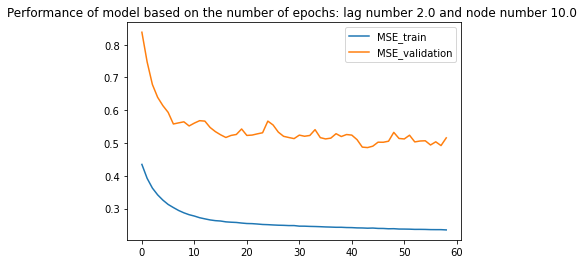

the number of nodes in the hidden layer is: 11.0 
Epoch 89: early stopping
mseval 0.62


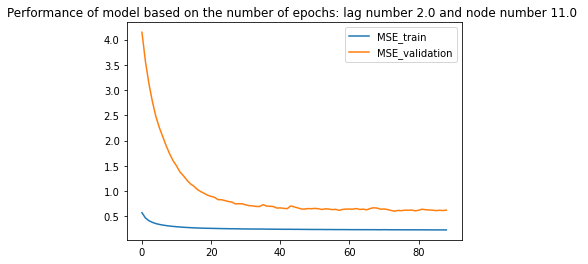

the number of nodes in the hidden layer is: 12.0 
Epoch 30: early stopping
mseval 0.50


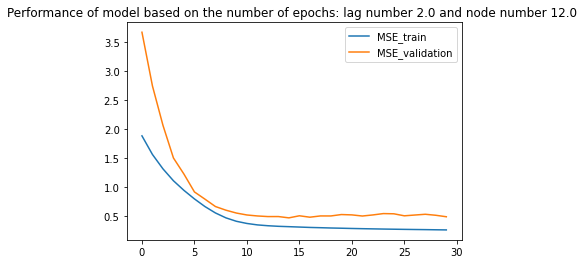

the number of nodes in the hidden layer is: 13.0 
Epoch 29: early stopping
mseval 0.45


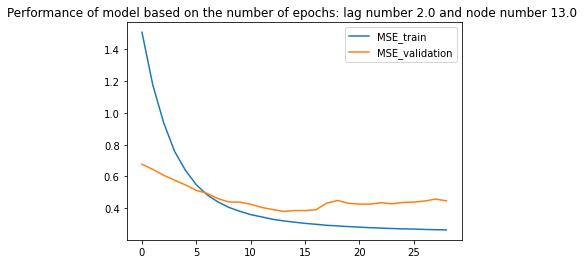

the number of nodes in the hidden layer is: 14.0 
Epoch 33: early stopping
mseval 0.65


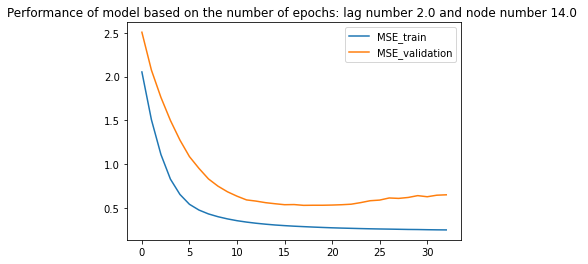

the number of nodes in the hidden layer is: 15.0 
Epoch 24: early stopping
mseval 0.36


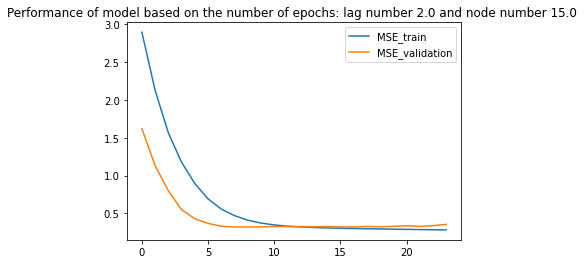

the number of nodes in the hidden layer is: 16.0 
Epoch 20: early stopping
mseval 0.57


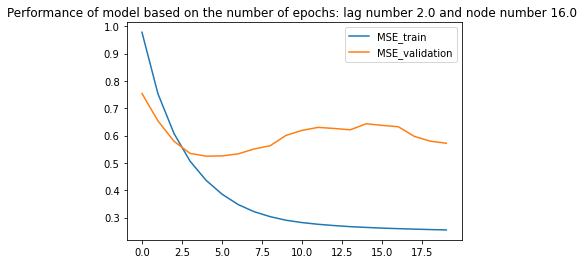

the number of nodes in the hidden layer is: 17.0 
Epoch 98: early stopping
mseval 0.52


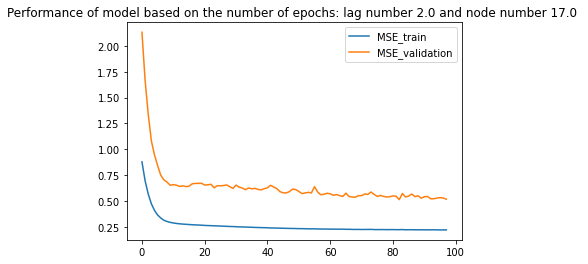

the number of nodes in the hidden layer is: 18.0 
Epoch 24: early stopping
mseval 0.55


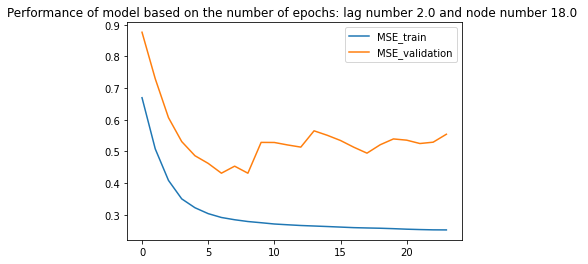

the number of nodes in the hidden layer is: 19.0 
Epoch 93: early stopping
mseval 0.46


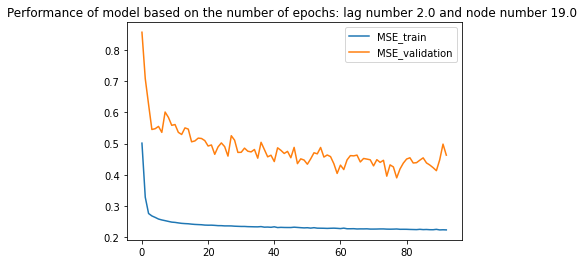

the number of nodes in the hidden layer is: 20.0 
Epoch 19: early stopping
mseval 0.39


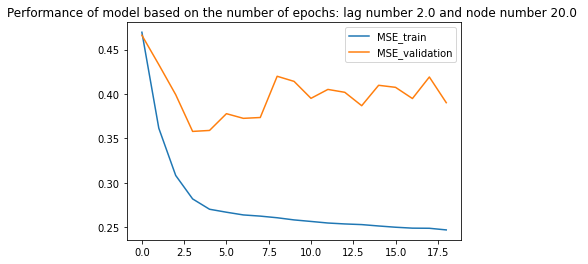

the time lag for prediction is: 3.0 
the number of nodes in the hidden layer is: 4.0 
Epoch 39: early stopping
mseval 0.38


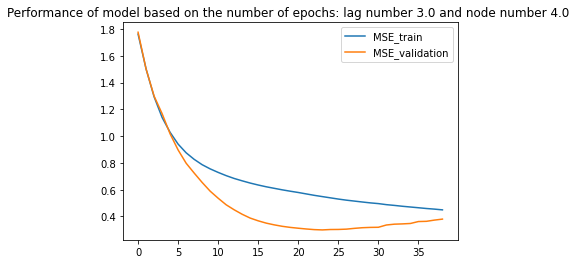

the number of nodes in the hidden layer is: 5.0 
Epoch 105: early stopping
mseval 0.70


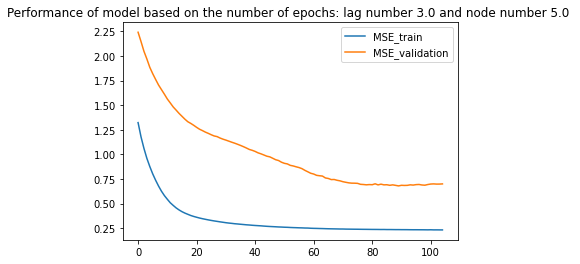

the number of nodes in the hidden layer is: 6.0 
Epoch 68: early stopping
mseval 0.32


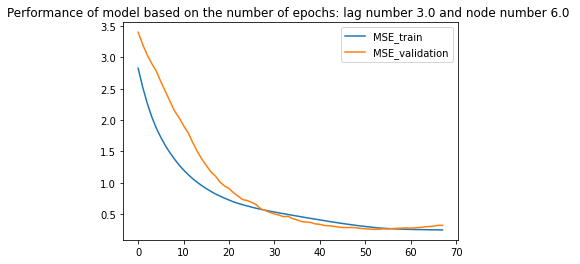

the number of nodes in the hidden layer is: 7.0 
mseval 0.64


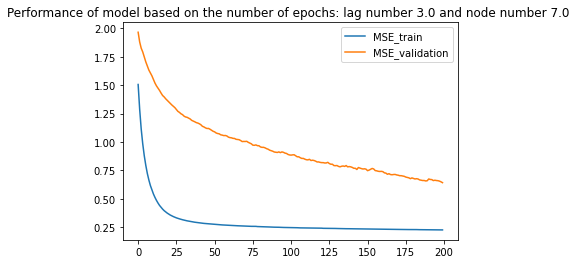

the number of nodes in the hidden layer is: 8.0 
Epoch 35: early stopping
mseval 0.63


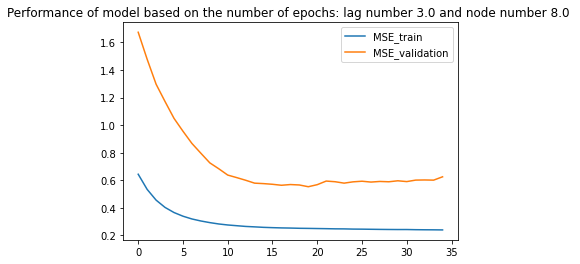

the number of nodes in the hidden layer is: 9.0 
Epoch 86: early stopping
mseval 0.54


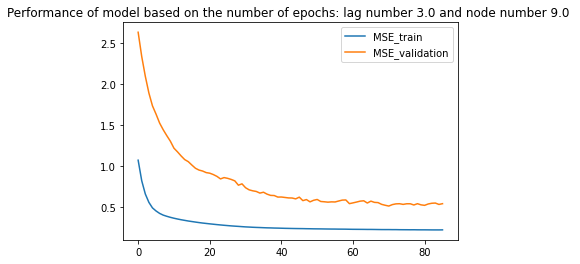

the number of nodes in the hidden layer is: 10.0 
Epoch 50: early stopping
mseval 0.32


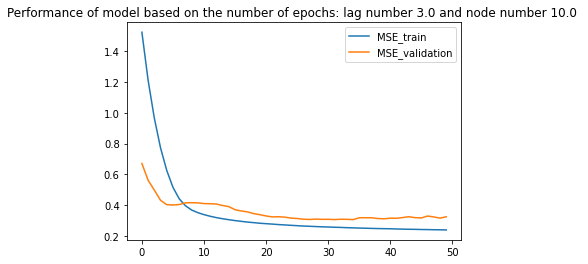

the number of nodes in the hidden layer is: 11.0 
mseval 0.63


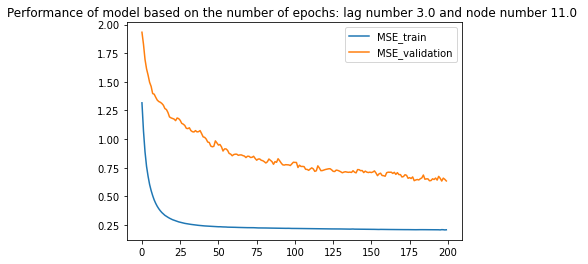

the number of nodes in the hidden layer is: 12.0 
Epoch 34: early stopping
mseval 0.59


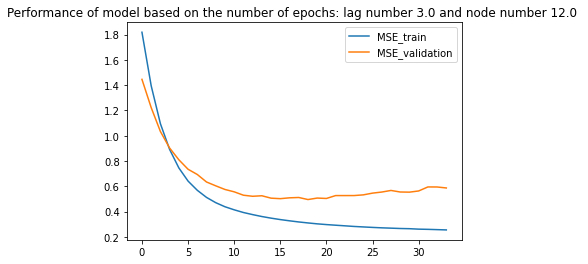

the number of nodes in the hidden layer is: 13.0 
Epoch 49: early stopping
mseval 0.53


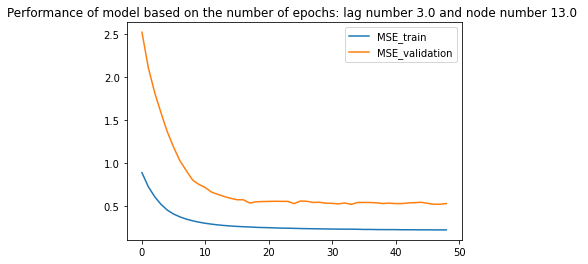

the number of nodes in the hidden layer is: 14.0 
Epoch 49: early stopping
mseval 0.39


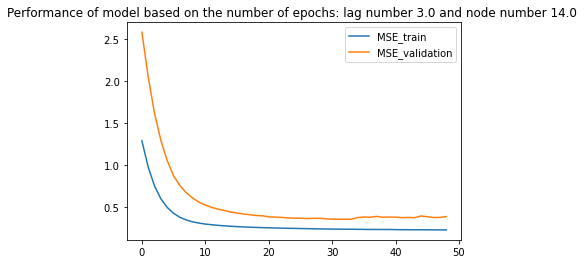

the number of nodes in the hidden layer is: 15.0 
Epoch 23: early stopping
mseval 0.43


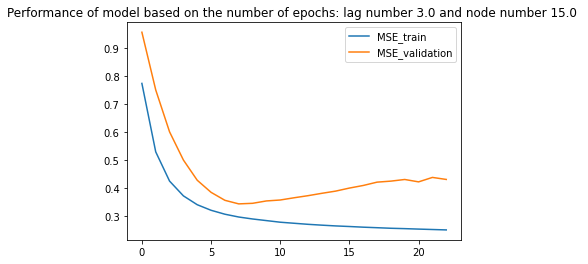

the number of nodes in the hidden layer is: 16.0 
Epoch 37: early stopping
mseval 0.53


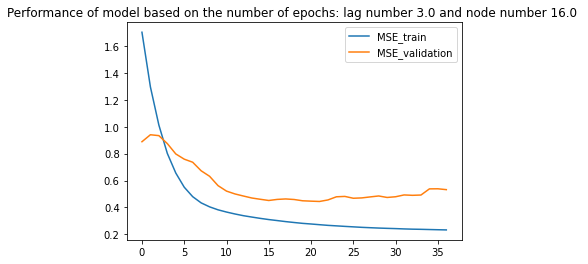

the number of nodes in the hidden layer is: 17.0 
Epoch 82: early stopping
mseval 0.45


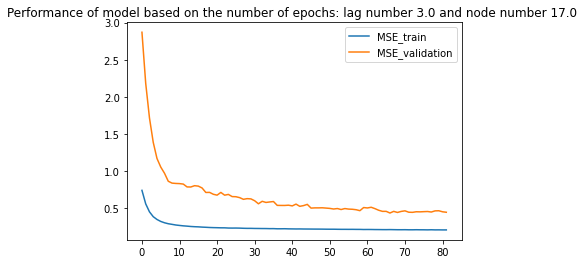

the number of nodes in the hidden layer is: 18.0 
Epoch 64: early stopping
mseval 0.82


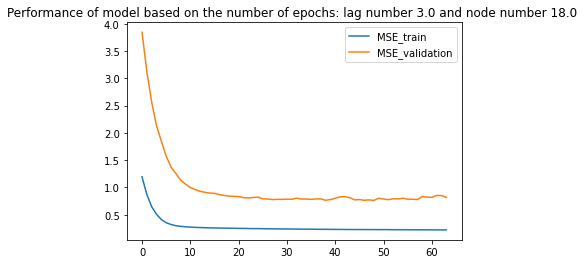

the number of nodes in the hidden layer is: 19.0 
Epoch 55: early stopping
mseval 0.43


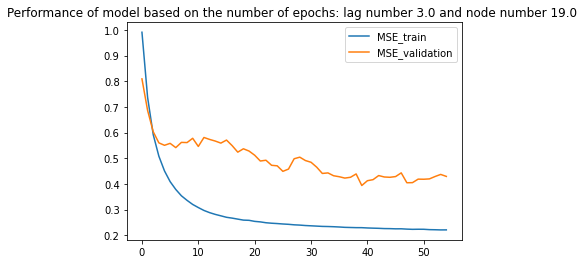

the number of nodes in the hidden layer is: 20.0 
Epoch 74: early stopping
mseval 0.61


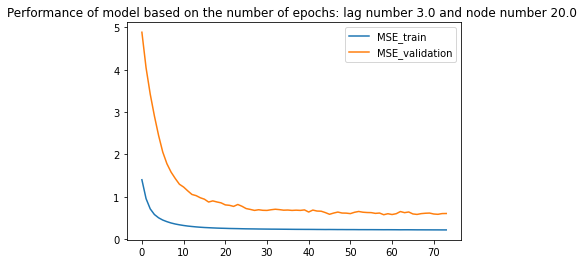

the time lag for prediction is: 4.0 
the number of nodes in the hidden layer is: 4.0 
Epoch 75: early stopping
mseval 1.47


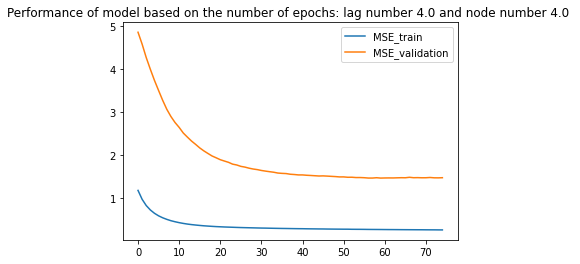

the number of nodes in the hidden layer is: 5.0 
Epoch 58: early stopping
mseval 1.19


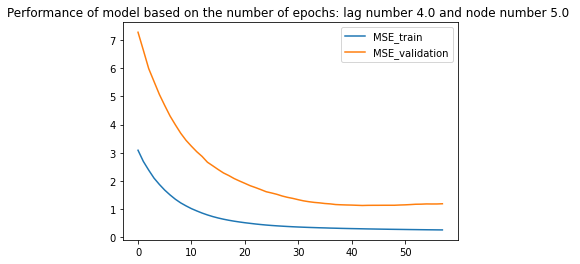

the number of nodes in the hidden layer is: 6.0 
Epoch 20: early stopping
mseval 1.51


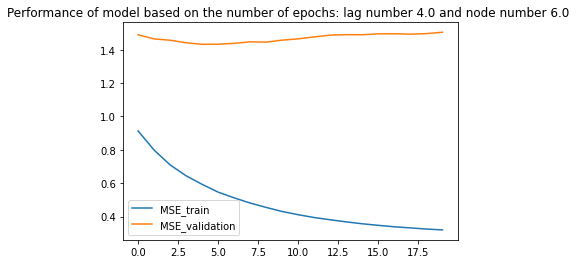

the number of nodes in the hidden layer is: 7.0 
Epoch 99: early stopping
mseval 0.92


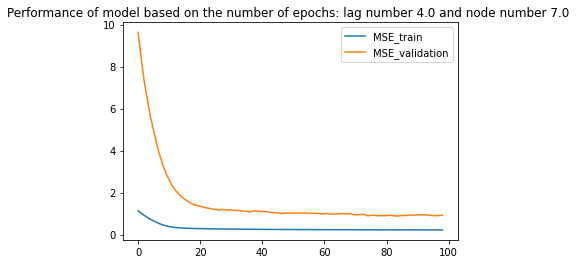

the number of nodes in the hidden layer is: 8.0 
Epoch 108: early stopping
mseval 0.76


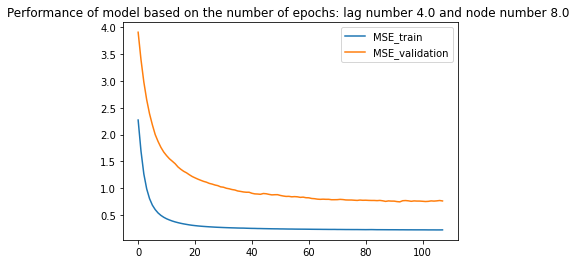

the number of nodes in the hidden layer is: 9.0 
Epoch 29: early stopping
mseval 1.24


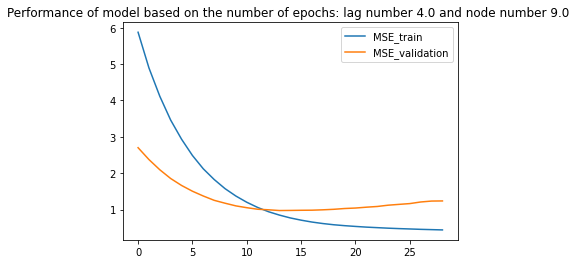

the number of nodes in the hidden layer is: 10.0 
Epoch 51: early stopping
mseval 0.72


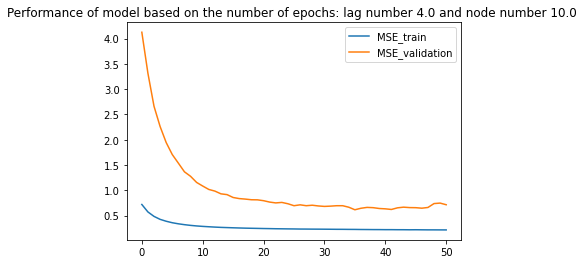

the number of nodes in the hidden layer is: 11.0 
Epoch 30: early stopping
mseval 0.56


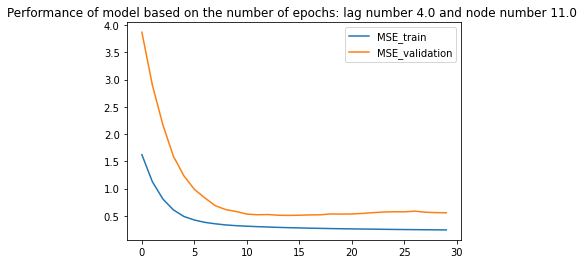

the number of nodes in the hidden layer is: 12.0 
Epoch 48: early stopping
mseval 1.00


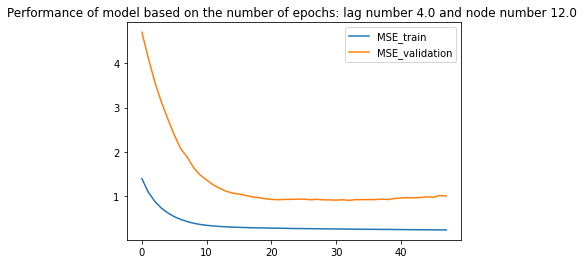

the number of nodes in the hidden layer is: 13.0 
Epoch 159: early stopping
mseval 0.79


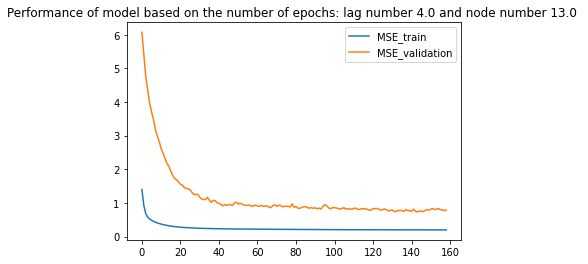

the number of nodes in the hidden layer is: 14.0 
Epoch 26: early stopping
mseval 0.91


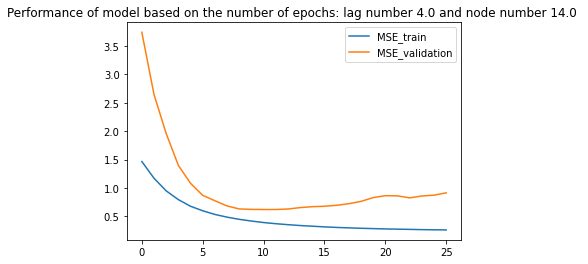

the number of nodes in the hidden layer is: 15.0 
Epoch 48: early stopping
mseval 0.69


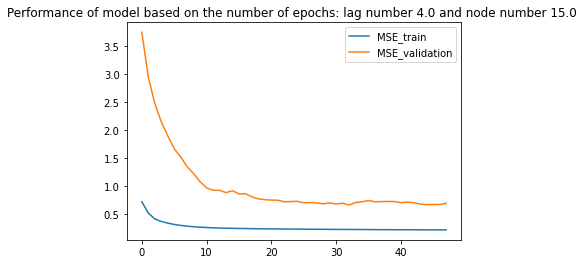

the number of nodes in the hidden layer is: 16.0 
Epoch 41: early stopping
mseval 0.55


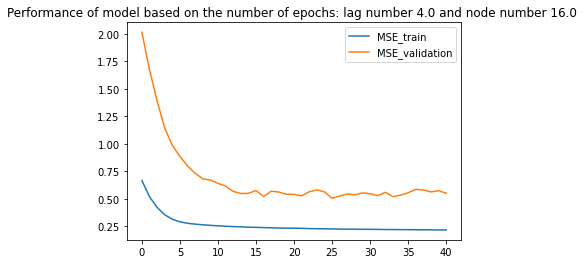

the number of nodes in the hidden layer is: 17.0 
Epoch 33: early stopping
mseval 0.43


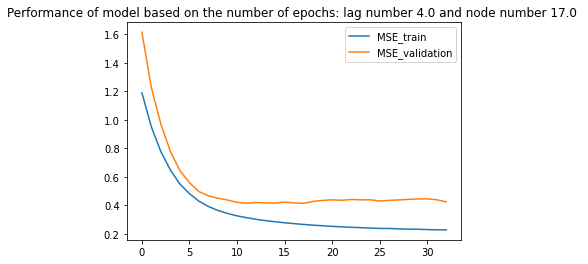

the number of nodes in the hidden layer is: 18.0 
Epoch 20: early stopping
mseval 0.55


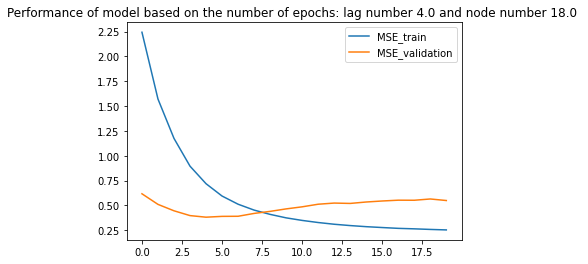

the number of nodes in the hidden layer is: 19.0 
Epoch 21: early stopping
mseval 0.48


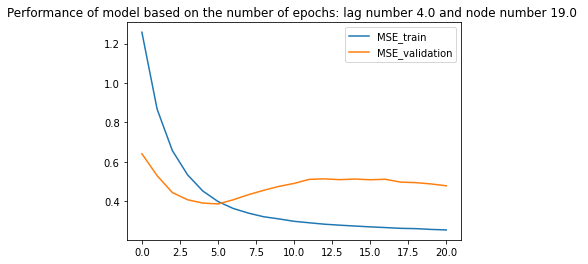

the number of nodes in the hidden layer is: 20.0 
Epoch 30: early stopping
mseval 0.44


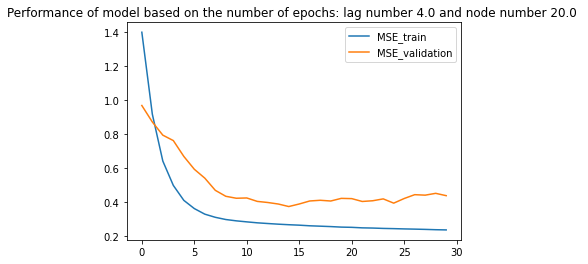

8
the time lag for prediction is: 2.0 
the number of nodes in the hidden layer is: 4.0 
Epoch 24: early stopping
mseval 0.44


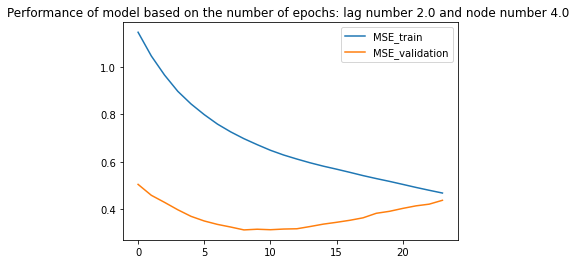

the number of nodes in the hidden layer is: 5.0 
Epoch 40: early stopping
mseval 0.55


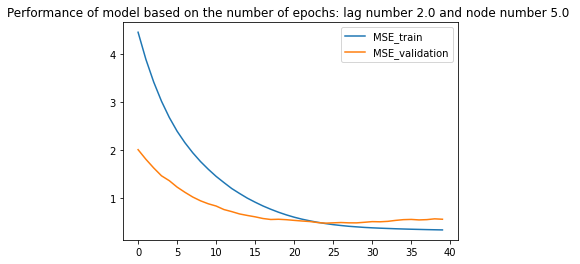

the number of nodes in the hidden layer is: 6.0 
Epoch 19: early stopping
mseval 0.55


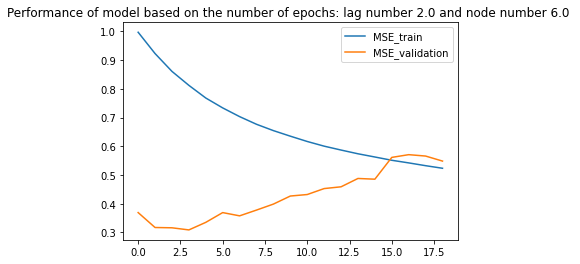

the number of nodes in the hidden layer is: 7.0 
Epoch 19: early stopping
mseval 0.46


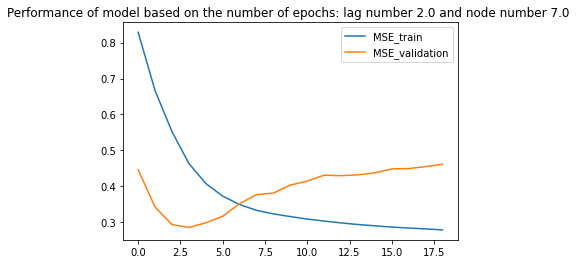

the number of nodes in the hidden layer is: 8.0 
Epoch 16: early stopping
mseval 0.86


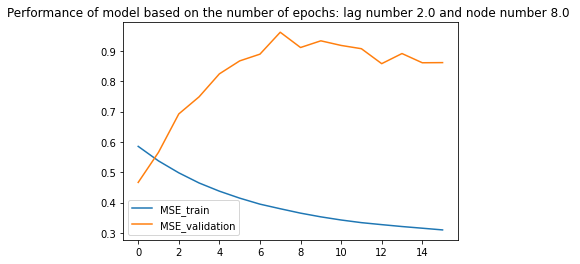

the number of nodes in the hidden layer is: 9.0 
Epoch 30: early stopping
mseval 0.31


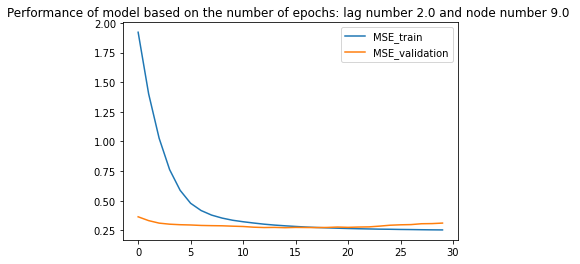

the number of nodes in the hidden layer is: 10.0 
Epoch 137: early stopping
mseval 0.49


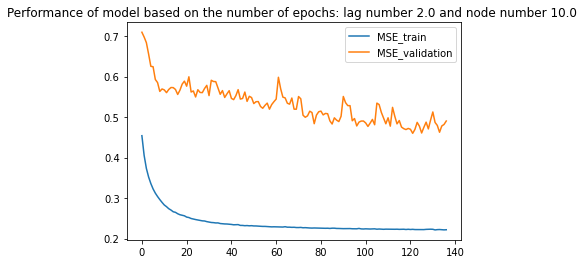

the number of nodes in the hidden layer is: 11.0 
Epoch 29: early stopping
mseval 0.47


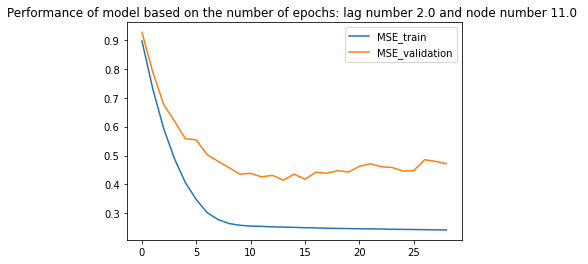

the number of nodes in the hidden layer is: 12.0 
Epoch 19: early stopping
mseval 0.45


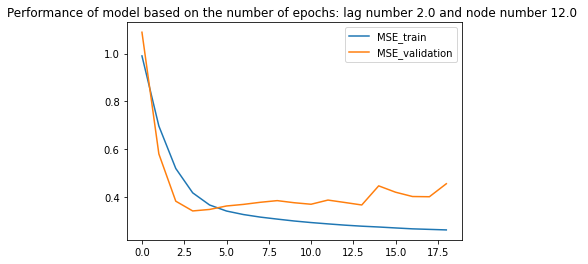

the number of nodes in the hidden layer is: 13.0 
Epoch 31: early stopping
mseval 0.50


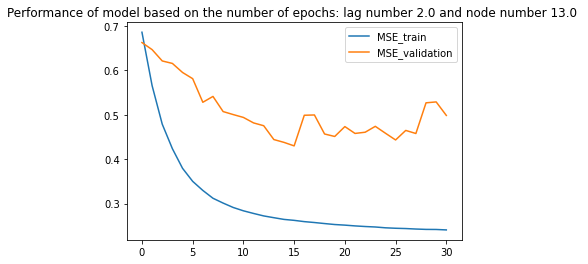

the number of nodes in the hidden layer is: 14.0 
Epoch 20: early stopping
mseval 0.43


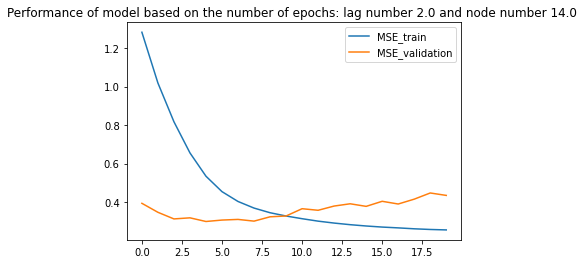

the number of nodes in the hidden layer is: 15.0 
Epoch 22: early stopping
mseval 0.57


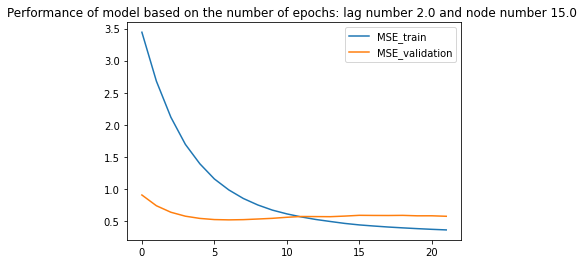

the number of nodes in the hidden layer is: 16.0 
Epoch 85: early stopping
mseval 0.58


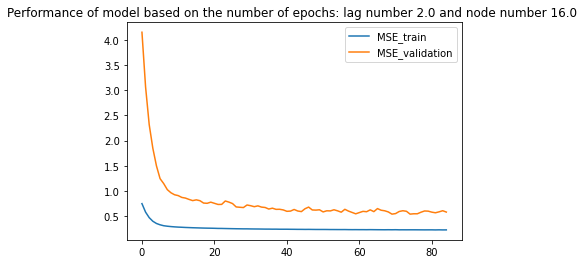

the number of nodes in the hidden layer is: 17.0 
Epoch 32: early stopping
mseval 0.59


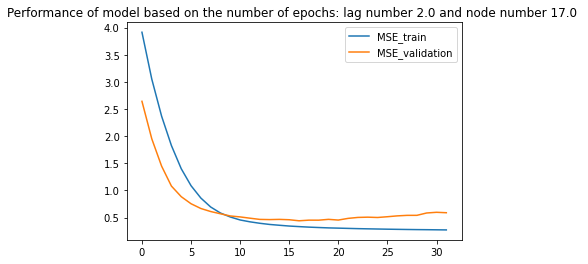

the number of nodes in the hidden layer is: 18.0 
Epoch 42: early stopping
mseval 0.64


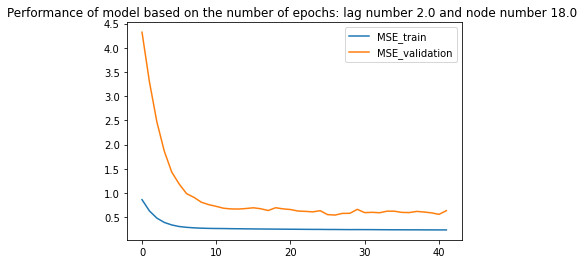

the number of nodes in the hidden layer is: 19.0 
Epoch 19: early stopping
mseval 0.51


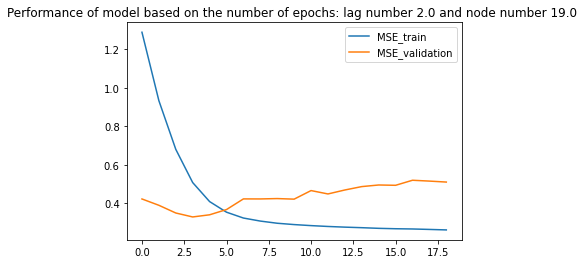

the number of nodes in the hidden layer is: 20.0 
Epoch 33: early stopping
mseval 0.55


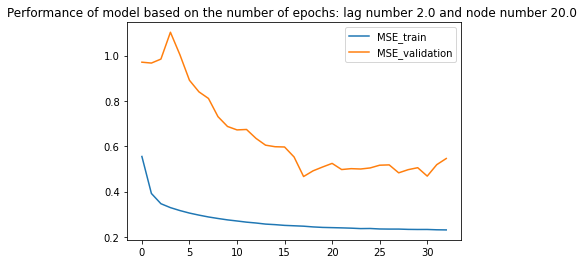

the time lag for prediction is: 3.0 
the number of nodes in the hidden layer is: 4.0 
mseval 0.76


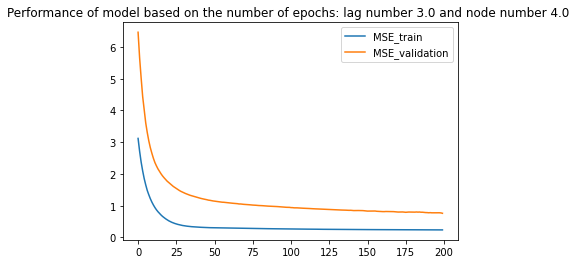

the number of nodes in the hidden layer is: 5.0 
Epoch 164: early stopping
mseval 0.86


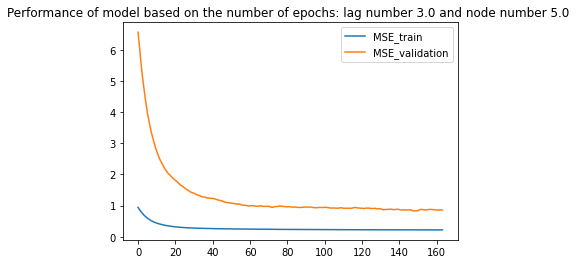

the number of nodes in the hidden layer is: 6.0 
Epoch 92: early stopping
mseval 0.37


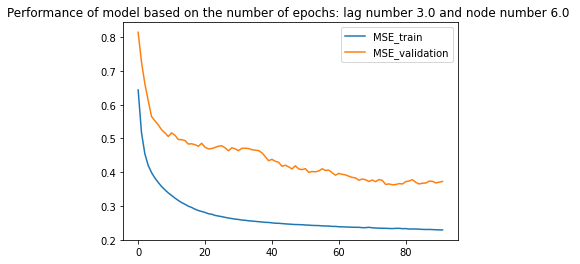

the number of nodes in the hidden layer is: 7.0 
Epoch 35: early stopping
mseval 0.34


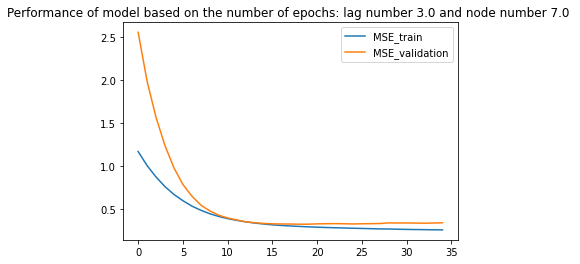

the number of nodes in the hidden layer is: 8.0 
Epoch 157: early stopping
mseval 0.99


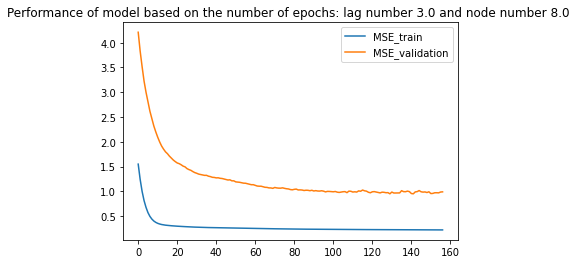

the number of nodes in the hidden layer is: 9.0 
Epoch 30: early stopping
mseval 0.77


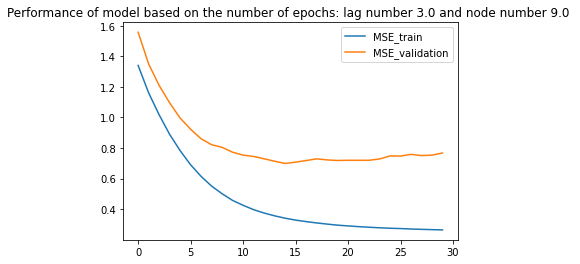

the number of nodes in the hidden layer is: 10.0 
Epoch 66: early stopping
mseval 0.80


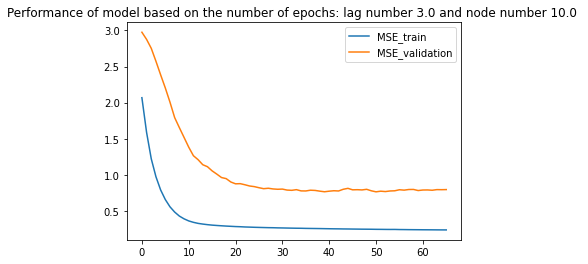

the number of nodes in the hidden layer is: 11.0 
Epoch 53: early stopping
mseval 0.44


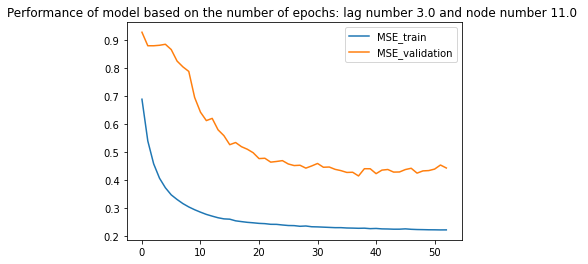

the number of nodes in the hidden layer is: 12.0 
Epoch 38: early stopping
mseval 0.38


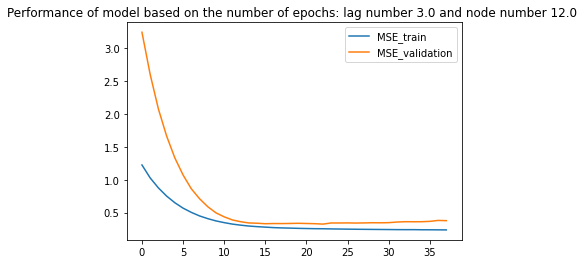

the number of nodes in the hidden layer is: 13.0 
Epoch 174: early stopping
mseval 0.79


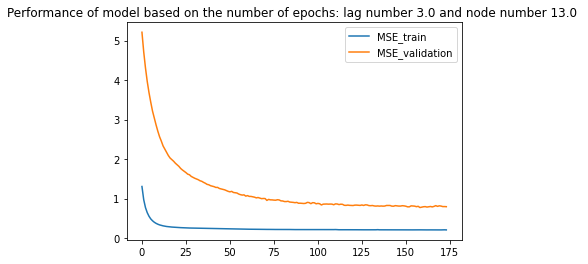

the number of nodes in the hidden layer is: 14.0 
Epoch 26: early stopping
mseval 0.49


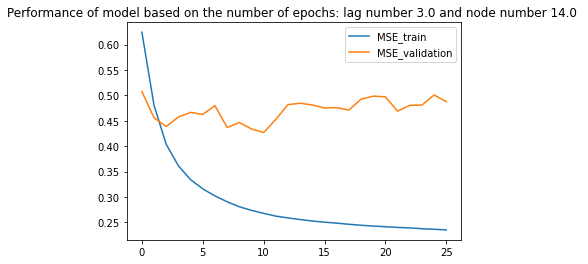

the number of nodes in the hidden layer is: 15.0 
Epoch 16: early stopping
mseval 0.63


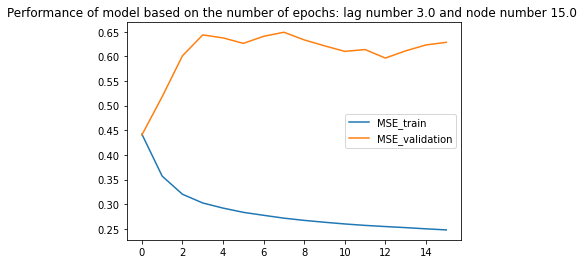

the number of nodes in the hidden layer is: 16.0 
Epoch 20: early stopping
mseval 0.79


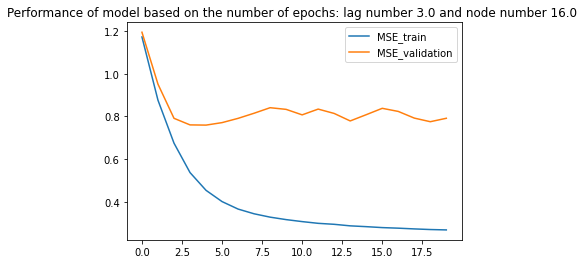

the number of nodes in the hidden layer is: 17.0 
Epoch 28: early stopping
mseval 0.59


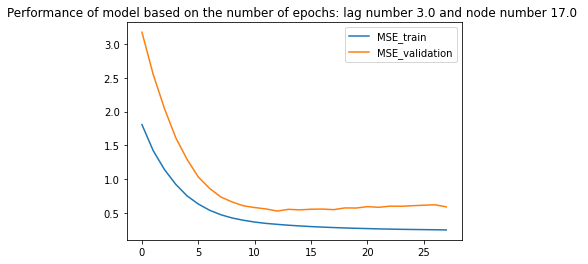

the number of nodes in the hidden layer is: 18.0 
Epoch 24: early stopping
mseval 0.69


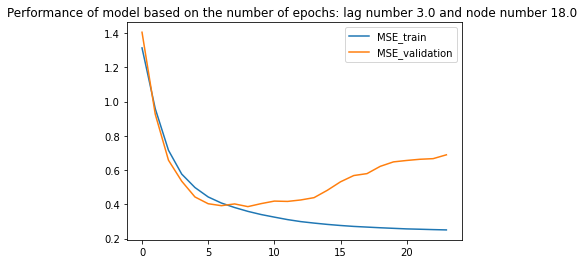

the number of nodes in the hidden layer is: 19.0 
Epoch 64: early stopping
mseval 0.51


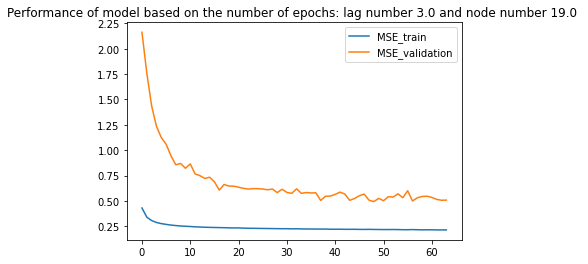

the number of nodes in the hidden layer is: 20.0 
Epoch 89: early stopping
mseval 0.48


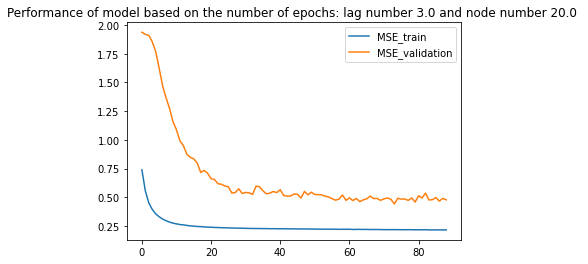

the time lag for prediction is: 4.0 
the number of nodes in the hidden layer is: 4.0 
mseval 1.14


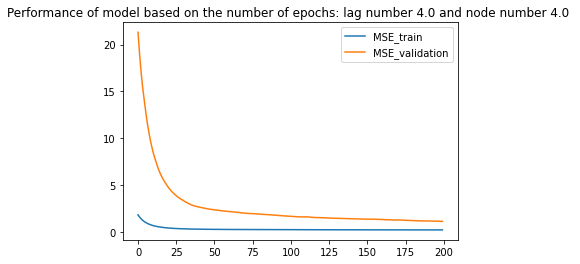

the number of nodes in the hidden layer is: 5.0 
Epoch 31: early stopping
mseval 0.42


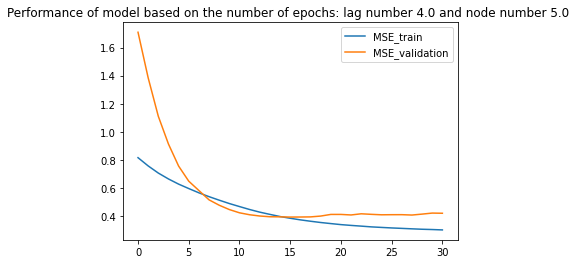

the number of nodes in the hidden layer is: 6.0 
Epoch 30: early stopping
mseval 0.63


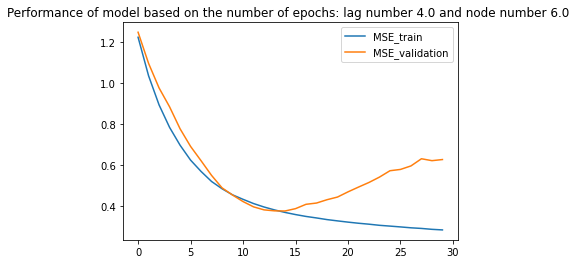

the number of nodes in the hidden layer is: 7.0 
Epoch 132: early stopping
mseval 0.45


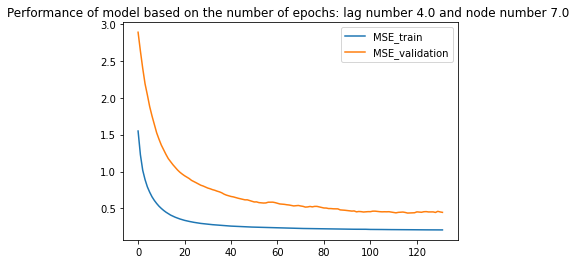

the number of nodes in the hidden layer is: 8.0 
Epoch 98: early stopping
mseval 0.53


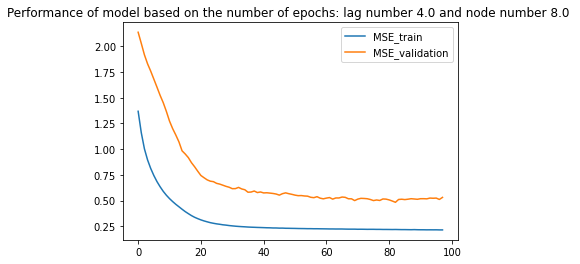

the number of nodes in the hidden layer is: 9.0 
Epoch 31: early stopping
mseval 0.56


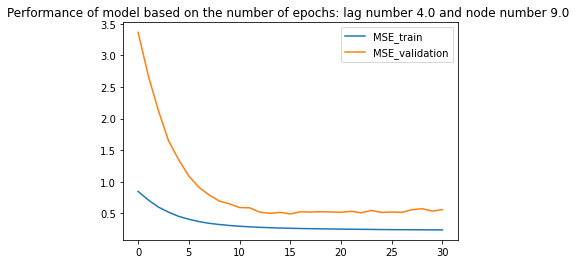

the number of nodes in the hidden layer is: 10.0 
Epoch 85: early stopping
mseval 1.01


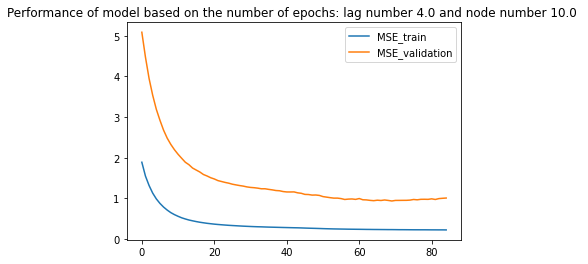

the number of nodes in the hidden layer is: 11.0 
Epoch 174: early stopping
mseval 0.69


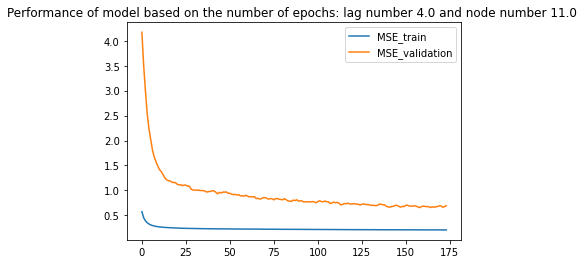

the number of nodes in the hidden layer is: 12.0 
Epoch 153: early stopping
mseval 0.43


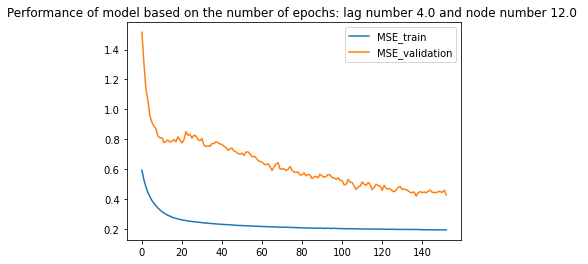

the number of nodes in the hidden layer is: 13.0 
Epoch 31: early stopping
mseval 0.42


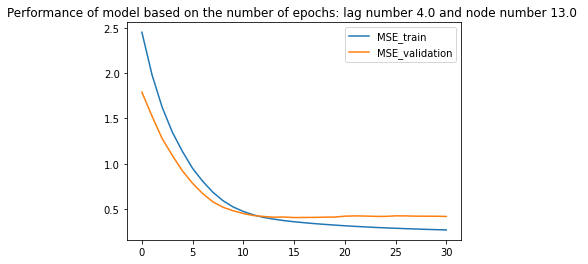

the number of nodes in the hidden layer is: 14.0 
Epoch 68: early stopping
mseval 0.69


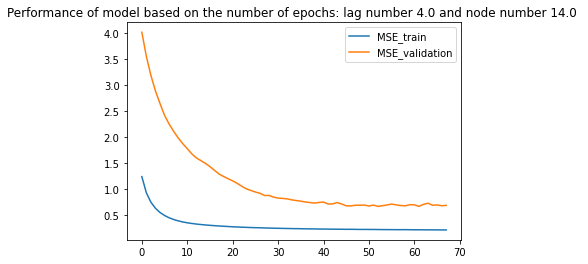

the number of nodes in the hidden layer is: 15.0 
Epoch 39: early stopping
mseval 0.69


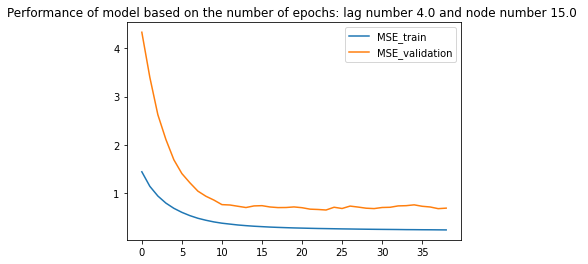

the number of nodes in the hidden layer is: 16.0 
Epoch 24: early stopping
mseval 0.43


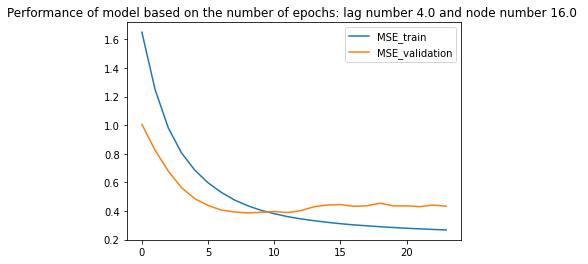

the number of nodes in the hidden layer is: 17.0 
Epoch 22: early stopping
mseval 0.59


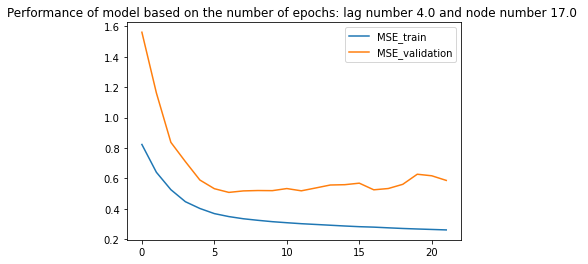

the number of nodes in the hidden layer is: 18.0 
Epoch 41: early stopping
mseval 0.57


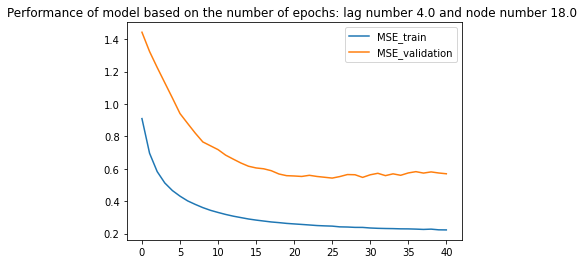

the number of nodes in the hidden layer is: 19.0 
Epoch 51: early stopping
mseval 0.82


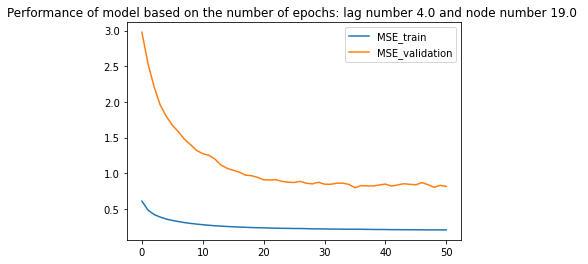

the number of nodes in the hidden layer is: 20.0 
Epoch 78: early stopping
mseval 0.62


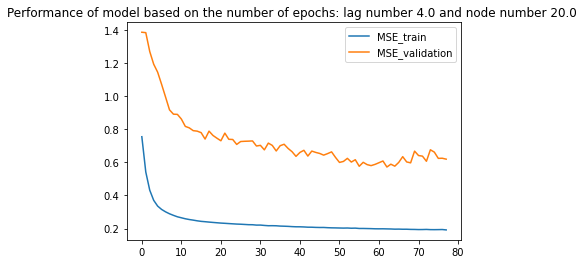

9
the time lag for prediction is: 2.0 
the number of nodes in the hidden layer is: 4.0 
Epoch 66: early stopping
mseval 0.41


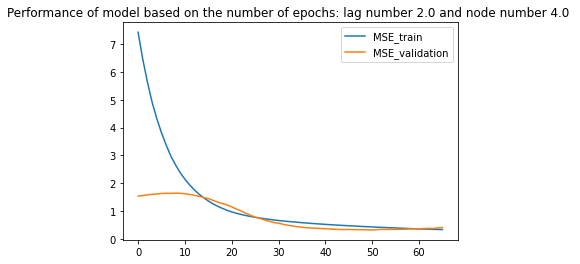

the number of nodes in the hidden layer is: 5.0 
Epoch 47: early stopping
mseval 0.59


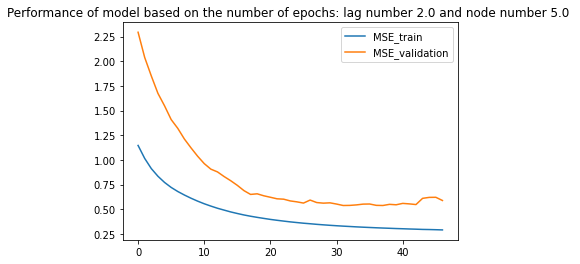

the number of nodes in the hidden layer is: 6.0 
Epoch 142: early stopping
mseval 0.67


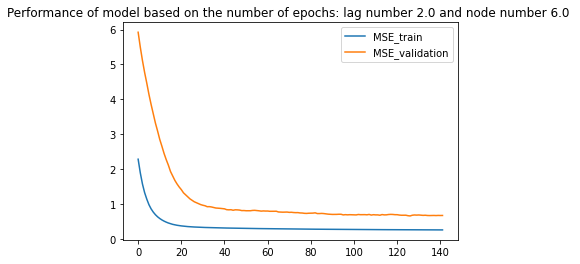

the number of nodes in the hidden layer is: 7.0 
Epoch 55: early stopping
mseval 0.55


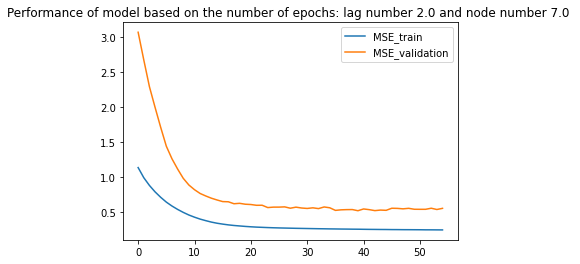

the number of nodes in the hidden layer is: 8.0 
Epoch 24: early stopping
mseval 0.30


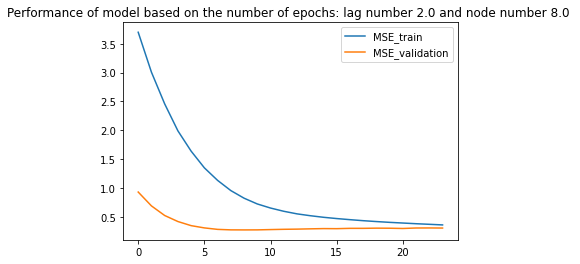

the number of nodes in the hidden layer is: 9.0 
Epoch 121: early stopping
mseval 0.52


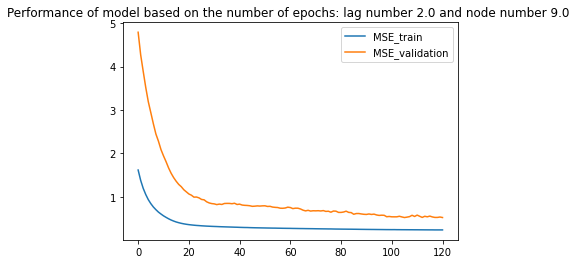

the number of nodes in the hidden layer is: 10.0 
Epoch 30: early stopping
mseval 0.40


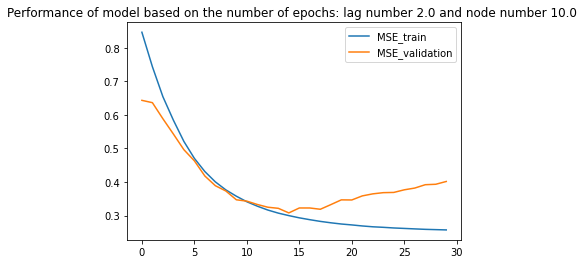

the number of nodes in the hidden layer is: 11.0 
Epoch 159: early stopping
mseval 0.57


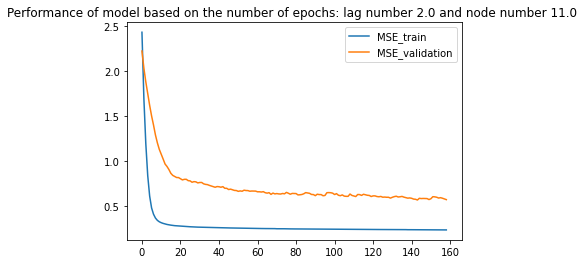

the number of nodes in the hidden layer is: 12.0 
Epoch 73: early stopping
mseval 0.52


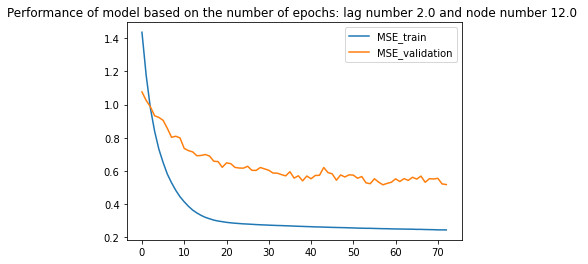

the number of nodes in the hidden layer is: 13.0 
Epoch 65: early stopping
mseval 0.53


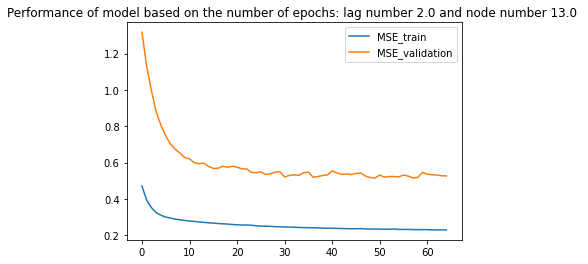

the number of nodes in the hidden layer is: 14.0 
Epoch 59: early stopping
mseval 0.59


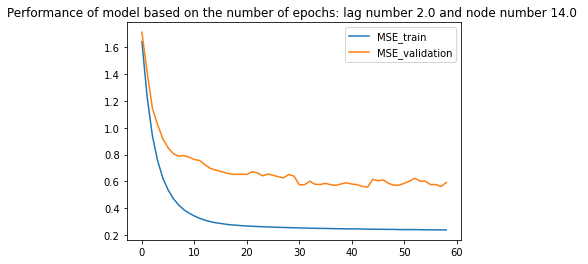

the number of nodes in the hidden layer is: 15.0 
Epoch 17: early stopping
mseval 0.49


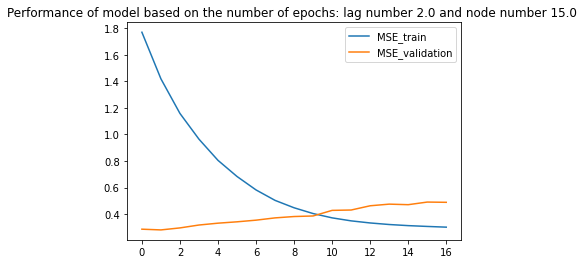

the number of nodes in the hidden layer is: 16.0 
Epoch 25: early stopping
mseval 0.63


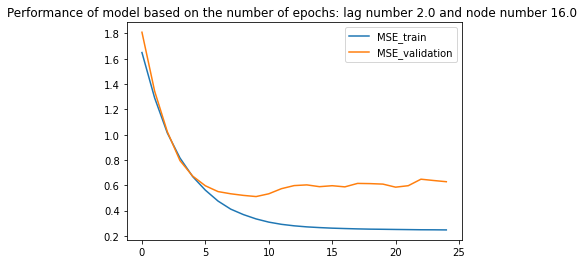

the number of nodes in the hidden layer is: 17.0 
Epoch 52: early stopping
mseval 0.52


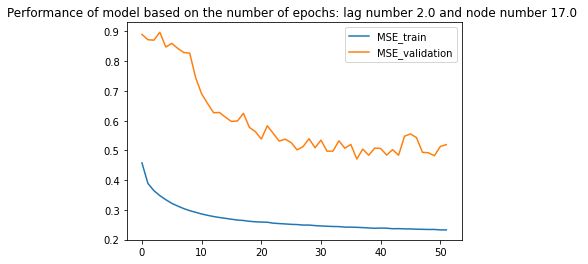

the number of nodes in the hidden layer is: 18.0 
Epoch 23: early stopping
mseval 0.55


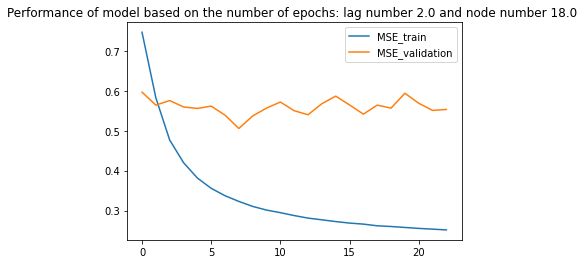

the number of nodes in the hidden layer is: 19.0 
Epoch 83: early stopping
mseval 0.45


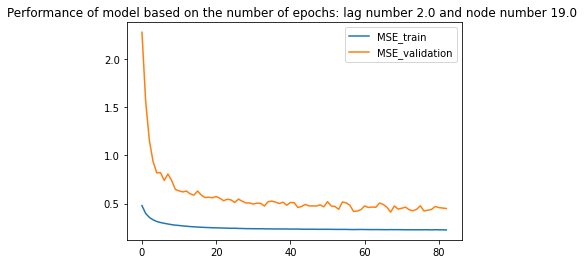

the number of nodes in the hidden layer is: 20.0 
Epoch 57: early stopping
mseval 0.61


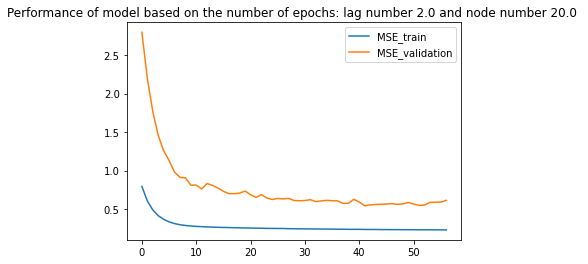

the time lag for prediction is: 3.0 
the number of nodes in the hidden layer is: 4.0 
Epoch 30: early stopping
mseval 0.36


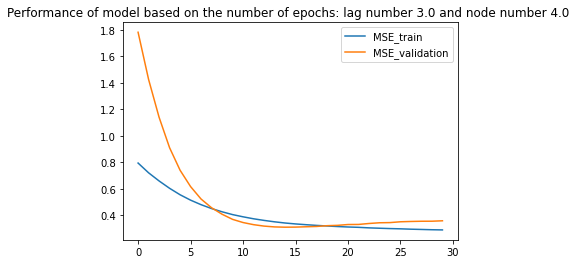

the number of nodes in the hidden layer is: 5.0 
Epoch 36: early stopping
mseval 0.72


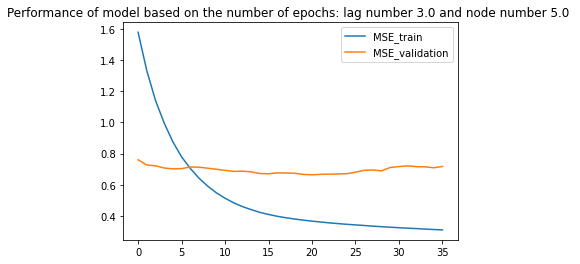

the number of nodes in the hidden layer is: 6.0 
Epoch 199: early stopping
mseval 0.59


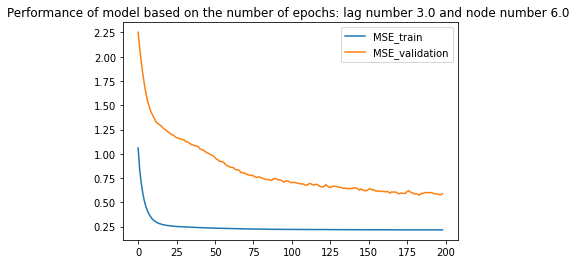

the number of nodes in the hidden layer is: 7.0 
Epoch 117: early stopping
mseval 0.87


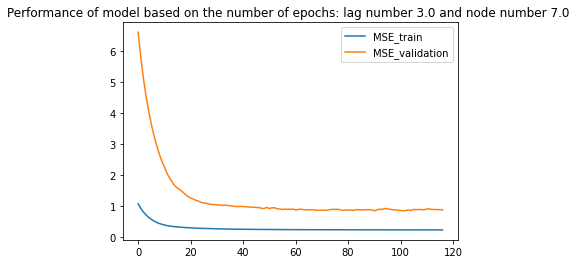

the number of nodes in the hidden layer is: 8.0 
Epoch 144: early stopping
mseval 0.74


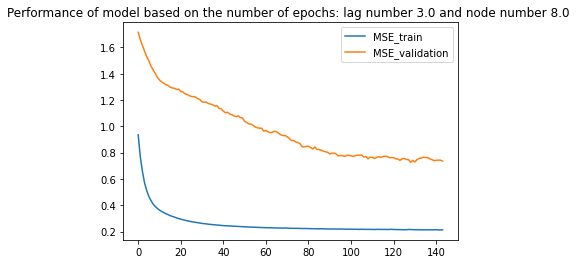

the number of nodes in the hidden layer is: 9.0 
Epoch 134: early stopping
mseval 1.03


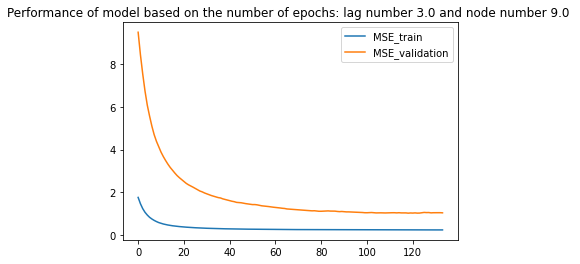

the number of nodes in the hidden layer is: 10.0 
Epoch 48: early stopping
mseval 0.82


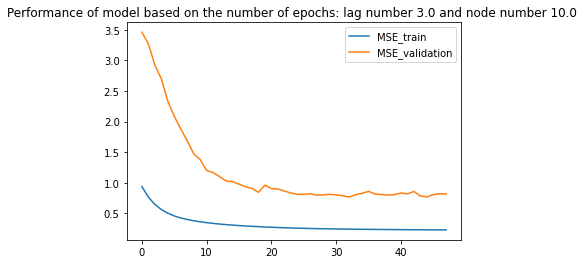

the number of nodes in the hidden layer is: 11.0 
Epoch 29: early stopping
mseval 0.59


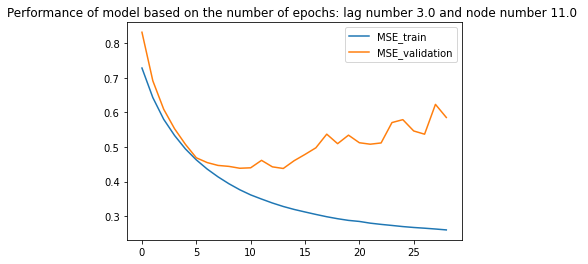

the number of nodes in the hidden layer is: 12.0 
Epoch 37: early stopping
mseval 0.56


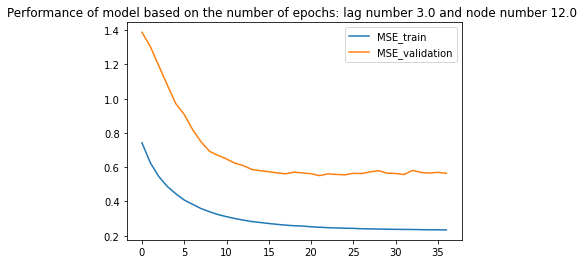

the number of nodes in the hidden layer is: 13.0 
Epoch 21: early stopping
mseval 0.62


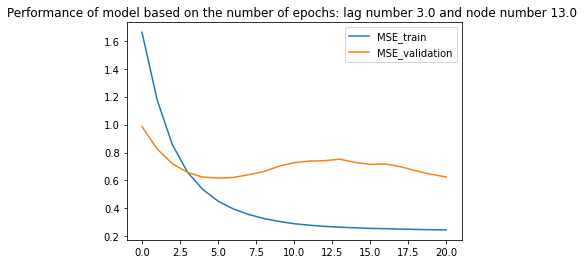

the number of nodes in the hidden layer is: 14.0 
Epoch 30: early stopping
mseval 0.35


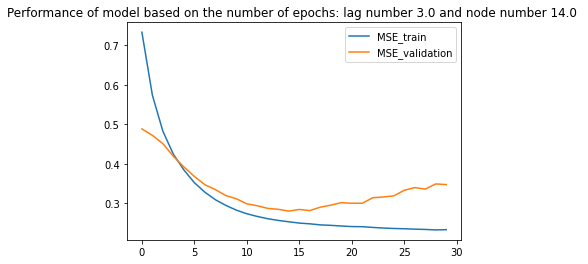

the number of nodes in the hidden layer is: 15.0 
Epoch 43: early stopping
mseval 0.68


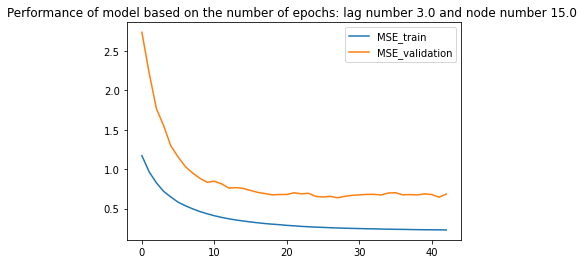

the number of nodes in the hidden layer is: 16.0 
Epoch 36: early stopping
mseval 0.52


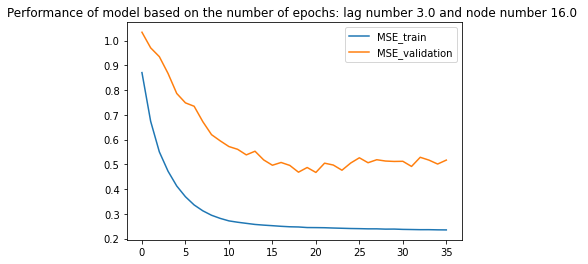

the number of nodes in the hidden layer is: 17.0 
Epoch 71: early stopping
mseval 0.49


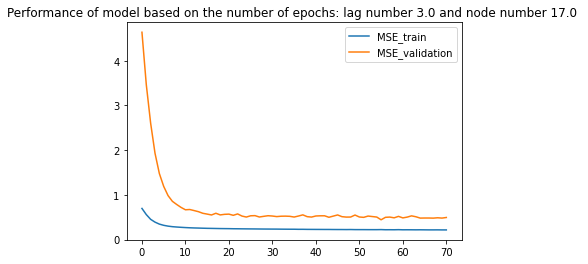

the number of nodes in the hidden layer is: 18.0 
Epoch 75: early stopping
mseval 0.58


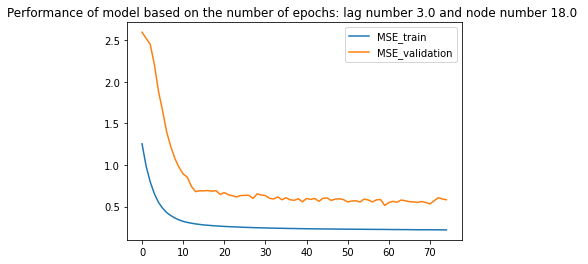

the number of nodes in the hidden layer is: 19.0 
Epoch 68: early stopping
mseval 0.42


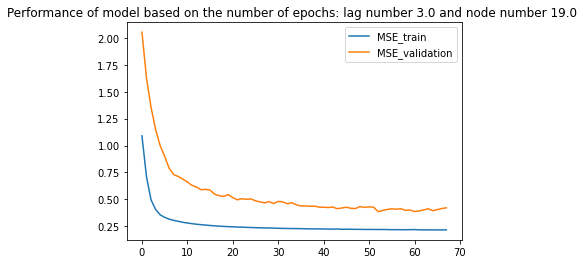

the number of nodes in the hidden layer is: 20.0 
Epoch 29: early stopping
mseval 0.51


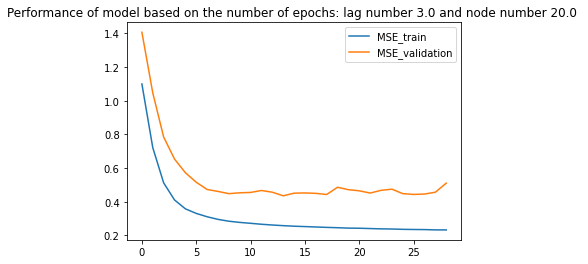

the time lag for prediction is: 4.0 
the number of nodes in the hidden layer is: 4.0 
Epoch 53: early stopping
mseval 0.54


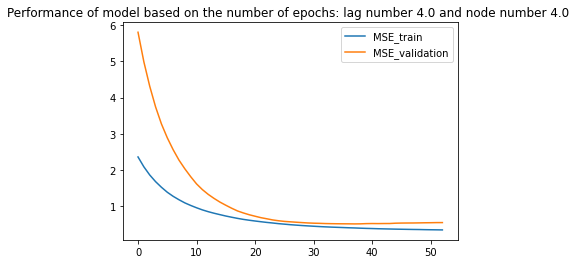

the number of nodes in the hidden layer is: 5.0 
Epoch 38: early stopping
mseval 0.47


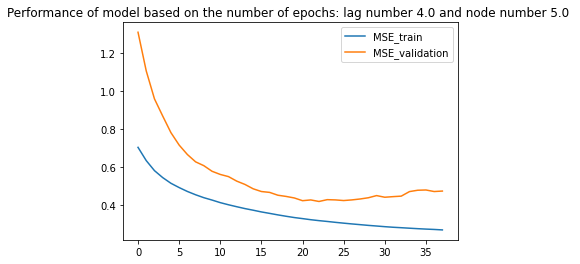

the number of nodes in the hidden layer is: 6.0 
Epoch 54: early stopping
mseval 0.50


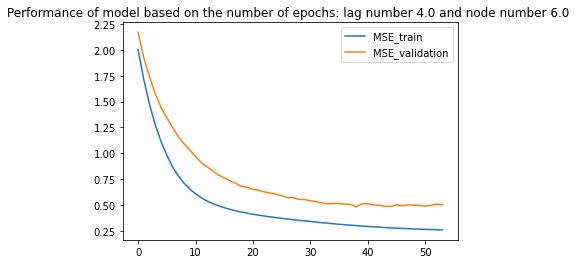

the number of nodes in the hidden layer is: 7.0 
Epoch 83: early stopping
mseval 0.33


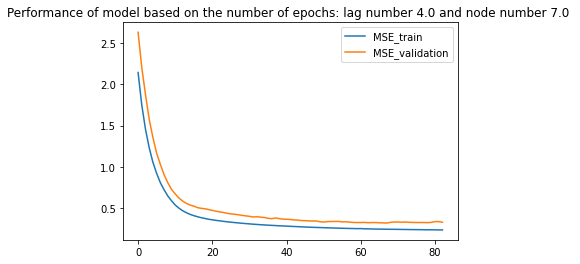

the number of nodes in the hidden layer is: 8.0 
Epoch 22: early stopping
mseval 0.66


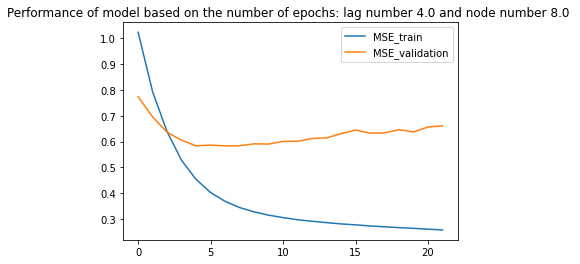

the number of nodes in the hidden layer is: 9.0 
Epoch 103: early stopping
mseval 0.52


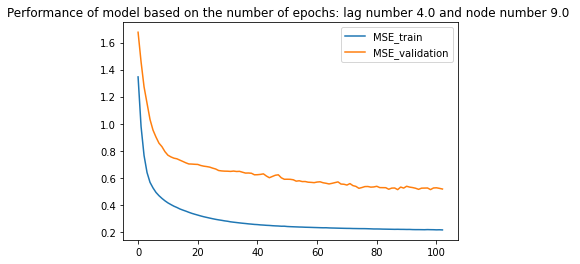

the number of nodes in the hidden layer is: 10.0 
Epoch 34: early stopping
mseval 0.44


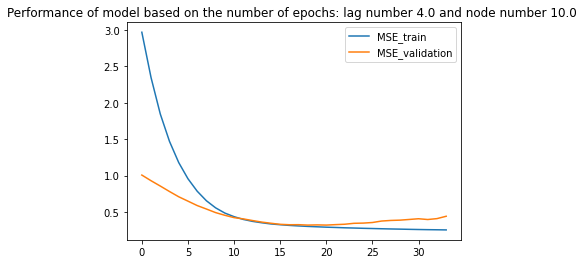

the number of nodes in the hidden layer is: 11.0 
Epoch 90: early stopping
mseval 0.64


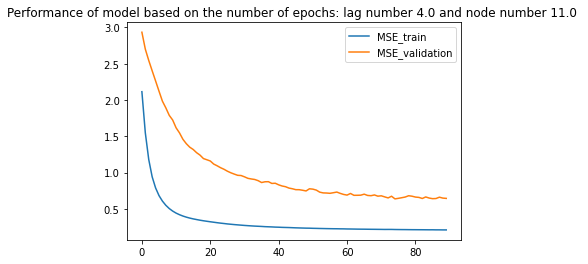

the number of nodes in the hidden layer is: 12.0 
Epoch 108: early stopping
mseval 0.49


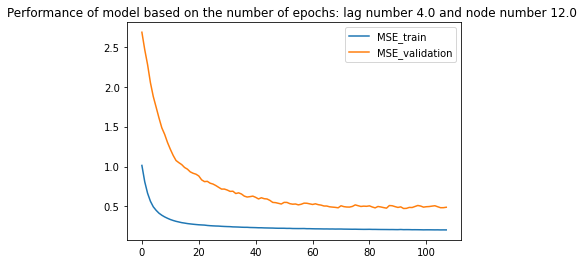

the number of nodes in the hidden layer is: 13.0 
Epoch 48: early stopping
mseval 0.32


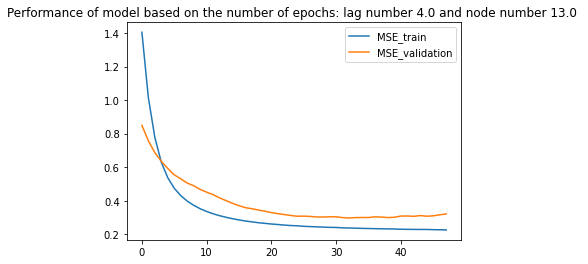

the number of nodes in the hidden layer is: 14.0 
Epoch 17: early stopping
mseval 0.82


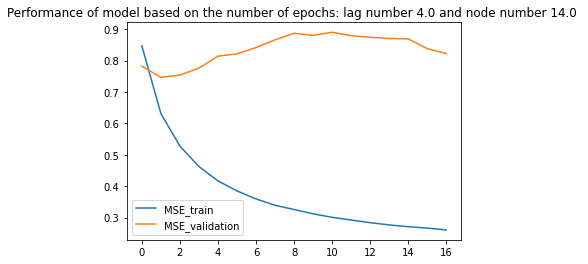

the number of nodes in the hidden layer is: 15.0 
Epoch 92: early stopping
mseval 0.91


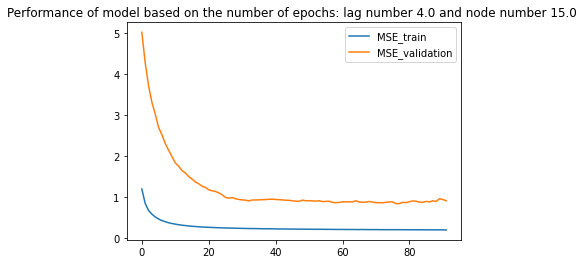

the number of nodes in the hidden layer is: 16.0 
Epoch 196: early stopping
mseval 0.71


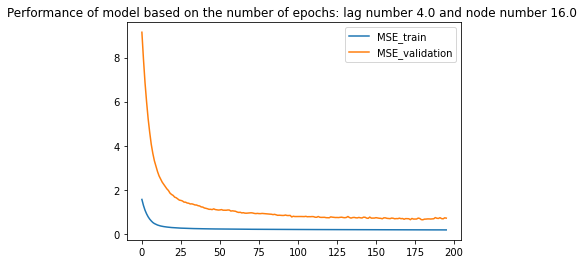

the number of nodes in the hidden layer is: 17.0 
Epoch 29: early stopping
mseval 0.38


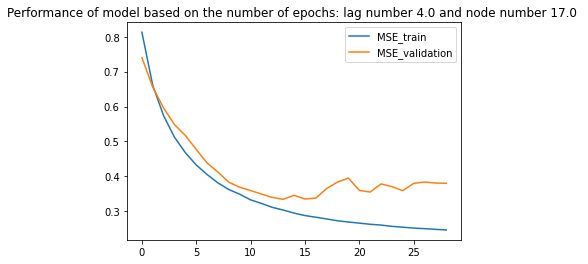

the number of nodes in the hidden layer is: 18.0 
Epoch 24: early stopping
mseval 0.38


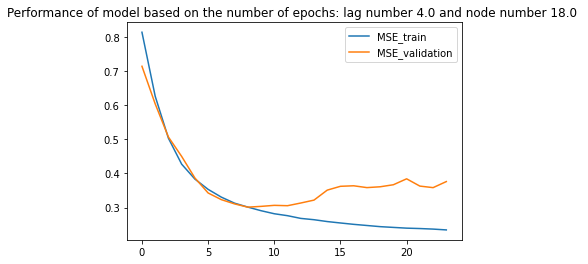

the number of nodes in the hidden layer is: 19.0 
Epoch 27: early stopping
mseval 0.79


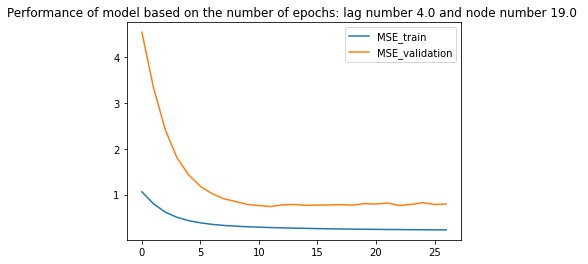

the number of nodes in the hidden layer is: 20.0 
Epoch 39: early stopping
mseval 0.57


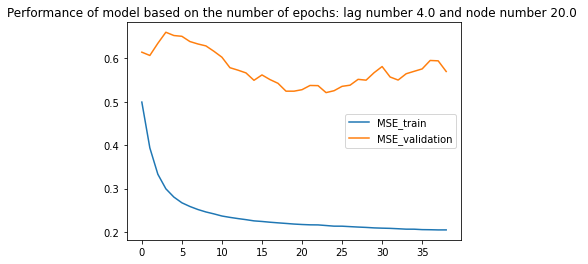

In [ ]:
sumMseTr = np.zeros(shape=(len(seqList), len(nodeList)) )
sumMaeTr = np.zeros(shape=(len(seqList), len(nodeList)) )
sumMseVal = np.zeros(shape=(len(seqList), len(nodeList)) )
sumMaeVal = np.zeros(shape=(len(seqList), len(nodeList)) )

iteration = 10; 
# loop 
for it in range(iteration):
  print(it); 
  for seq_size in seqList: 
    print ("the time lag for prediction is: %.1f " %(seq_size));
    i = seqList.index(seq_size)  # identify the position of the seq_size in the list
    for nodeNum in nodeList:
     print("the number of nodes in the hidden layer is: %.1f " %(nodeNum));
     j = np.where(nodeList == nodeNum)
     mseTr, maeTr, mseVal, maeVal, history = WaveletNNmodel(signal, seq_size, windowSize, nodeNum, timeLead =1, epochNum = 200)
     sumMseTr[i,j] = sumMseTr[i,j] + mseTr; 
     sumMaeTr[i,j] =  sumMaeTr[i,j] + maeTr; 
     sumMseVal[i,j] = sumMseVal[i,j] + mseVal; 
     sumMaeVal[i,j] =  sumMaeVal[i,j] + maeVal; 
     
     print ('mseval %.2f' %(mseVal))
     # plot training history (check the performance of the number of epochs)
     plt.title("Performance of model based on the number of epochs: lag number %.1f and node number %.1f " %(seq_size, nodeNum))
     plt.plot(history.history['loss'], label='MSE_train')
     plt.plot(history.history['val_loss'], label='MSE_validation')
     plt.legend()
     plt.show()

In [ ]:
avgMseTr = sumMseTr/iteration
avgMaeTr = sumMaeTr/iteration
avgMseVal = sumMseVal/iteration 
avgMaeVal = sumMaeVal/iteration 

In [ ]:
avgMseVal

array([[0.6096318 , 0.63354351, 0.59601031, 0.64845881, 0.65645442,
        0.50962167, 0.51719111, 0.54941841, 0.52042656, 0.49273586,
        0.54584436, 0.50402175, 0.5636413 , 0.51650758, 0.5466355 ,
        0.51590142, 0.52079348],
       [0.69278775, 0.63139666, 0.51195254, 0.67988224, 0.56907526,
        0.57316462, 0.65929483, 0.52471707, 0.64322411, 0.54001788,
        0.49703585, 0.54179803, 0.62419184, 0.55887846, 0.55370114,
        0.49781944, 0.54413132],
       [0.78064276, 0.80039798, 0.66704219, 0.65674636, 0.65152338,
        0.64331454, 0.6763628 , 0.55227287, 0.77127891, 0.57562422,
        0.6880967 , 0.54794616, 0.53710068, 0.57639171, 0.60009757,
        0.58127806, 0.48884438]])

In [ ]:
avgMaeVal

array([[0.66162786, 0.67107762, 0.64523335, 0.67857736, 0.681524  ,
        0.6078422 , 0.6155894 , 0.63686835, 0.61722204, 0.59744965,
        0.63052497, 0.60553051, 0.645057  , 0.61559705, 0.63687509,
        0.61722645, 0.61683326],
       [0.67323962, 0.6532212 , 0.59051506, 0.68174071, 0.61759259,
        0.63141854, 0.6728072 , 0.60657439, 0.67844251, 0.61238302,
        0.58707033, 0.61897356, 0.66530999, 0.62966406, 0.62606063,
        0.58742248, 0.62552342],
       [0.70653361, 0.72576109, 0.65779331, 0.64890453, 0.66848797,
        0.65532864, 0.66884955, 0.60678448, 0.69964822, 0.61999594,
        0.68298424, 0.60544919, 0.59696352, 0.62392008, 0.632096  ,
        0.62983262, 0.5739466 ]])

#average performance of chosen wavelet model 

In [ ]:
nodeList = np.arange(19, 20, 1) 
#seqList = np.array([3,4,5])
#nodeList = np.arange(18, 20, 1) 
seqList = [2]

In [ ]:
def WaveletNNmodel2 (signal, seq_size,windowSize,nodeNum, timeLead,epochNum):
  # data division
  cutpoint1 = int(len(signal)*0.8)
  cutpoint2 = int(len(signal)*0.9)
  train = signal[:(cutpoint1)].values
  valid= signal[:cutpoint2].values
  test = signal.values
  
  # Create input and target format: 
  xTr, yTr = to_sequences(train, timeLead, windowSize, seq_size)
  xVal_retr, yVal_retr= to_sequences(valid, timeLead, windowSize, seq_size)
  xTest_retr, yTest_retr = to_sequences(test, timeLead, windowSize, seq_size)
  xVal = xVal_retr[-(cutpoint2-cutpoint1):,]
  yVal = yVal_retr[-(cutpoint2-cutpoint1):,]
  xTest = xTest_retr[-(len(signal)-cutpoint2):,]
  yTest = yTest_retr[-(len(signal)-cutpoint2):,]
  
  # define model
  model = Sequential()
  model.add(Dense(nodeNum, input_dim=seq_size*3, activation='relu'))   # notice to chane the input_dim with different levels of wavelet decomposition
  model.add(Dense(1))
  model.compile(loss='mean_squared_error', optimizer='adam', metrics = ['mae'])
  #print(model.summary()) 
  # patient early stopping
  es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience = 15)
  history = model.fit(xVal_retr, yVal_retr, verbose=0, epochs=nodeNum, validation_data=(xTest,yTest),callbacks = [es])
  #history = model.fit(xTr, yTr, verbose=0, epochs=nodeNum, validation_data=(xVal,yVal),callbacks = [es])
  # evaluate the model
  mseTr, maeTr = model.evaluate(xVal_retr, yVal_retr, verbose=0)
  mseVal, maeVal = model.evaluate(xTest,yTest,verbose=0)

  return mseTr, maeTr, mseVal, maeVal, history

0
the time lag for prediction is: 2.0 
the number of nodes in the hidden layer is: 19.0 
mseval 0.26


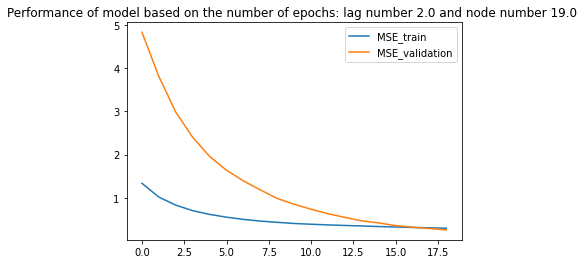

1
the time lag for prediction is: 2.0 
the number of nodes in the hidden layer is: 19.0 
mseval 0.19


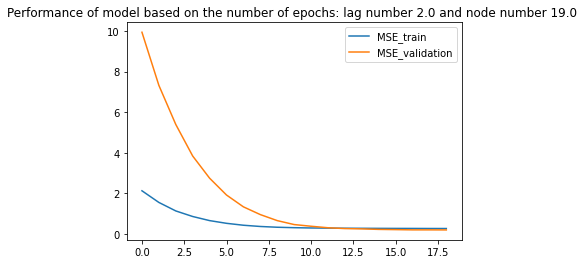

2
the time lag for prediction is: 2.0 
the number of nodes in the hidden layer is: 19.0 
mseval 0.15


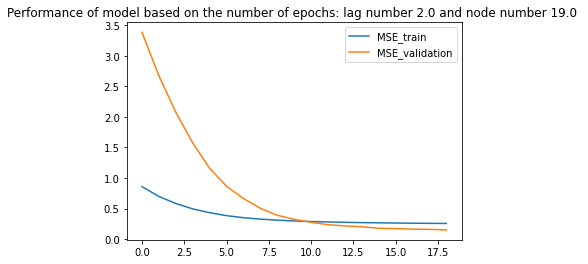

3
the time lag for prediction is: 2.0 
the number of nodes in the hidden layer is: 19.0 
mseval 0.11


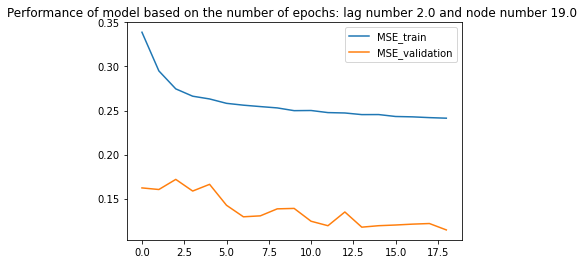

4
the time lag for prediction is: 2.0 
the number of nodes in the hidden layer is: 19.0 
Epoch 17: early stopping
mseval 0.14


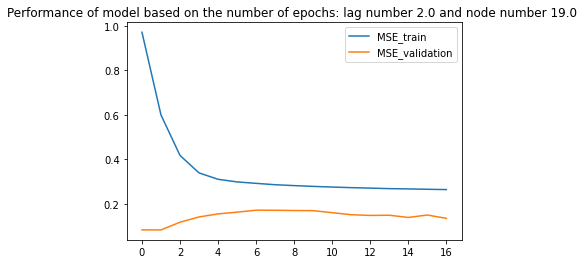

5
the time lag for prediction is: 2.0 
the number of nodes in the hidden layer is: 19.0 
mseval 0.15


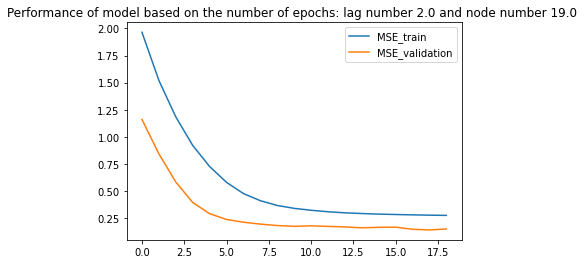

6
the time lag for prediction is: 2.0 
the number of nodes in the hidden layer is: 19.0 
mseval 0.12


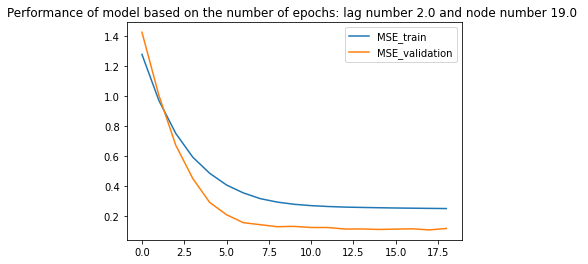

7
the time lag for prediction is: 2.0 
the number of nodes in the hidden layer is: 19.0 
mseval 0.17


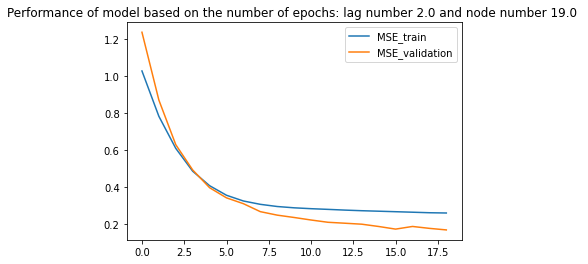

8
the time lag for prediction is: 2.0 
the number of nodes in the hidden layer is: 19.0 
mseval 0.21


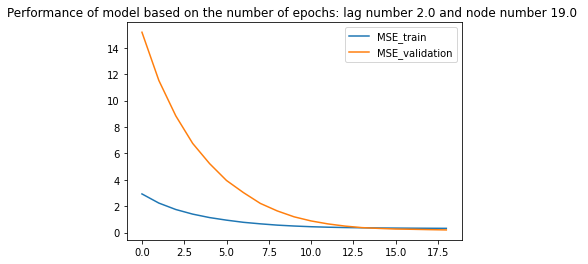

9
the time lag for prediction is: 2.0 
the number of nodes in the hidden layer is: 19.0 
mseval 0.19


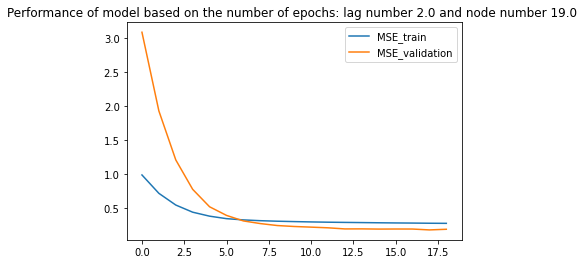

In [ ]:
sumMseTr = np.zeros(shape=(len(seqList), len(nodeList)) )
sumMaeTr = np.zeros(shape=(len(seqList), len(nodeList)) )
sumMseVal = np.zeros(shape=(len(seqList), len(nodeList)) )
sumMaeVal = np.zeros(shape=(len(seqList), len(nodeList)) )

iteration = 10; 
# loop 
for it in range(iteration):
  print(it); 
  for seq_size in seqList: 
    print ("the time lag for prediction is: %.1f " %(seq_size));
    i = seqList.index(seq_size)  # identify the position of the seq_size in the list
    for nodeNum in nodeList:
     print("the number of nodes in the hidden layer is: %.1f " %(nodeNum));
     j = np.where(nodeList == nodeNum)
     mseTr, maeTr, mseVal, maeVal, history = WaveletNNmodel2(signal, seq_size, windowSize, nodeNum, timeLead =1, epochNum = 200)
     sumMseTr[i,j] = sumMseTr[i,j] + mseTr; 
     sumMaeTr[i,j] =  sumMaeTr[i,j] + maeTr; 
     sumMseVal[i,j] = sumMseVal[i,j] + mseVal; 
     sumMaeVal[i,j] =  sumMaeVal[i,j] + maeVal; 
     
     print ('mseval %.2f' %(mseVal))
     # plot training history (check the performance of the number of epochs)
     plt.title("Performance of model based on the number of epochs: lag number %.1f and node number %.1f " %(seq_size, nodeNum))
     plt.plot(history.history['loss'], label='MSE_train')
     plt.plot(history.history['val_loss'], label='MSE_validation')
     plt.legend()
     plt.show()

In [ ]:
avgMseTr = sumMseTr/iteration
avgMaeTr = sumMaeTr/iteration
avgMseVal = sumMseVal/iteration 
avgMaeVal = sumMaeVal/iteration 

In [ ]:
avgMseVal

array([[0.16869162]])

In [ ]:
avgMaeVal

array([[0.33427427]])